In [1]:
import pandas as pd
import numpy as np
import sys
import matplotlib.pyplot as plt

In [7]:
df1=pd.read_excel('suriyeannotated.xlsx')

In [8]:
df1

,Tweet,Sentiment
0,@suleymansoylu O muletici politikamızı degisti...,n
1,Koroplast hissesine tedbir geldi \n\n#Emeklili...,ntr
2,Hatay'daki Suriyeliler: Geri dönmek istiyorlar...,ntr
3,Akıllı Deli'den alıntı.Suriye'deki Suriyeliler...,ntr
4,@aslandegirmenci Esad'ın teröristlerini doldur...,n
...,...,...
1495,Bu yasıma kadar hiç suriyeli gormedim nerde se...,ntr
1496,@Aliceng85904811 @AtamAtaturktur Suriyeliler d...,ntr
1497,@ateistcomtr Agzi kan olan kesin suriyelidir s...,n
1498,@g_demir75 @ipirofficall Olay suriyeliler ile ...,ntr


In [9]:
df1.copy()
df1["Sentiment"].replace({"nte":"Neutral","ntr": "Neutral", "p": "Positive","n":"Negative"}, inplace=True)

In [10]:
df1

,Tweet,Sentiment
0,@suleymansoylu O muletici politikamızı degisti...,Negative
1,Koroplast hissesine tedbir geldi \n\n#Emeklili...,Neutral
2,Hatay'daki Suriyeliler: Geri dönmek istiyorlar...,Neutral
3,Akıllı Deli'den alıntı.Suriye'deki Suriyeliler...,Neutral
4,@aslandegirmenci Esad'ın teröristlerini doldur...,Negative
...,...,...
1495,Bu yasıma kadar hiç suriyeli gormedim nerde se...,Neutral
1496,@Aliceng85904811 @AtamAtaturktur Suriyeliler d...,Neutral
1497,@ateistcomtr Agzi kan olan kesin suriyelidir s...,Negative
1498,@g_demir75 @ipirofficall Olay suriyeliler ile ...,Neutral


In [11]:
df1['Sentiment'].value_counts()

Neutral     805
Negative    603
Positive     92
Name: Sentiment, dtype: int64

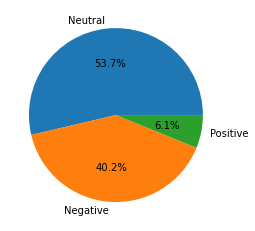

In [12]:
plt.pie(df1['Sentiment'].value_counts(),labels=['Neutral','Negative','Positive'],autopct='%1.1f%%')
plt.show()


In [13]:
#PREPROCESSING

In [14]:
import re

In [15]:
df1['Tweet'] = [token.lower() for token in df1['Tweet']]
df1.head(5)

,Tweet,Sentiment
0,@suleymansoylu o muletici politikamızı degisti...,Negative
1,koroplast hissesine tedbir geldi \n\n#emeklili...,Neutral
2,hatay'daki suriyeliler: geri dönmek istiyorlar...,Neutral
3,akıllı deli'den alıntı.suriye'deki suriyeliler...,Neutral
4,@aslandegirmenci esad'ın teröristlerini doldur...,Negative


In [16]:
found = df1[df1['Tweet'].str.contains('\n')]
found.count()

Tweet        401
Sentiment    401
dtype: int64

In [17]:
df1['Tweet'] = df1['Tweet'].replace('\n', '', regex=True)
found = df1[df1['Tweet'].str.contains('\n')]
found.count()

Tweet        0
Sentiment    0
dtype: int64

In [18]:
found = df1[df1['Tweet'].str.contains('@')]
found.count()

Tweet        847
Sentiment    847
dtype: int64

In [19]:
df1['Tweet'] = df1['Tweet'].replace('@[A-Za-z0-9_]+', '', regex=True).replace('@[A-Za-z0-9_]', '', regex=True)
found = df1[df1['Tweet'].str.contains('@')]
found.count()

Tweet        1
Sentiment    1
dtype: int64

In [20]:
df1['Tweet'] = df1['Tweet'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)
found = df1[df1['Tweet'].str.contains('http')]
found.count()

Tweet        0
Sentiment    0
dtype: int64

In [21]:
#REMOVE PUNCTUATIONS, EMOJIS AND NUMBERS

In [22]:
sentences = df1['Tweet'].copy()
new_sent = []
i = 0
for sentence in sentences:
    new_sentence = re.sub('[0-9]+', '', sentence)
    new_sent.append(new_sentence)
    i += 1
    
df1['Tweet'] = new_sent
df1

,Tweet,Sentiment
0,o muletici politikamızı degistirmeden bizden ...,Negative
1,koroplast hissesine tedbir geldi #emekliliktey...,Neutral
2,hatay'daki suriyeliler: geri dönmek istiyorlar...,Neutral
3,akıllı deli'den alıntı.suriye'deki suriyeliler...,Neutral
4,esad'ın teröristlerini doldurdunuz memlekete ...,Negative
...,...,...
1495,bu yasıma kadar hiç suriyeli gormedim nerde se...,Neutral
1496,suriyeliler dışında herkes gidebilir sevmiyo...,Neutral
1497,agzi kan olan kesin suriyelidir sac trasindan...,Negative
1498,olay suriyeliler ile yurt dışında yasayanlar...,Neutral


In [23]:
import string

table = str.maketrans('', '', string.punctuation)
sentences = df1['Tweet'].copy()
new_sent = []
for sentence in sentences:
    words = sentence.split()
    stripped = [w.translate(table) for w in words]
    new_sent.append(stripped)

In [24]:
df1['Tweet'] = new_sent
df1

,Tweet,Sentiment
0,"[o, muletici, politikamızı, degistirmeden, biz...",Negative
1,"[koroplast, hissesine, tedbir, geldi, emeklili...",Neutral
2,"[hataydaki, suriyeliler, geri, dönmek, istiyor...",Neutral
3,"[akıllı, deliden, alıntısuriyedeki, suriyelile...",Neutral
4,"[esadın, teröristlerini, doldurdunuz, memleket...",Negative
...,...,...
1495,"[bu, yasıma, kadar, hiç, suriyeli, gormedim, n...",Neutral
1496,"[suriyeliler, dışında, herkes, gidebilir, sevm...",Neutral
1497,"[agzi, kan, olan, kesin, suriyelidir, sac, tra...",Negative
1498,"[olay, suriyeliler, ile, yurt, dışında, yasaya...",Neutral


In [25]:
#TOKENIZATION

In [26]:
import time
import logging

from zemberek import (
    TurkishSpellChecker,
    TurkishSentenceNormalizer,
    TurkishSentenceExtractor,
    TurkishMorphology,
    TurkishTokenizer
)

logger = logging.getLogger(__name__)

morphology = TurkishMorphology.create_with_defaults()
normalizer = TurkishSentenceNormalizer(morphology)
extractor = TurkishSentenceExtractor()

2023-06-02 20:31:40,740 - zemberek.morphology.turkish_morphology - INFO
Msg: TurkishMorphology instance initialized in 13.036982774734497



In [27]:
#NORMALIZATION

In [28]:

def normalize_long_text(text):
    normalized_sentences = [normalizer.normalize(word) for word in text]
    normalized_text = " ".join(normalized_sentences)
    return normalized_text

In [29]:
sentences = df1['Tweet'].copy()
new_sent = []
start = time.time()

for token in sentences:   
    if token.count('') > 0:
        token = list(filter(('').__ne__, token))
    new_token = normalize_long_text(token)
    new_sent.append(new_token)

logger.info(f"Sentences normalized in: {time.time() - start} s")

2023-06-02 20:35:55,813 - __main__ - INFO
Msg: Sentences normalized in: 239.76615715026855 s



In [30]:
#STOPWORDS

In [31]:
from nltk.corpus import stopwords
stops = set(stopwords.words('turkish'))
print(stops)
import nltk
nltk.download('stopwords')
stops = set(stopwords.words('turkish'))
print(stops)

{'biri', 'daha', 'defa', 'kim', 'siz', 'çok', 'de', 'da', 'çünkü', 'ise', 'ne', 'tüm', 'hepsi', 'birşey', 'diye', 'ya', 'hiç', 'nasıl', 'o', 'için', 'hep', 'ama', 'nerede', 'mı', 'şey', 'bazı', 'niye', 'kez', 'niçin', 'sanki', 'biz', 'hem', 'ile', 'bu', 'nerde', 'neden', 've', 'eğer', 'veya', 'birkaç', 'mu', 'yani', 'şu', 'nereye', 'aslında', 'en', 'her', 'mü', 'ki', 'belki', 'gibi', 'acaba', 'az'}
{'biri', 'daha', 'defa', 'kim', 'siz', 'çok', 'de', 'da', 'çünkü', 'ise', 'ne', 'tüm', 'hepsi', 'birşey', 'diye', 'ya', 'hiç', 'nasıl', 'o', 'için', 'hep', 'ama', 'nerede', 'mı', 'şey', 'bazı', 'niye', 'kez', 'niçin', 'sanki', 'biz', 'hem', 'ile', 'bu', 'nerde', 'neden', 've', 'eğer', 'veya', 'birkaç', 'mu', 'yani', 'şu', 'nereye', 'aslında', 'en', 'her', 'mü', 'ki', 'belki', 'gibi', 'acaba', 'az'}


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alkan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
splitted_words = []
for sent in new_sent:
    words = sent.split()
    splitted_words.append(words)

In [33]:
clean_sent = []
for sentence in splitted_words:
    new_sentence = [w for w in sentence if w not in stops]
    clean_sent.append(new_sentence)

In [34]:
#lEMMATIZATION

In [35]:
for token in clean_sent:
    j = 0
    for word in token:
        new_word = word.replace('"', '').replace("’", '').replace("'", '').replace("”", '')
        token[j] = new_word
        j += 1

In [36]:
  import nltk
  nltk.download('punkt')
import zeyrek
analyzer = zeyrek.MorphAnalyzer()
lem_sent = []
for sent in clean_sent:
    normalized_sent = []
    for word in sent:
        if word == '':
            continue
        else:
            lem_word = analyzer.lemmatize(word)
            normalized_sent.append(lem_word[0][1][0])
    lem_sent.append(normalized_sent)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Alkan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


2023-06-02 20:36:03,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Multi_Noun_Prop)(-)(multi:nounProper_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + mız:p1pl_S + ı:acc_ST)>

2023-06-02 20:36:03,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + tir:vCausTır_S + verbRoot_S + meden:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:36:03,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + tir:vCausTır_S + verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:03,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-06-02 20:36:03,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:36:03,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,832 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bey_Noun)(-)(bey:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hdp_Noun_Abbrv)(-)(hdp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(le_Noun)(-)(le:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,838 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Le_Noun_Abbrv)(-)(le:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:03,840 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:36:03,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 2

2023-06-02 20:36:04,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deli_Adj)(-)(deli:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:04,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:04,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol

2023-06-02 20:36:04,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ıyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-06-02 20:36:04,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:04,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,264 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:0

2023-06-02 20:36:04,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:36:04,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:04,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:04,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:04,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom

2023-06-02 20:36:04,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:04,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + acak:vFut_S + sın:vA2sg_ST)>

2023-06-02 20:36:04,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:04,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:04,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:36:04,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:04,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:36:04,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:04,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verb

2023-06-02 20:36:04,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:04,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:04,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:04,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:04,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:36:04,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:04,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-06-02 20:36:05,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:36:05,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğal_Adj)(-)(doğal:adjectiveRoot_ST)>

2023-06-02 20:36:05,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + arak:vByDoingSo_S + advRoot_ST)>

2023-06-02 20:36:05,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:05,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nüfus_Noun)(-)(nüfus:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST + luğ:ness_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:05,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjective

2023-06-02 20:36:05,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:05,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşı_Adj)(-)(aşı:adjectiveRoot_ST)>

2023-06-02 20:36:05,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aş_Noun)(-)(aş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:05,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aş_Noun)(-)(aş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:05,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşı_Noun)(-)(aşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapılanmak_Verb)(-)(yapılan:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:05,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbR

2023-06-02 20:36:05,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmiş_Noun)(-)(geçmiş:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:05,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmiş_Adj)(-)(geçmiş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:05,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmiş_Adj)(-)(geçmiş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:05,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:05,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:05,372 - zeyrek.rulebasedanaly

2023-06-02 20:36:05,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Blu_Noun_Abbrv)(-)(blu:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:05,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dere_Noun)(-)(dere:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kenar_Noun)(-)(kenar:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:05,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kenar_Noun)(-)(kenar:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:05,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(stat_Noun)(-)(stad:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:05,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(stat_Noun)(-)(stad:noun_S + a3sg_S 

2023-06-02 20:36:05,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:05,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:05,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:05,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + yle:ins_ST)>

2023-06-02 20:36:05,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hızla_Adv)(-)(hızla:advRoot_ST)>

2023-06-02 20:36:05,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hız_Noun)(-)(hız:noun_S + a3

2023-06-02 20:36:05,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + ce:equ_ST)>

2023-06-02 20:36:05,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hipnoz_Noun)(-)(hipnoz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:05,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + il:vPass_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:05,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Amerika_Noun_Prop)(-)(amerika:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

20

2023-06-02 20:36:05,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:05,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:05,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:06,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:06,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:0

2023-06-02 20:36:06,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:06,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lazım_Adj)(-)(lazım:adjectiveRoot_ST)>

2023-06-02 20:36:06,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:06,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lâzım_Noun_Prop)(-)(lazım:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:36:06,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,

2023-06-02 20:36:06,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:36:06,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:36:06,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:06,292 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + lar:a3pl_S + ımız:p1pl_S + dan:abl_ST)>

2023-06-02 20:36:06,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:06,300 

2023-06-02 20:36:06,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + unca:vWhen_S + advRoot_ST)>

2023-06-02 20:36:06,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Noun)(-)(ilk:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:06,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlke_Noun_Prop)(-)(ilke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilke_Noun)(-)(ilke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilk_Adj)(-)(ilk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_S

2023-06-02 20:36:06,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:06,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:06,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:verbRoot_S + ma:vNeg_S + sa:vDesr_S + ydı:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:06,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırmak_Verb)(-)(ayr:verbLastVowelDropModRoot_S + ıl:vPass_S + verbRoot_S + ma:vNeg_S + sa:vDesr_S + ydı:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:06,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + acak:vFut_S + tı:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:06,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast

2023-06-02 20:36:06,707 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:06,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inşaat_Noun)(-)(inşaat:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:06,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Adj)(-)(hayvan:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:06,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayvan_Noun)(-)(hayvan:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:06,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tar_Noun

2023-06-02 20:36:06,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturmak_Verb)(-)(uyuştur:verbRoot_S + ucu:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:06,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturucu_Noun)(-)(uyuşturucu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşmak_Verb)(-)(uyuş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ucu:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:06,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturmak_Verb)(-)(uyuştur:verbRoot_S + ucu:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşmak_Verb)(-)(uyuş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ucu:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:06,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + iyor:vP

2023-06-02 20:36:06,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + pnon_S + nden:abl_ST)>

2023-06-02 20:36:06,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-06-02 20:36:06,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + p3sg_S + nden:abl_ST)>

2023-06-02 20:36:07,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:07,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:07,007 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:36:07,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:07,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:07,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:07,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:0

2023-06-02 20:36:07,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cumhur_Noun_Prop)(-)(cumhur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhur_Noun)(-)(cumhur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:07,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:07,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:07,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:07,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:36:07,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarpmak_Verb)(-)(çarp:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:36:07,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarpmak_Verb)(-)(çarp:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:07,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Misaki_Noun_Prop)(-)(misaki:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millî_Adj)(-)(milli:adjectiveRoot_ST)>

2023-06-02 20:36:07,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mill_Noun_Prop)(-)(mill:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:07,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mill_Noun_Prop)(-)(mill:nounProper_S + a3sg_S

2023-06-02 20:36:07,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaymak_Verb)(-)(yay:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:07,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yay_Noun)(-)(yay:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:07,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yay_Noun_Prop)(-)(yay:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:07,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaya_Noun)(-)(yaya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Adj)(-)(sol:adjectiveRoot_ST)>

2023-06-02 20:36:07,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(solmak_Verb)(-)(sol:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:07,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sol_Noun)(-)(sol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07

2023-06-02 20:36:07,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abi_Noun)(-)(abi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:07,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:36:07,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:07,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:07,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahalle_Noun)(-)(mahalle:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:07,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahalle_Noun)(-)(mahalle:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:36:07,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahal_Noun)(-)(mahal:noun_S + a3sg_S + pnon_S + nom_ST + len:

2023-06-02 20:36:07,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:36:07,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:07,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:07,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:36:07,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birer_Num_Dist)(-)(birer:numeralRoot_ST)>

2023-06-02 20:36:07,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:36:08,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:36:08,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:08,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturmak_Verb)(-)(otur:verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:36:08,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturacak_Noun)(-)(oturacak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:08,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yermek

2023-06-02 20:36:08,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:08,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:08,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:08,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacağ:vFutPart_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:08,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacağ:vFutPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02

2023-06-02 20:36:08,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beledi_Adj)(-)(beledi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:08,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bisiklet_Noun)(-)(bisiklet:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:08,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bisiklet_Noun)(-)(bisiklet:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:08,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:36:08,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:36:08,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerinde_Adj)(-)(yerinde:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:08,425 - z

2023-06-02 20:36:08,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çek_Noun)(-)(çek:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:36:08,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:08,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:08,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:08,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehit_Noun)(-)(şehit:noun

2023-06-02 20:36:08,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + sa:vDesr_S + ydı:vPastAfterTense_S + n:vA2sg_ST)>

2023-06-02 20:36:08,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:36:08,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakınmak_Verb)(-)(bakın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:08,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakı_Noun)(-)(bakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:08,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ahlak_Noun)(-)

2023-06-02 20:36:08,835 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaz_Noun)(-)(kaz:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:08,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaz_Adj)(-)(kaz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:08,838 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaz_Adj)(-)(kaz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:08,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaz_Adj)(-)(kaz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:08,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaz_Adj)(-)(kaz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:08,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gölet_Noun)(-)(gölet:noun_S + a3sg_S + pnon_S

2023-06-02 20:36:08,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:08,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yız:nA1pl_ST)>

2023-06-02 20:36:08,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Keyf_Noun_Prop)(-)(keyf:nounProper_S + a3sg_S + imiz:p1pl_S + den:abl_ST)>

2023-06-02 20:36:08,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keyif_Noun)(-)(keyf:noun_S + a3sg_S + imiz:p1pl_S + den:abl_ST)>

2023-06-02 20:36:08,968 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keyfî_Adj)(-)(keyfi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + miz:p1pl_S + den:abl_ST)>

2023-06-02 20:36:08,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ıp:vAfterDoing_S + 

2023-06-02 20:36:09,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akkız_Noun_Prop)(-)(akkız:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Memati_Noun_Prop)(-)(memati:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çarşamba_Noun_Prop)(-)(çarşamba:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çarşamba_Noun)(-)(çarşamba:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâinat_Noun)(-)(kainat:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:09,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kâinat_Noun_Prop)(-)(kainat:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:09,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:36:09,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komünist_Noun)(-)(komünist:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:09,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deli_Adj)(-)(deli:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:09,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deli_Adj)(-)(deli:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:09,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pno

2023-06-02 20:36:09,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:09,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:09,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:09,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:09,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023

2023-06-02 20:36:09,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:09,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:09,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Adv)(-)(dün:advRoot_ST)>

2023-06-02 20:36:09,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dü_Noun)(-)(dü:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:09,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Noun_Time)(-)(dün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:09,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapılanmak_Verb)(-)(yapılan:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:09,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:36:09,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:09,707 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:09,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mış:vNarr_S + lar:vA3pl_ST)>

2023-06-02 20:36:09,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + mış:nNarr_S + lar:nA3pl_ST)>

2023-06-02 20:36:09,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:09,718 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:09,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:09,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:09,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:09,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:09,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:09,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:09,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:36:10,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adj)(-)(öyle:adjectiveRoot_ST)>

2023-06-02 20:36:10,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:36:10,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:36:10,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:10,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,098 - zeyrek.rulebasedanalyzer 

2023-06-02 20:36:10,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:10,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:10,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:10,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + vImp_S + sün:vA3sg_ST)>

2023-06-02 20:36:10,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + la:pIns_ST)>

2023-06-02 20:36:10,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + la:pIns_ST)>

2023-06-02 20:36:10,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card

2023-06-02 20:36:10,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saye_Noun_Prop)(-)(saye:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:10,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazanmak_Verb)(-)(kazan:verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:10,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:36:10,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:36:10,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmur_Noun)(-)(yağmur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:36:10,443 - zeyrek.rulebasedanalyzer 

2023-06-02 20:36:10,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ümüz:p1pl_S + e:dat_ST)>

2023-06-02 20:36:10,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğmak_Verb)(-)(doğ:verbRoot_S + uyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:10,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(VIP_Noun_Abbrv)(-)(vıp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,563 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:10,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:10,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:36:10,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suskun_Adv)(-)(suskun:advRoot_ST)>

2023-06-02 20:36:10,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suskun_Adj)(-)(suskun:adjectiveRoot_ST)>

2023-06-02 20:36:10,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(susku_Noun)(-)(susku:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:10,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suskun_Adv)(-)(suskun:advRoot_ST)>

2023-06-02 20:36:10,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suskun_Adj)(-)(suskun:adjectiveRoot_ST)>

2023-06-02 20:36:10,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:36:10,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:10,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:10,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:10,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğalmak_Verb)(-)(çoğal:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:10,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(batı_Adj)(-)(batı:adjectiveRoot_ST)>

2023-06-02 20:36:10,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bat_Noun)(-)(bat:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:10,877 - z

2023-06-02 20:36:11,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:11,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:11,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:11,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:11,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:11,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(televizyon_Noun)(-)(televizyon:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:11,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(or

2023-06-02 20:36:11,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bahçe_Noun)(-)(bahçe:noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:11,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bahçe_Noun_Prop)(-)(bahçe:nounProper_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:11,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vNeg_S + di:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:11,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:11,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,228 - zeyrek.rulebaseda

2023-06-02 20:36:11,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:11,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:11,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:11,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:11,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım_Noun)(-)(kısm:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:11,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım_Noun)(-)(kısm:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:11,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkent_Noun)(-)(başkent:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:11,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:36:11,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:11,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:11,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beka_Noun)(-)(beka:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:11,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bekas_Noun)(-)(bekas:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:11,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bekas_Noun)(-)(bekas:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:11,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akıl:noun_S + 

2023-06-02 20:36:11,707 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:11,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hangi_Adj)(-)(hangi:adjectiveRoot_ST)>

2023-06-02 20:36:11,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hangi_Pron_Ques)(-)(hangi:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:11,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medenî_Adj)(-)(medeni:adjectiveRoot_ST)>

2023-06-02 20:36:11,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bi

2023-06-02 20:36:11,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aşkın_Noun_Prop)(-)(aşkın:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçak_Adj)(-)(kaçak:adjectiveRoot_ST)>

2023-06-02 20:36:11,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçak_Adv)(-)(kaçak:advRoot_ST)>

2023-06-02 20:36:11,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçak_Noun)(-)(kaçak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:11,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:36:12,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-06-02 20:36:12,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Açık_Noun_Prop)(-)(açık:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-06-02 20:36:12,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:36:12,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:12,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + in:

2023-06-02 20:36:12,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ab_Noun)(-)(ab:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:12,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:12,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:verbRoot_S + ası:vFeelLike_S + adjAfterVerb_ST)>

2023-06-02 20:36:12,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırmak_Verb)(-)(ayr:verbLastVowelDropModRoot_S + ıl:vPass_S + verbRoot_S + ası:vFeelLike_S + adjAfterVerb_ST)>

2023-06-02 20:36:12,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:12,169 - zeyrek.rulebasedanalyzer 

2023-06-02 20:36:12,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:12,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözmek_Verb)(-)(çöz:verbRoot_S + ül:vPass_S + verbRoot_S + ür:vAor_S + vA3sg_ST)>

2023-06-02 20:36:12,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözmek_Verb)(-)(çöz:verbRoot_S + ül:vPass_S + verbRoot_S + ür:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:12,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-06-02 20:36:12,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:12,306 - zeyrek.ruleba

2023-06-02 20:36:12,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:12,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:12,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:12,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:12,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + il:vPass_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:12,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kamyonet_Noun)(-)(kamyonet:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-06-02 20:36:12,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dağılma

2023-06-02 20:36:12,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkistan_Noun_Prop)(-)(türkistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:12,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:12,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adjectiveRoot_ST)>

2023-06-02 20:36:12,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mazlum_Noun_Prop)(-)(mazlum:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mağdur_Adj)(-)(mağdur:adjectiveRoot_ST)>

2023-06-02 20:36:12,611 - z

2023-06-02 20:36:12,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:36:12,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:12,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkarmak_Verb)(-)(çıkar:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:12,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkar_Noun)(-)(çıkar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:12,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounP

2023-06-02 20:36:12,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:12,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:36:12,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:12,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:36:12,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oran_Noun)(-)(oran:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:12,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:36:12,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplu_Adj)(-)(toplu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:36:12,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Noun)(-)(top:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:36:12,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:36:12,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:36:12,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:36:12,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:36:13,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hani_Noun_Prop)(-)(hani:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Noun)(-)(hani:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,172 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:13,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:13,182 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nV

2023-06-02 20:36:13,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yabil:vAble_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-06-02 20:36:13,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yabil:vAble_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:13,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:13,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-06-02 20:36:13,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-06-02 20:36:13,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(

2023-06-02 20:36:13,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tı:vPast_S + lar:vA3pl_ST)>

2023-06-02 20:36:13,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaç_Adj)(-)(kaç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tı:nPast_S + lar:nA3pl_ST)>

2023-06-02 20:36:13,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukranya_Noun_Prop)(-)(ukranya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:13,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukranya_Noun_Prop)(-)(ukranya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-06-02 20:36:13,488 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:36:13,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:13,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:13,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genc:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:13,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genc:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:13,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Genc_Noun_Prop)(-)(genc:nounProper_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:13,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Genc_Noun_Prop)(-)(genc:nounProper_S + a3sg_S + 

2023-06-02 20:36:13,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + in:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:13,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lan_Interj)(-)(lan:interjRoot_ST)>

2023-06-02 20:36:13,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(la_Noun)(-)(la:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:13,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adj)(-)(tabii:adjectiveRoot_ST)>

2023-06-02 20:36:13,808 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adv)(-)(tabii:advRoot_ST)>

2023-06-02 20:36:13,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:13,825 - zeyrek.rulebasedanalyzer 

2023-06-02 20:36:13,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Conj)(-)(hatta:conjRoot_ST)>

2023-06-02 20:36:13,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Adv)(-)(hatta:advRoot_ST)>

2023-06-02 20:36:13,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hat:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:13,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:13,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cinsiyet_Noun)(-)(cinsiyet:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:13,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cinsiyet_Noun)(-)(cinsiyet:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:13,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-06-02 20:36:13,967 - zeyrek.r

2023-06-02 20:36:14,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:36:14,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:14,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:36:14,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:14,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tekrar_Adv)(-)(tekrar:advRoot_ST)>

2023-06-02 20:36:14,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tekrar_Noun)(-)(tekrar:noun_S + a3sg_S + pnon_S 

2023-06-02 20:36:14,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(madem_Conj)(-)(madem:conjRoot_ST)>

2023-06-02 20:36:14,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Made_Noun_Prop)(-)(made:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:14,264 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-06-02 20:36:14,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:14,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + 

2023-06-02 20:36:14,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ımız:aP3sg_ST)>

2023-06-02 20:36:14,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ımız:p1pl_S + nom_ST)>

2023-06-02 20:36:14,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyonlarca_Adj)(-)(milyonlarca:adjectiveRoot_ST)>

2023-06-02 20:36:14,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ca:equ_ST)>

2023-06-02 20:36:14,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:36:14,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kıyaslamak_Verb)(-)(kıyasla:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_

2023-06-02 20:36:14,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:14,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:14,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36

2023-06-02 20:36:14,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:14,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:14,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_

2023-06-02 20:36:14,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fran_Noun_Prop)(-)(fran:nounProper_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:14,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:36:14,891 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + ın:p2sg_S + ca:equ_ST)>

2023-06-02 20:36:14,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + ı:p3sg_S + nca:equ_ST)>

2023-06-02 20:36:14,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Al_Noun_Prop)(-)(al:nounProper_S + a3sg_S + ın:p2sg_S + ca:equ_ST)>

2023-06-02 20:36:14,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Al_Noun_Prop)(-)(al:nounProper_S + a3sg_S + ı:p3sg_S + nca:equ_ST)

2023-06-02 20:36:15,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-06-02 20:36:15,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:36:15,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Adj)(-)(tam:adjectiveRoot_ST)>

2023-06-02 20:36:15,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Adv)(-)(tam:advRoot_ST)>

2023-06-02 20:36:15,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Noun)(-)(tam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:15,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:15,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-06-02 20:36:15,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:36:15,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:15,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:15,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:15,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:15,224 

2023-06-02 20:36:15,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + meden:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:36:15,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:15,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maaş_Noun)(-)(maaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alan_Noun)(-)(alan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ala_Noun)(-)(ala:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:15,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alan_Noun)(-)(alan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent

2023-06-02 20:36:15,490 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:15,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturmak_Verb)(-)(uyuştur:verbRoot_S + ucu:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:15,513 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturucu_Noun)(-)(uyuşturucu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşmak_Verb)(-)(uyuş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ucu:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:15,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşturmak_Verb)(-)(uyuştur:verbRoot_S + ucu:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşmak_Verb)(-)(uyuş:verbRoot_S + tur:vCausTır_S + verbRoot

2023-06-02 20:36:15,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + tur:vCausTır_S + verbRoot_S + am:vUnableProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:15,678 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:36:15,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:36:15,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:36:15,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:15,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:15,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:36:15,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun)(-)(ağz:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:36:15,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + unca:vWhen_S + advRoot_ST)>

2023-06-02 20:36:15,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşu_Noun)(-)(konuşu:noun_S + a3sg_S + n:p2sg_S + ca:equ_ST)>

2023-06-02 20:36:15,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + un:p2sg_S + ca:equ_ST)>

2023-06-02 20:36:15,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + u:p3sg_S + nca:equ_ST)>

2023-06-02 20:36:15,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pis_Adj)(-)(pis:adjectiveRoot_ST)>

2023-06-02 20:36:15,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:15,979 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:15,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:15,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pankart_Noun)(-)(pankart:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:15,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pankart_Noun)(-)(pankart:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:15,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pankart_Noun)(-)(pankart:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:15,988 - zeyrek.rulebasedanalyzer 

2023-06-02 20:36:16,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:16,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:16,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:36:16,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-06-02 20:36:16,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:36:16,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-06-02 20:36:16,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:16,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-06-02 20:36:16,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:36:16,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırmızı_Adj)(-)(kırmızı:adjectiveRoot_ST)>

2023-06-02 20:36:16,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırmız_Noun)(-)(kırmız:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:16,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırmız_Noun)(-)(kırmız:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:16,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kırmız_Noun_Prop)(-)(kırmız:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:16,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kırmız_Noun_Prop)(-)(kırmız:nounP

2023-06-02 20:36:16,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takmak_Verb)(-)(tak:verbRoot_S + ıl:vPass_S + verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:36:16,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-06-02 20:36:16,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Adv)(-)(sonra:advRoot_ST)>

2023-06-02 20:36:16,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:16,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:16,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + a

2023-06-02 20:36:16,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıllık_Noun)(-)(yıllığ:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:16,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıllık_Noun)(-)(yıllığ:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:16,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:16,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:16,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + er:vAor_S + vA3sg_ST)>

2023-06-02 20:36:16,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

202

2023-06-02 20:36:16,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atamak_Verb)(-)(ata:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:16,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atamak_Verb)(-)(ata:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:16,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atar_Noun_Prop)(-)(atar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:16,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakında_Adv)(-)(yakında:advRoot_ST)>

2023-06-02 20:36:16,678 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:16,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:16,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + da

2023-06-02 20:36:16,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giriş_Noun)(-)(giriş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:16,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(serbest_Adv)(-)(serbest:advRoot_ST)>

2023-06-02 20:36:16,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(serbest_Adj)(-)(serbest:adjectiveRoot_ST)>

2023-06-02 20:36:16,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(serbest_Noun)(-)(serbest:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:16,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:16,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağı_Noun)(-)(sağı:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:16,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağım_Noun)(-)(sağım:noun

2023-06-02 20:36:16,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + süz:without_S + adjectiveRoot_ST + leş:become_S + verbRoot_S + tir:vCausTır_S + verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:16,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + süz:without_S + adjectiveRoot_ST + leş:become_S + verbRoot_S + tir:vCausTır_S + verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:16,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(proje_Noun)(-)(proje:noun_S + a3sg_S + si:p3sg_S + nin:gen_ST)>

2023-06-02 20:36:16,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilanço_Noun)(-)(bilanço:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:36:16,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S

2023-06-02 20:36:17,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:17,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:17,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fiyat_Noun)(-)(fiyat:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:17,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:36:17,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrıç_Noun)(-)(ayrıc:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:17,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:17,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:17,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğu_Det)(-)(çoğu:detRoot_ST)>

2023-06-02 20:36:17,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğu_Adj)(-)(çoğu:adjectiveRoot_ST)>

2023-06-02 20:36:17,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğu_Pron_Quant)(-)(çoğu:pronQ

2023-06-02 20:36:17,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:17,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:17,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:17,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:17,468 - zeyrek.rulebasedanalyzer - WARNING

2023-06-02 20:36:17,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabul_Noun)(-)(kabul:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşma_Noun)(-)(anlaşma:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:17,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşmak_Verb)(-)(anlaş:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:17,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:17,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_S

2023-06-02 20:36:17,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:17,707 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sö_Noun_Abbrv)(-)(sö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:36:17,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ramazan_Noun)(-)(ramazan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ramazan_Noun_Prop)(-)(ramazan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:17,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:17,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurban_Interj)

2023-06-02 20:36:17,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şehit_Noun_Prop)(-)(şehit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:17,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:17,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:17,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:17,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:17,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tane_Noun)(-)(tane:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:17,889 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:36:18,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sırt_Noun)(-)(sırt:noun_S + a3sg_S + ımız:p1pl_S + dan:abl_ST)>

2023-06-02 20:36:18,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bıçaklamak_Verb)(-)(bıçakla:verbRoot_S + yan:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:18,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST + dir:nCop_ST)>

2023-06-02 20:36:18,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:18,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurtdışı_Adj)(-)(yurtdışı:adjectiveRoot_ST)>

2023-06-02 20:36:18,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurtdışı_Noun)(-)(yurtdışı:n

2023-06-02 20:36:18,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ankara_Noun_Prop)(-)(ankara:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gencecik_Adj)(-)(gencecik:adjectiveRoot_ST)>

2023-06-02 20:36:18,172 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gence_Noun_Prop)(-)(gence:nounProper_S + a3sg_S + pnon_S + nom_ST + cik:dim_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,174 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:18,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:18,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST

2023-06-02 20:36:18,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:36:18,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:36:18,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:18,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:18,324 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esad_Noun_Prop)(-)(esad:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlaşmak_Verb)(-)(anlaş:verbRoot_S + ıl:vPass_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:36:18,333 - zeyrek.rulebasedanaly

2023-06-02 20:36:18,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:18,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-06-02 20:36:18,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:18,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:18,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:18,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:18,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2

2023-06-02 20:36:18,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-06-02 20:36:18,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:36:18,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:18,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:36:18,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:18,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:18,673 - zeyrek.rulebase

2023-06-02 20:36:18,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:18,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:18,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Al_Noun_Prop)(-)(al:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:18,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:18,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-

2023-06-02 20:36:18,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:18,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:18,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:18,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:18,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-06-02 20:36:18,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-06-02 20:36:18,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:36:19,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:19,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:36:19,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağırmak_Verb)(-)(bağır:verbLastVowelDropUnmodRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:19,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:19,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedense_Adv)(-)(nedense:advRoot_ST)>

2023-06-02 20:36:19,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST + nounZeroDeriv_S + nVerb_S + se:nCon

2023-06-02 20:36:19,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sinan_Noun_Prop)(-)(sinan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Oğan_Noun_Prop)(-)(oğan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:19,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:19,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Adv)(-)(birlikte:advRoot_ST)>

2023-06-02 20:36:19,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Postp_PCIns)(-)(birlikte:postpRoot_ST)>

2023-06-02 20:36:19,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + a3sg_S + pnon_S + te:

2023-06-02 20:36:19,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amac:noun_S + a3sg_S + ınız:p2pl_S + nom_ST)>

2023-06-02 20:36:19,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âmâ_Adj)(-)(ama:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + nız:p2pl_S + nom_ST)>

2023-06-02 20:36:19,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amac:noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:19,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amac:noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:19,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âmâ_Adj)(-)(ama:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:19,437 - zeyrek.rulebasedanalyzer -

2023-06-02 20:36:19,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-06-02 20:36:19,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:19,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:19,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + n:p2

2023-06-02 20:36:19,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muhalefet_Noun)(-)(muhalefet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öneri_Noun)(-)(öneri:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Öner_Noun_Prop)(-)(öner:nounProper_S + a3sg_S + i:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:19,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öneri_Noun)(-)(öneri:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:19,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:19,772 - zeyrek.rulebasedanal

2023-06-02 20:36:19,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırmak_Verb)(-)(ayr:verbLastVowelDropModRoot_S + ıl:vPass_S + verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:19,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Noun)(-)(ekmeğ:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:19,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Noun)(-)(ekmeğ:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:19,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmak_Verb)(-)(yağ:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:19,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağ_Noun)(-)(yağ:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:19,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-06-02 20:36:20,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:36:20,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:36:20,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + ici:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:20,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevici_Noun)(-)(sevici:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + ici:vAgt_S + noun_S + a3sg_S + pnon_

2023-06-02 20:36:20,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:20,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2

2023-06-02 20:36:20,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:20,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yasadışı_Adj)(-)(yasadışı:adjectiveRoot_ST)>

2023-06-02 20:36:20,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:20,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)

2023-06-02 20:36:20,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Adj)(-)(dişi:adjectiveRoot_ST)>

2023-06-02 20:36:20,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:20,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:20,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Noun)(-)(dişi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:36:20,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S +

2023-06-02 20:36:20,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:20,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:20,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST)>

2023-06-02 20:36:20,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:20,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rüzgâr_Noun)(-)(rüzgar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:20,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rüzgâr_Noun)(-)(rüzgar:noun_S + a3sg_S + ı:p3

2023-06-02 20:36:20,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunmak_Verb)(-)(savun:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:20,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Adv)(-)(yerine:advRoot_ST)>

2023-06-02 20:36:20,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerinmek_Verb)(-)(yerin:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:20,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:20,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:20,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerine_Noun)(-)(yerine:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:20,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:n

2023-06-02 20:36:21,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:21,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:21,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sınlar:vA3pl_ST)>

2023-06-02 20:36:21,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:21,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:21,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:21,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:36:21,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koymak_Verb)(-)(koy:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:21,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaka_Noun)(-)(vaka:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:21,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:36:21,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:36:21,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:36:21,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S +

2023-06-02 20:36:21,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:21,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + u:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dur:nCop_ST)>

2023-06-02 20:36:21,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:21,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:21,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adject

2023-06-02 20:36:21,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hakkında_Adv)(-)(hakkında:advRoot_ST)>

2023-06-02 20:36:21,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:21,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:21,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:21,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:21,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:21,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Nou

2023-06-02 20:36:21,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + düğ:vPastPart_S + noun_S + a3sg_S + üm:p1sg_S + nom_ST)>

2023-06-02 20:36:21,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:36:21,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:36:21,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:36:21,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:36:21,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:21,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:36:21,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adv)(-)(pek:advRoot_ST)>

2023-06-02 20:36:21,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST)>

2023-06-02 20:36:21,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:21,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:21,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:21,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adj)(-)(biraz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:21,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S 

2023-06-02 20:36:22,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:22,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Adj)(-)(erkek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(erkek_Noun)(-)(erkek:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:22,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:22,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:36:22,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:22,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:22,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:22,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kılıç_Noun_Prop)(-)(kılıç:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kılıç_Noun)(-)(kılıç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşımak_Verb)(-)(taşı:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:22,176 - zeyrek.rulebasedanalyzer - WA

2023-06-02 20:36:22,298 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:36:22,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:22,299 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:36:22,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tren_Noun)(-)(tren:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:22,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:36:22,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anas_Noun_Prop)(-)(anas:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:22,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + ası:vFeelLike_S + noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:22,447 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Adj)(-)(ana:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:22,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağlamak_Verb)(-)(ağla:verbRoot_S + t:vCaus_S + verbRoot_S + tı:vPast_S + lar:vA3pl_ST)>

2023-06-02 20:36:22,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zarar_Noun)(-)(zarar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,468 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S 

2023-06-02 20:36:22,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uzman_Noun_Prop)(-)(uzman:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:22,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uzman_Noun_Prop)(-)(uzman:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:22,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzman_Noun)(-)(uzman:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:22,607 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzman_Noun)(-)(uzman:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:22,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzman_Adj)(-)(uzman:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:22,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzman_Adj)(-)(uzman:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:22,612 - zeyrek

2023-06-02 20:36:22,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Adj)(-)(dahi:adjectiveRoot_ST)>

2023-06-02 20:36:22,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dahi_Noun_Prop)(-)(dahi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Noun)(-)(dahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanımak_Verb)(-)(tanı:verbRoot_S + yam:vUnableProg1_S + ıyor:vProgYor_S + lar:vA3pl_ST + dı:vPastAfterTense_ST)>

2023-06-02 20:36:22,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:22,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ona

2023-06-02 20:36:22,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-06-02 20:36:22,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:22,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:22,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ymiş:nNarr_S + nA3sg_ST)>

2023-06-02 20:36:22,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ymiş:nNarr_S + nA3sg_ST)>

2023-06-02 20:36:22,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ha_Interj)(-)(ha:interjRoot_ST)>

2023-06-02 20:36:22,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ha_Conj)(-)(ha:conjRo

2023-06-02 20:36:23,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağız_Noun)(-)(ağz:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:36:23,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salya_Noun)(-)(salya:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:23,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıtmak_Verb)(-)(akıt:verbRoot_S + arak:vByDoingSo_S + advRoot_ST)>

2023-06-02 20:36:23,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paylaşmak_Verb)(-)(paylaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:23,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pay_Noun)(-)(pay:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:23,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_

2023-06-02 20:36:23,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çivi_Noun)(-)(çivi:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:23,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkarmak_Verb)(-)(çıkar:verbRoot_S + dı:vPast_S + nız:vA2pl_ST)>

2023-06-02 20:36:23,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ar:vAor_S + dı:vPastAfterTense_S + nız:vA2pl_ST)>

2023-06-02 20:36:23,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkar_Noun)(-)(çıkar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nız:nA2pl_ST)>

2023-06-02 20:36:23,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:23,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroD

2023-06-02 20:36:23,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:23,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:23,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:36:23,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:23,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:23,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse

2023-06-02 20:36:23,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:23,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:23,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:23,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:23,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:23,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İmge_Noun_Prop)(-)(imge:nounProper_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:36:23,468 - zeyrek.rulebasedan

2023-06-02 20:36:23,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:36:23,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:23,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:23,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:36:23,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(-)(can:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:36:23,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(-)(can:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:23,629 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:36:23,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:23,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:23,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:23,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:23,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lazım_Adj)(-)(lazım:adjectiveRoot_ST)>

2023-06-02 20:36:23,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:23,775 - zey

2023-06-02 20:36:23,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kambur_Adj)(-)(kambur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:23,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + miş:vNarr_S + ti:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:23,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:36:23,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:23,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_

2023-06-02 20:36:24,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrika_Noun_Prop)(-)(afrika:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mühendis_Noun)(-)(mühendis:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mühendis_Noun)(-)(mühendis:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:24,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanat_Noun)(-)(sanat:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanat_Noun)(-)(sanat:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDe

2023-06-02 20:36:24,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:36:24,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:24,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:24,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herkes_Pron_Quant)(-)(herkes:pronQuant_S + pQuantA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:24,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-0

2023-06-02 20:36:24,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:24,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Adj)(-)(geçici:adjectiveRoot_ST)>

2023-06-02 20:36:24,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + ici:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:36:24,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Noun)(-)(geçici:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + ici:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kor_Noun)(-)(kor:noun_S + a3sg_S + um:p1sg_S + a:dat_ST)>

2023-06-02 20:36:24,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_V

2023-06-02 20:36:24,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounProper_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + dir:vCausTır_S + verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + te:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:24,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + dir:vCausTır_S + verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + te:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:24,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:24,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:36:24,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:24,703 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:24,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:24,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:24,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkezî_Adj)(-)(merkezi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-06-02 20:36:24,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yangın_Adj)(-)(yangın:adjectiveRoot_ST)>

2023-06-02 20:36:24,717 - zeyrek.rulebasedanaly

2023-06-02 20:36:24,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarihî_Adj)(-)(tarihi:adjectiveRoot_ST)>

2023-06-02 20:36:24,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarih_Noun)(-)(tarih:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:24,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarih_Noun)(-)(tarih:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:24,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + makta:vProgMakta_S + vA3sg_ST)>

2023-06-02 20:36:24,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + ta:loc_ST)>

2023-06-02 20:36:24,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istek_Noun)(-)(istek:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:24,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istek

2023-06-02 20:36:25,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bayrak_Noun_Prop)(-)(bayrak:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:25,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bayrak_Noun_Prop)(-)(bayrak:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:25,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bayrak_Noun_Prop)(-)(bayrak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:25,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açılamak_Verb)(-)(açıl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:25,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + ıl:vPass_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:25,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,057

2023-06-02 20:36:25,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göç_Noun)(-)(göç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mühendis_Noun)(-)(mühendis:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:25,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mühendis_Noun)(-)(mühendis:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:25,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:25,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeri

2023-06-02 20:36:25,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Altay_Noun_Prop)(-)(altay:nounProper_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:25,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hastane_Noun)(-)(hastane:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST)>

2023-06-02 20:36:25,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:25,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:25,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapı_Noun)(-)(kapı:noun_S + lar:a3pl_S + ı:p3pl_S + 

2023-06-02 20:36:25,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:25,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:25,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:25,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:36:25,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNe

2023-06-02 20:36:25,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-06-02 20:36:25,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:25,706 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:25,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:25,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:25,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezmek_Verb)(-)(gez:verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:36:25,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:36:25,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Btc_Noun_Abbrv)(-)(btc:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:25,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bahçe_Noun)(-)(bahçe:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:25,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bahçe_Noun_Prop)(-)(bahçe:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:25,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erdoğan_Noun_Prop)(-)(erdoğan:nounProper_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:25,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S +

2023-06-02 20:36:26,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ancak_Adv)(-)(ancak:advRoot_ST)>

2023-06-02 20:36:26,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ancak_Conj)(-)(ancak:conjRoot_ST)>

2023-06-02 20:36:26,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:26,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:26,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:26,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:36:26,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:26,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:26,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:26,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehr:noun_S + a3sg_S + imiz:p1pl_S + in:gen_ST)>

2023-06-02 20:36:26,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahal_Noun)(-)(mahal:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:26,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahal_Noun)(-)(mahal:noun_S + ler:a3pl_S +

2023-06-02 20:36:26,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:26,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçma_Noun)(-)(saçma:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:26,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:26,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçma_Adj)(-)(saçma:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:26,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-06-02 20:36:26,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:26,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:36:26,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:26,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:26,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:36:26,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kesmek_Verb)(-)(kes:verbRoot_S + vImp_S + vA2sg_S

2023-06-02 20:36:26,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:26,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölgelemek_Verb)(-)(bölgele:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:26,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölgelemek_Verb)(-)(bölgele:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:26,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölge_Noun)(-)(bölge:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:26,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölge_Noun)(-)(bölge:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:26,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oluşmak_Verb)(-)(oluş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ul:vPass_S + ve

2023-06-02 20:36:26,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:36:26,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + de:loc_ST)>

2023-06-02 20:36:26,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + de:loc_ST)>

2023-06-02 20:36:26,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:26,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:26,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + p

2023-06-02 20:36:27,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alkan_Noun)(-)(alkan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alkan_Noun_Prop)(-)(alkan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tar_Noun)(-)(tar:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:36:27,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarla_Noun)(-)(tarla:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Adj)(-)(kısa:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:27,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısa_Noun)(-)(kısa:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:27,063 - zeyrek.rulebasedanaly

2023-06-02 20:36:27,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayesinde_Adv)(-)(sayesinde:advRoot_ST)>

2023-06-02 20:36:27,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saye_Noun)(-)(saye:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:27,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saye_Noun_Prop)(-)(saye:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:27,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-06-02 20:36:27,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + sı:p3sg_S + nı

2023-06-02 20:36:27,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:27,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:27,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:27,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:36:27,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tüketmek_Verb)(-)(tüket:verbRoot_S + ici:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:27,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:36:27,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:27,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:27,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:27,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içsavaş_Noun)(-)(içsavaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,55

2023-06-02 20:36:27,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:36:27,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:36:27,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:36:27,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:36:27,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:27,736 - zeyrek.rulebasedanalyzer - WARNING
M

2023-06-02 20:36:27,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âdet_Noun)(-)(adet:noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:27,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âdet_Noun)(-)(adet:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:27,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âdet_Noun)(-)(adet:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:27,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + malı:vNeces_S + vA3sg_ST)>

2023-06-02 20:36:27,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:27,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDe

2023-06-02 20:36:28,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adv)(-)(tek:advRoot_ST)>

2023-06-02 20:36:28,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adj)(-)(tek:adjectiveRoot_ST)>

2023-06-02 20:36:28,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Noun)(-)(tek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lütfen_Adv)(-)(lütfen:advRoot_ST)>

2023-06-02 20:36:28,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bunamak_Verb)(-)(buna:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:28,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-06-02 20:36:28,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:28,145 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:36:28,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedava_Adv)(-)(bedava:advRoot_ST)>

2023-06-02 20:36:28,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedava_Adj)(-)(bedava:adjectiveRoot_ST)>

2023-06-02 20:36:28,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taksi_Noun)(-)(taksi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:28,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-

2023-06-02 20:36:28,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:28,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:36:28,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:28,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:28,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ımız:p1pl_S + nom_ST)>

2023-06-02 20:36:28,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:

2023-06-02 20:36:28,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:28,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatip_Noun_Prop)(-)(hatip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatip_Noun)(-)(hatip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:28,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rağmen_Postp_PCDat)(-)(rağmen:postpRoot_ST)>

2023-06-02 20:36:28,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(daire_Noun)(-)(daire:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşılık_Noun)(-)(karşılığ:noun_S + a3sg_S + pnon_

2023-06-02 20:36:28,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yahu_Interj)(-)(yahu:interjRoot_ST)>

2023-06-02 20:36:28,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:28,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:28,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:28,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(garantilemek_Verb)(-)(garantile:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:36:28,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(garantilemek_Verb)(-)(garantile:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:36:28,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hareket_Noun)(-)(h

2023-06-02 20:36:28,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağımsız_Adj)(-)(bağımsız:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:28,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağımsız_Adj)(-)(bağımsız:adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:28,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:28,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:28,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST + lüğ:ness_S + noun_S + a3sg_S + ün:p2s

2023-06-02 20:36:29,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saye_Noun)(-)(saye:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:29,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Saye_Noun_Prop)(-)(saye:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:29,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyasî_Adj)(-)(siyasi:adjectiveRoot_ST)>

2023-06-02 20:36:29,141 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + ınız:p2pl_S + nom_ST)>

2023-06-02 20:36:29,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:29,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:29

2023-06-02 20:36:29,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:29,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muhabbet_Noun)(-)(muhabbet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Muhabbet_Noun_Prop)(-)(muhabbet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuş_Noun)(-)(kuş:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:29,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuş_Noun)(-)(kuş:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:29,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:36:29,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mış:vNarr_S + vA3

2023-06-02 20:36:29,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:29,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:29,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:29,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:29,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + me:vNeg_S + z:vAorNeg_S + se:vCond_S + niz:vA2pl_ST)>

2023-06-02 20:36:29,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,436 - zeyrek.ru

2023-06-02 20:36:29,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + siniz:vA2pl_ST)>

2023-06-02 20:36:29,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + esi:vFeelLike_S + noun_S + a3sg_S + niz:p2pl_S + nom_ST)>

2023-06-02 20:36:29,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + esi:vFeelLike_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:29,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peki_Adv)(-)(peki:advRoot_ST)>

2023-06-02 20:36:29,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-

2023-06-02 20:36:29,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:29,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:29,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:29,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:29,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:29,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:36:29,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:29,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:29,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:29,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:29,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:29,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S 

2023-06-02 20:36:29,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yürümek_Verb)(-)(yürü:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:29,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gidermek_Verb)(-)(gider:verbRoot_S + di:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:29,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + di:nPast_S + m:nA1sg_ST)>

2023-06-02 20:36:30,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küçücük_Adj)(-)(küçücük:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tü:nPast_S + m:nA1sg_ST)>

2023-06-02 20:36:30,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkmak_Verb)(-)(kork:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + dı:vPastAfterTense_S + m:vA1sg_ST)>

2023-06-02 20:36:30,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baba_Noun)(-)(baba:noun_S + a3sg_S + m:p1sg_

2023-06-02 20:36:30,141 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:30,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Korel_Noun_Prop)(-)(korel:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:30,181 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Korel_Noun_Prop)(-)(korel:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:30,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kore_Noun_Prop)(-)(kore:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:30,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:30,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:30,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:36:30,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:30,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilgi_Noun)(-)(bilgi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + miş:vNarr_S + ler:vA3pl_ST)>

2023-06-02 20:36:30,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:30,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + ya

2023-06-02 20:36:30,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şaşırmak_Verb)(-)(şaşır:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:30,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:30,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:30,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhuriyet_Noun)(-)(cumhuriyet:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:30,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhuriyet_Noun)(-)(cumhuriyet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-0

2023-06-02 20:36:30,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edinmek_Verb)(-)(edin:verbRoot_S + eme:vUnable_S + yecek:vFut_S + vA3sg_ST)>

2023-06-02 20:36:30,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edinmek_Verb)(-)(edin:verbRoot_S + eme:vUnable_S + yecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:36:30,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:30,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:30,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:30,614 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:n

2023-06-02 20:36:30,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + dı:vPast_S + nız:vA2pl_ST)>

2023-06-02 20:36:30,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:30,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:30,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + sı:p3sg_S + yla:ins_ST)>

2023-06-02 20:36:30,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kıyak_Adj)(-)(kıyak:adjectiveRoot_ST)>

2023-06-02 20:36:30,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kıyak_Noun)(-)(kıyak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kıyak_Noun_Prop)(-)(kıyak:nounProper_S + a3sg

2023-06-02 20:36:30,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:30,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(statü_Noun)(-)(statü:noun_S + a3sg_S + sü:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:30,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:30,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:30,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:30,935 - zeyrek.rulebasedanalyzer

2023-06-02 20:36:31,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:31,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:31,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounPr

2023-06-02 20:36:31,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emniyet_Noun)(-)(emniyet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:31,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:31,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:31,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güç_Noun_Prop)(-)(güç:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:31,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güç_Noun_Prop)(-)(güç:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:31,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güç_Noun_Prop)

2023-06-02 20:36:31,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(ed:verbRoot_S + il:vPass_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:31,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Postp_PCDat)(-)(doğru:postpRoot_ST)>

2023-06-02 20:36:31,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST)>

2023-06-02 20:36:31,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Noun)(-)(doğru:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-06-02 20:36:31,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-06-02 20:36:31,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:31,388 - zeyrek.rulebasedanalyz

2023-06-02 20:36:31,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kullanmak_Verb)(-)(kullan:verbRoot_S + abil:vAble_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:31,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + abil:vAble_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:31,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:31,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,550 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:36:31,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,693 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görünmek_Verb)(-)(görün:verbRoot_S + me:vNeg_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:31,696 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:31,697 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:31,697 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:31,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:31,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resmen_Adv)(-)(resmen:advRoot_ST)>

2023-06-02 20:36:31,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:36:31,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ötmek_Verb)(-)(öt:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:31,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Meral_Noun_Prop)(-)(meral:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,838 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(meral_Noun)(-)(meral:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akşener_Noun_Prop)(-)(akşener:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:36:31,855 - zeyrek.ru

2023-06-02 20:36:31,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Azez_Noun_Prop)(-)(azez:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:31,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:31,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:32,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,003 - zeyrek.rulebasedanal

2023-06-02 20:36:32,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:32,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:32,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:32,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:32,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:36:32,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:32,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağım_Noun)(-)(bağım:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:32,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:36:32,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,318 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralR

2023-06-02 20:36:32,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:32,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:32,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + m:nA1sg_ST)>

2023-06-02 20:36:32,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:36:32,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapınmak_Verb)(-)(yapın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-0

2023-06-02 20:36:32,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Adj)(-)(asker:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + yan:vPresPart_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:32,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kız_Interj)(-)(kız:interjRoot_ST)>

2023-06-02 20:36:32,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kızmak_Verb)(-)(kız:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:32,629 - zeyrek.

2023-06-02 20:36:32,804 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Amerika_Noun_Prop)(-)(amerika:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:32,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:36:32,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:32,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:32,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:36:32,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:36:32,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:32,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:32,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapılanmak_Verb)(-)(yapılan:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:32,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:32,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST)>

2023-06-02 20:36:32,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST)>

2023-06-02 20:36:32,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + pnon

2023-06-02 20:36:33,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pkk_Noun_Abbrv)(-)(pkk:nounAbbrv_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:36:33,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kucak_Noun)(-)(kucağ:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:36:33,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kucak_Noun)(-)(kucağ:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:36:33,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(itmek_Verb)(-)(it:verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:33,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:36:33,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:36:33,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:36:33,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:33,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:33,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öpmek_Verb)(-)(öp:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + se:vDesr_S + vA3sg_ST)>

2023-06-02 20:36:33,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:33,254 - zeyrek.rul

2023-06-02 20:36:33,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dizmek_Verb)(-)(diz:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:33,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diz_Noun)(-)(diz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boy_Noun)(-)(boy:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:33,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boy_Noun)(-)(boy:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:33,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ajan_Noun)(-)(ajan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:33,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20

2023-06-02 20:36:33,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST)>

2023-06-02 20:36:33,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:33,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Al_Noun_Prop)(-)(al:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:33,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(san_Noun)(-)(san:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:33,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(san:pronPers_Mod_S + pA2sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-06

2023-06-02 20:36:33,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:33,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:33,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + meden:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:36:33,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:33

2023-06-02 20:36:33,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tir:nCop_ST)>

2023-06-02 20:36:33,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + ler:vA3pl_ST + di:vPastAfterTense_ST)>

2023-06-02 20:36:33,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:33,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayesinde_Adv)(-)(sayesinde:advRoot_ST)>

20

2023-06-02 20:36:33,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plan_Noun)(-)(plan:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:33,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plan_Noun)(-)(plan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:33,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(plan_Noun)(-)(plan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:33,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:36:33,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:33,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:33,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 

2023-06-02 20:36:34,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:34,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hulki_Noun_Prop)(-)(hulki:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Haka_Noun_Prop)(-)(haka:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:34,141 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hakan_Noun)(-)(hakan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bey_Noun)(-)(bey:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjec

2023-06-02 20:36:34,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kovmak_Verb)(-)(kov:verbRoot_S + muş:vNarr_S + tu:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:34,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kovmak_Verb)(-)(kov:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tu:nPast_S + nA3sg_ST)>

2023-06-02 20:36:34,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:34,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:34,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:34,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:34,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:36:34,471 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:36:34,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

2023-06-02 20:36:34,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Noun)(-)(bütün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:34,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S

2023-06-02 20:36:34,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:36:34,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:36:34,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:36:34,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + tığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-06-02 20:36:34,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:34,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + tığ

2023-06-02 20:36:34,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Almanya_Noun_Prop)(-)(almanya:nounProper_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:36:34,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:34,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:34,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hale_Noun_Prop)(-)(hale:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hale_Noun)(-)(hale:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:34,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oynamak_Verb)(-)(oyna:v

2023-06-02 20:36:34,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sikmek_Verb)(-)(sik:verbRoot_S + tir:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:34,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sik_Noun)(-)(sik:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tir:nCop_ST)>

2023-06-02 20:36:34,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:34,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:34,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:34,962 - zeyrek.rulebased

2023-06-02 20:36:35,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:35,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:35,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(par_Noun)(-)(par:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:35,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:35,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:no

2023-06-02 20:36:35,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gide_Noun_Prop)(-)(gide:nounProper_S + a3sg_S + n:p2sg_S + e:dat_ST)>

2023-06-02 20:36:35,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:35,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:35,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:35,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:w

2023-06-02 20:36:35,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:35,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanık_Adj)(-)(tanık:adjectiveRoot_ST)>

2023-06-02 20:36:35,382 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tanık_Noun_Prop)(-)(tanık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tanık_Noun)(-)(tanık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:35,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Conj)(-)(hatta:conjRoot_ST)>

2023-06-02 20:36:35,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Adv)(-)(hatta:advRoot_ST)>

2023-06-02 20:36:35,392 - zey

2023-06-02 20:36:35,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:35,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:35,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(defolmak_Verb)(-)(defol:verbRoot_S + vImp_S + sunlar:vA3pl_ST)>

2023-06-02 20:36:35,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vs_Noun)(-)(vs:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vs_Noun_Abbrv)(-)(vs:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vs_Noun)(-)(vs:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vs_Noun_Abbrv)(-)(vs:nounAbbr

2023-06-02 20:36:35,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kızmak_Verb)(-)(kız:verbRoot_S + ıyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-06-02 20:36:35,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:35,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:36:35,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bent_Noun)(-)(bend:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:35,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bende_Noun_Prop)(-)(bende:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:36:35,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_N

2023-06-02 20:36:35,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:35,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:35,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + iniz:aP2pl_ST)>

2023-06-02 20:36:35,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-06-02 20:36:35,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yavşak_Noun)(-)(yavşak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:35,815 - zeyrek.rulebasedanalyzer - W

2023-06-02 20:36:35,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faz_Noun)(-)(faz:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:36:35,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:35,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:35,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:35,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:35,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açlık_Noun)(-)(açlık:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:36:35,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:

2023-06-02 20:36:36,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:36:36,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:36,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ezmek_Verb)(-)(ez:verbRoot_S + il:vPass_S + verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:36,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açlık_Noun)(-)(açlık:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:36:36,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:36:36,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anca_Adv)(-)(anca:advRoot_ST)>

2023-06-02 20:36:3

2023-06-02 20:36:36,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçak_Noun)(-)(kaçak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayran_Noun)(-)(ayran:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:36,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakiye_Noun)(-)(bakiye:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bakiye_Noun_Prop)(-)(bakiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:36,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sat

2023-06-02 20:36:36,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağlık_Noun)(-)(sağlık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sağlık_Noun_Prop)(-)(sağlık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:36,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:36,432 - zeyrek.

2023-06-02 20:36:36,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:36,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:36,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:36,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:36,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(at_Noun)(-)(at:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(At_Noun_Prop)(-)(at:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ün:p2sg_S + de:loc_ST)>

2023-06-02 20:36:36,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:36,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Noun)(-)(üstün:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:36,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üstün_Noun_Prop)(-)(üstün:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:36,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_

2023-06-02 20:36:36,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:36,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:36:36,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:36:36,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:36,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al

2023-06-02 20:36:37,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıktı_Noun)(-)(çıktı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:37,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Adj)(-)(tam:adjectiveRoot_ST)>

2023-06-02 20:36:37,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Adv)(-)(tam:advRoot_ST)>

2023-06-02 20:36:37,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tam_Noun)(-)(tam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapık_Adj)(-)(sapık:ad

2023-06-02 20:36:37,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:37,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mal_Noun)(-)(mal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:37,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sigorta_Noun)(-)(sigorta:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:37,174 - zeyrek.rulebasedanaly

2023-06-02 20:36:37,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:37,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Evin_Noun_Prop)(-)(evin:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:37,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Evin_Noun_Prop)(-)(evin:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:37,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evin_Noun)(-)(evin:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:37,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evin_Noun)(-)(evin:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:37,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hükümet_Noun)(-)(hükümet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:37,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hükümet_Noun)(-)(hüküm

2023-06-02 20:36:37,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:36:37,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + i:p3sg_S + nin:gen_ST)>

2023-06-02 20:36:37,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:37,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:36:37,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:37,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(askerî_Adj)(-)(askeri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-0

2023-06-02 20:36:37,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maaş_Noun)(-)(maaş:noun_S + a3sg_S + ım:p1sg_S + ı:acc_ST)>

2023-06-02 20:36:37,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:37,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Banka_Noun_Prop)(-)(banka:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:37,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + ti:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:37,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:37,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:37,629 - zeyrek.rulebasedanalyzer - WARNING


2023-06-02 20:36:37,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:37,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:37,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Li_Noun_Abbrv)(-)(li:nounAbbrv_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-06-02 20:36:37,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Adv)(-)(birlikte:advRoot_ST)>

2023-06-02 20:36:37,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlikte_Postp_PCIns)(-)(birlikte:postpRoot_ST)>

2023-06-02 20:36:37,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Birlik_Noun_Prop)(-)(birlik:nounProper_S + a3sg_S + pnon_S + te:loc_ST)>

2023-06-02 20:36:37,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Noun)(-)(birlik:

2023-06-02 20:36:38,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:38,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duymak_Verb)(-)(duy:verbRoot_S + ama:vUnable_S + dı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:38,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:38,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,101 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:36:38,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:38,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürteci_Adj)(-)(mürteci:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:38,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürteci_Adj)(-)(mürteci:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özellikle_Adv)(-)(özellikle:advRoot_ST)>

2023-06-02 2

2023-06-02 20:36:38,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nedeniyle_Adv)(-)(nedeniyle:advRoot_ST)>

2023-06-02 20:36:38,435 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neden_Noun)(-)(neden:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-06-02 20:36:38,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istifa_Noun)(-)(istifa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:36:38,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:38,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tiğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:38,453 - zeyrek.rulebasedanalyzer - WARNING
M

2023-06-02 20:36:38,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:36:38,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:38,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:38,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:38,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vO

2023-06-02 20:36:38,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tefe_Noun)(-)(tefe:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:38,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:36:38,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:38,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:38,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_

2023-06-02 20:36:38,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:38,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:38,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:38,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boşalmak_Verb)(-)(boşal:verbRoot_S + t:vCaus_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-06-02 20:36:38,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boşalmak_Verb)(-)(boşal:verbRoot_S + t:vCaus_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:38,949 - zeyrek.rulebasedanalyzer -

2023-06-02 20:36:39,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + nom_ST)>

2023-06-02 20:36:39,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + nom_ST)>

2023-06-02 20:36:39,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülkem_Noun_Prop)(-)(ülkem:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:39,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-06-02 20:36:39,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>



2023-06-02 20:36:39,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faşist_Noun)(-)(faşist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşünce_Noun)(-)(düşünce:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:39,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gark_Noun)(-)(gark:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + niz:vA2pl_ST)>

2023-06-02 20:36:39,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + niz:nA2pl_ST)>

2023-06-02 20:36:39,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,243 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:39,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resim_Noun)(-)(resm:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:39,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resim_Noun)(-)(resm:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:39,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Resmi_Noun_Prop)(-)(resmi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gazete_Noun)(-)(gazete:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:39,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kpss_Noun_Abbrv)(-)(kpss:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yediiklim_Noun_Prop)(-)(yediiklim:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kard

2023-06-02 20:36:39,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nokta_Noun)(-)(nokta:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:39,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + iniz:aP2pl_ST)>

2023-06-02 20:36:39,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-06-02 20:36:39,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:n

2023-06-02 20:36:39,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şakşak_Noun)(-)(şakşak:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:36:39,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Apo_Noun_Prop)(-)(apo:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:39,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yu_Noun_Abbrv)(-)(yu:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:39,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Adj)(-)(as:adjectiveRoot_ST)>

2023-06-02 20:36:39,690 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asmak_Verb)(-)(as:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:39,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Noun)(-)(as:noun_S

2023-06-02 20:36:39,839 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cemaat_Noun)(-)(cemaat:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:39,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pars_Noun)(-)(pars:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:39,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pars_Noun)(-)(pars:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:39,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sınız:nA2pl_ST)>

2023-06-02 20:36:39,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sınız:nA2pl_ST)>

2023-06-02 20:36:39,867 - zeyrek.rule

2023-06-02 20:36:40,010 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-06-02 20:36:40,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-06-02 20:36:40,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:40,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşlanmak_Verb)(-)(konuşlan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşlanmak_Verb)(-)(konuşlan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıl:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_

2023-06-02 20:36:40,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Galatasaray_Noun_Prop)(-)(galatasaray:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:40,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:40,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:40,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maç_Noun)(-)(maç:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:40,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maça_Noun)(-)(maça:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soysuz_Adj)(-)(soysuz:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:40,210 - zeyrek.rulebaseda

2023-06-02 20:36:40,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:40,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kafa_Noun)(-)(kafa:noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-06-02 20:36:40,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-06-02 20:36:40,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapık_Adj)(-)(sapık:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:40,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapık_Adj)(-)(sapık:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:40,366 - 

2023-06-02 20:36:40,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-06-02 20:36:40,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:36:40,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:36:40,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-06-02 20:36:40,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:40,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + ler:a

2023-06-02 20:36:40,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınav_Noun)(-)(sınav:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:40,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:40,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:40,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:40,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-06-02 20:36:40,683 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:36:40,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:40,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:40,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:40,866 

2023-06-02 20:36:41,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:36:41,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:41,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yummak_Verb)(-)(yum:verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yuma_Noun)(-)(yuma:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:41,043 - zeyrek.r

2023-06-02 20:36:41,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Interj)(-)(hayır:interjRoot_ST)>

2023-06-02 20:36:41,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adj)(-)(hayır:adjectiveRoot_ST)>

2023-06-02 20:36:41,172 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Adv)(-)(hayır:advRoot_ST)>

2023-06-02 20:36:41,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayır_Noun)(-)(hayır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(henüz_Adv)(-)(henüz:advRoot_ST)>

2023-06-02 20:36:41,181 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + la

2023-06-02 20:36:41,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebeb:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:41,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebeb:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:41,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yâd_Noun)(-)(yad:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:41,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayan_Interj)(-)(bayan:interjRoot_ST)>

2023-06-02 20:36:41,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baymak_Verb)(-)(bay:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:41,317 - zeyrek.rulebas

2023-06-02 20:36:41,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:41,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-06-02 20:36:41,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:41,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:41,450 - zeyrek.rulebasedanalyzer - WA

2023-06-02 20:36:41,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yız:nA1pl_ST)>

2023-06-02 20:36:41,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korkmak_Verb)(-)(kork:verbRoot_S + uyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:36:41,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:41,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:41,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halim_Adj)(-)(halim:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:41,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + 

2023-06-02 20:36:41,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:41,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:41,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:36:41,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02

2023-06-02 20:36:41,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:41,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolamak_Verb)(-)(dola:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:41,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolamak_Verb)(-)(dola:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:41,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(do_Noun)(-)(do:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolar_Noun)(-)(dolar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:41,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(do_Noun)(-)(do:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:41,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-06-02 20:36:42,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ocak_Noun_Prop)(-)(ocak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ocak_Noun)(-)(ocak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sone_Noun)(-)(sone:noun_S + a3sg_S + n:p2sg_S + e:dat_ST)>

2023-06-02 20:36:42,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:42,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:42,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:42,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,031 -

2023-06-02 20:36:42,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-06-02 20:36:42,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:36:42,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:42,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:36:42,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:36:42,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounP

2023-06-02 20:36:42,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resim_Noun)(-)(resm:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:42,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(resim_Noun)(-)(resm:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:42,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Resmi_Noun_Prop)(-)(resmi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + tı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:42,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:42,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

202

2023-06-02 20:36:42,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:42,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:36:42,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,459 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(reis_Noun)(-)(reis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:42,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:36:42,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:42,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>



2023-06-02 20:36:42,623 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:42,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounProper_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:36:42,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounProper_S + a3sg_S + i:p3sg_S + nin:gen_ST)>

2023-06-02 20:36:42,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:36:42,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-

2023-06-02 20:36:42,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:42,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:42,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-06-02 20:36:42,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(verecek_Noun)(-)(vereceğ:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:42,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:36:42,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:42,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:42,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezi_Adj)(-)(gezi:adjectiveRoot_ST)>

2023-06-02 20:36:42,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gez_Noun)(-)(gez:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:42,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gez_Noun)(-)(gez:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:42,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gezi_Noun)(-)(gezi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:42,965 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkı_Noun)(-)(çıkı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:36:42,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:36:43,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:43,101 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:43,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:43,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:43,116 - zeyrek.rulebasedanalyze

2023-06-02 20:36:43,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayser_Noun)(-)(kayser:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:43,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kayseri_Noun_Prop)(-)(kayseri:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belediye_Noun)(-)(belediye:noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:43,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elemek_Verb)(-)(ele:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:43,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:43,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:43,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg

2023-06-02 20:36:43,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:36:43,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:36:43,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:43,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yıldır_Noun_Prop)(-)(yıldır:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + dır:vCausTır_S + verbRoo

2023-06-02 20:36:43,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:43,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:43,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:43,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20

2023-06-02 20:36:43,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğaz_Noun)(-)(boğaz:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:43,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğaz_Noun)(-)(boğaz:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:43,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğaz_Noun)(-)(boğaz:noun_S + lar:a3pl_S + ı:p3pl_S + nda:loc_ST)>

2023-06-02 20:36:43,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturmak_Verb)(-)(otur:verbRoot_S + sa:vDesr_S + nız:vA2pl_ST)>

2023-06-02 20:36:43,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:36:43,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:36:43,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:36:43,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:36:43,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:43,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:43,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:43,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:43,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:43,99

2023-06-02 20:36:44,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:36:44,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:44,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abi_Noun)(-)(abi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:4

2023-06-02 20:36:44,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:44,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:44,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:44,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:44,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:4

2023-06-02 20:36:44,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:44,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:44,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:44,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:44,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + a

2023-06-02 20:36:44,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitim_Noun)(-)(eğitim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güçlü_Adj)(-)(güçlü:adjectiveRoot_ST)>

2023-06-02 20:36:44,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:44,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güç_Noun_Prop)(-)(güç:nounProper_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:44,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Adj)(-)(güç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:44,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 

2023-06-02 20:36:44,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaban_Noun)(-)(yaban:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:44,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:44,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-06-02 20:36:44,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:44,772 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:36:44,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:44,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:44,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terörist_Noun)(-)(terörist:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:44,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terörist_Noun)(-)(terörist:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:44,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:44,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:44,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)

2023-06-02 20:36:45,013 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Varin_Noun_Prop)(-)(varin:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:45,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:45,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:45,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:45,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İstanbul_Noun_Prop)(-)(istanbul:nounProper_S + a3sg_S + pnon_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:36:45,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:45,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:36:45,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğun_Adj)(-)(yoğun:adjectiveRoot_ST)>

2023-06-02 20:36:45,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğ_Noun)(-)(yoğ:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:36:45,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoğ_Noun)(-)(yoğ:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:36:45,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yoğ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:36:45,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yoğ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:36:45,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Rus_Noun_Prop)(-)(rus:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:36:45,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:45,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarı_Noun)(-)(yarı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:45,321 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Noun_Time)(-)(yarın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarı_Adj)(-)(yarı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:45,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:36:45,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nou

2023-06-02 20:36:45,458 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevi_Noun)(-)(sevi:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(politika_Noun)(-)(politika:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:45,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-06-02 20:36:45,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Youtube_Noun_Prop)(-)(youtube:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:36:45,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ho_Noun_Abbrv)(-)(ho:nounAbbrv_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-06-02 20:36:45,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hoca_Noun)(-)(hoca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:45,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(provokatör_Adj)(-)(provokatör:adjectiveRoot_ST)>

2023-06-02 20:36:45,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hee_Noun_Abbrv)(-)(hee:nounAbbrv_S + a3sg_S + pnon_S +

2023-06-02 20:36:45,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:45,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çanakkale_Noun_Prop)(-)(çanakkale:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:45,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tı:vPast_S + k:vA1pl_ST)>

2023-06-02 20:36:45,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:36:45,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verb

2023-06-02 20:36:45,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-06-02 20:36:45,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-06-02 20:36:45,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:36:45,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:45,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:45,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:45,937 - zeyrek.rulebasedanal

2023-06-02 20:36:46,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:46,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sökmek_Verb)(-)(sök:verbRoot_S + üyor:vProgYor_S + du:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:36:46,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + e:pDat_ST)>


2023-06-02 20:36:46,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çok_Adj)(-)(çoğ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:36:46,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çok_Adj)(-)(çoğ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:36:46,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pkk_Noun_Abbrv)(-)(pkk:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ypg_Noun_Abbrv)(-)(ypg:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Li_Noun_Abbrv)(-)(li:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-06-02 20:36:46,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:36:46,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şuur_Noun)(-)(şuur:noun_S + a3sg_S + pnon_S + nom_ST + suz:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:46,378 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:36:46,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Süleyman_Noun_Prop)(-)(süleyman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:36:46,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Se_Noun_Abbrv)(-)(se:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:46,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:36:46,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:36:46,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:36:46,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + yin:pP2sg_S + e:pDat_ST)>

2023-06-02 20:36:46,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:46,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney

2023-06-02 20:36:46,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:46,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:46,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:36:46,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(normal_Adj)(-)(normal:adjectiveRoot_ST)>

2023-06-02 20:36:46,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(normal_Noun)(-)(normal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:46,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demografik_Adj)(-)(demografik:adjectiveRoot_ST)>

2023

2023-06-02 20:36:46,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:36:46,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:46,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:46,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ulucami_Noun_Prop)(-)(ulucami:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:46,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + imiz:p1pl_S + de:loc_ST)>

2023-06-02 20:36:46,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kılmak_Verb)(-)(kıl:verbRoot_S + dı:vPast_S + lar:vA3pl_ST)>

2023-06-02 20:36:46,897 - zeyrek.rulebasedanalyzer -

2023-06-02 20:36:47,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vurmak_Verb)(-)(vur:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-06-02 20:36:47,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(falaka_Noun)(-)(falaka:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:36:47,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + e:dat_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST + dir:nCop_ST)>

2023-06-02 20:36:47,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sene_Noun_Time)(-)(sene:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST + dir:nCop_ST)>

2023-06-02 20:36:47,037 - zeyrek.

2023-06-02 20:36:47,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yakuza_Noun_Prop)(-)(yakuza:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merkez_Noun)(-)(merkez:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banka_Noun)(-)(banka:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:47,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Banka_Noun_Prop)(-)(banka:nounProper_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:36:47,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akbank_Noun_Prop)(-)(akbank:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimi_Det)(-)(kimi:detRoot_ST)>

2023-06-02 20:36:47,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_

2023-06-02 20:36:47,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sağlık_Noun_Prop)(-)(sağlık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ocak_Noun)(-)(ocağ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:47,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ocak_Noun)(-)(ocağ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:47,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapatmak_Verb)(-)(kapat:verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:47,3

2023-06-02 20:36:47,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:47,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:47,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:47,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:47,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S

2023-06-02 20:36:47,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:36:47,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zalim_Adj)(-)(zalim:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:47,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zalim_Adj)(-)(zalim:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mazlum_Noun_Prop)(-)(mazlum:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:47,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mazlum_Noun_Prop)(-)(mazlum:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:47,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adject

2023-06-02 20:36:47,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-06-02 20:36:47,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + ama:vUnable_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:36:47,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + ama:vUnable_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:36:47,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:47,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:

2023-06-02 20:36:47,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:47,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:47,912 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:47,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:47,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:47,923 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:48,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakalamak_Verb)(-)(yakala:verbRoot_S + n:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:48,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaka_Noun)(-)(yaka:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:48,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:48,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon

2023-06-02 20:36:48,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kol_Noun)(-)(kol:noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-06-02 20:36:48,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamak_Verb)(-)(salla:verbRoot_S + yarak:vByDoingSo_S + advRoot_ST)>

2023-06-02 20:36:48,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:48,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:48,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:48,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:48,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Nou

2023-06-02 20:36:48,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:48,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:48,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(misafir_Noun)(-)(misafir:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,378 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeter_Adj)(-)(yeter:adjectiveRoot_ST + len:acquire_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:36:48,383 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:48,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + ler:a3pl_S + i:p3sg_S + nin:gen_ST)>

2023-06-02 20:36:48,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + ler:a3pl_S + i:p3pl_S + nin:gen_ST)>

2023-06-02 20:36:48,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşmek_Verb)(-)(düş:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:36:48,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Adv)(-)(demek:advRoot_ST)>

2023-06-02 20:36:48,563 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:36:48,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cari_Adj)(-)(cari:adjectiveRoot_ST)>

2023-06-02 20:36:48,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_

2023-06-02 20:36:48,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:48,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:48,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Noun)(-)(altın:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:48,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:36:48,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:48,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:

2023-06-02 20:36:48,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmur_Noun)(-)(yağmur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöl_Noun)(-)(çöl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:48,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:48,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:48,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:48,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:48,898 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:36:49,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:49,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:49,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:49,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:49,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:36:49,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeniden_Adv)(-)(yeniden:advRoot_ST)>

2023-06-02 20:36:49,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:49,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaz_Noun_Time)(-)(yaz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:49,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:49,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:36:49,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:49,227 

2023-06-02 20:36:49,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ahiret_Noun)(-)(ahiret:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korku_Noun)(-)(korku:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:36:49,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yan:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yan:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:36:49,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + 

2023-06-02 20:36:49,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sigar_Noun)(-)(sigar:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:49,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sigara_Noun)(-)(sigara:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,563 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satmak_Verb)(-)(sat:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:49,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:36:49,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzsüz_Adj)(-)(yüzsüz:adjectiveRoot_ST)>

2023-06-02 20:36:49,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + nom_ST + süz:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:49,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:nu

2023-06-02 20:36:49,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pe_Noun)(-)(pe:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:36:49,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pes_Adj)(-)(pes:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:49,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pes_Adj)(-)(pes:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:49,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sır_Noun_1)(-)(sır:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:49,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:36:49,745 - zeyrek.rulebasedanaly

2023-06-02 20:36:49,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Adv)(-)(hariç:advRoot_ST)>

2023-06-02 20:36:49,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hariç_Noun)(-)(hariç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:36:49,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:49

2023-06-02 20:36:50,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + ar:vAor_S + ım:vA1sg_ST)>

2023-06-02 20:36:50,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayamak_Verb)(-)(saya:verbRoot_S + r:vAor_S + ım:vA1sg_ST)>

2023-06-02 20:36:50,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sayar_Noun_Prop)(-)(sayar:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:36:50,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sayar_Noun_Prop)(-)(sayar:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:36:50,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hukuk_Noun)(-)(hukuk:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:50,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:50,044 - zeyrek.rulebasedanal

2023-06-02 20:36:50,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:50,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:50,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adamı_Noun)(-)(adamı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:50,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:50,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:50,213 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:50,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:50,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:50,324 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + uz:vA1pl_ST)>

2023-06-02 20:36:50,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-06-02 20:36:50,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alman_Noun_Prop)(-)(alman:nounProper_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:50,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20

2023-06-02 20:36:50,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:36:50,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:50,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:50,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zeng_Noun_Prop)(-)(zeng:

2023-06-02 20:36:50,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(geleceğ:noun_S + a3sg_S + im:p1sg_S + i:acc_ST)>

2023-06-02 20:36:50,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tayin_Noun)(-)(tayin:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:50,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:50,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S +

2023-06-02 20:36:50,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bell_Noun_Prop)(-)(bell:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:50,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bel_Noun)(-)(bel:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:50,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:50,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:50,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:50,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + miş:vNarrPart_S + adj

2023-06-02 20:36:50,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şiddet_Noun)(-)(şiddet:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:50,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maruz_Adj)(-)(maruz:adjectiveRoot_ST)>

2023-06-02 20:36:50,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:36:50,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + m:nA1sg_ST)>

2023-06-02 20:36:50,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akşener_Noun_Prop)(-)(akşener:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kavak_Noun)(-)(kavak:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:50,991 - zeyrek.

2023-06-02 20:36:51,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:51,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:51,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:51,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:51,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nokta_Noun)(-)(nokta:noun_S + a3sg_S + sı:p3sg_S + nda:loc_ST + nounZeroDeriv_S + nVerb_S + ydı:nPast_S + nA3sg_ST)>

2023-06-02 20:36:51,131 - ze

2023-06-02 20:36:51,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akmak_Verb)(-)(ak:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:51,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akar_Noun)(-)(akar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-06-02 20:36:51,264 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:51,265 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hala_Noun)(-)(hala:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(“_Punc)(-)(“:puncRoot_ST)>

2023-06-02 20:36:51,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhuriyet_Noun)(-)(cumhuriyet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,275 - zeyrek.r

2023-06-02 20:36:51,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun_1)(-)(kayıt:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:51,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun_1)(-)(kayıt:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:51,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun_1)(-)(kayıt:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:51,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun)(-)(kayıt:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:51,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun)(-)(kayıt:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:51,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun)(-)(kayıt:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:51,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Nou

2023-06-02 20:36:51,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:51,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:36:51,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyasî_Adj)(-)(siyasi:adjectiveRoot_ST)>

2023-06-02 20:36:51,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:51,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:51,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşam_Noun)(-)(yaşam

2023-06-02 20:36:51,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Noun)(-)(top:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:36:51,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(top_Adj)(-)(top:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:36:51,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:51,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:51

2023-06-02 20:36:51,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:51,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:51,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzünden_Adv)(-)(yüzünden:advRoot_ST)>

2023-06-02 20:36:51,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-06-02 20:36:51,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ü:p3sg_S + nden:abl_ST)>

2023-06-02 20:36:51,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + den:abl_ST)>

2023-06-02 20:36:51,880 - zey

2023-06-02 20:36:52,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:52,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbir_Det)(-)(hiçbir:detRoot_ST)>

2023-06-02 20:36:52,022 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + lar:a3pl_S + ımız:p1pl_S + ın:gen_ST)>

2023-06-02 20:36:52,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:36:52,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:36:52,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kan_Noun)(-)(kan:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:52,037 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:36:52,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-06-02 20:36:52,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:52,164 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:52,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hizmet_Noun)(-)(hizmet:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:52,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hizmet_Noun)(-)(hizmet:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:52,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:52,182 - zeyrek.rulebas

2023-06-02 20:36:52,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erkek_Noun_Prop)(-)(erkek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:52,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:36:52,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:52,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:52,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:52,337 - zeyrek.rulebasedanalyzer -

2023-06-02 20:36:52,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Conj)(-)(hatta:conjRoot_ST)>

2023-06-02 20:36:52,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Adv)(-)(hatta:advRoot_ST)>

2023-06-02 20:36:52,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hat:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:52,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:52,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anneanne_Noun)(-)(anneanne:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:52,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:36:52,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:

2023-06-02 20:36:52,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:52,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + sa:vDesr_S + vA3sg_ST)>

2023-06-02 20:36:52,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + yin:pGen_ST)>

2023-06-02 20:36:52,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + yin:pP2sg_S + pNom_ST)>

2023-06-02 20:36:52,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:52,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 2

2023-06-02 20:36:52,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:52,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Interj)(-)(evet:interjRoot_ST)>

2023-06-02 20:36:52,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Adv)(-)(evet:advRoot_ST)>

2023-06-02 20:36:52,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fotoğraf_Noun)(-)(fotoğraf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:52,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST)>

2023-06-02 20:36:52,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:52,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:

2023-06-02 20:36:52,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:52,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-06-02 20:36:52,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:36:52,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:52,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:36:52,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bent_Noun)(-)(bend:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:52,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:36:53,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:53,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:53,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:53,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST)>

2023-06-02 20:36:53,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Noun)(-)(problem:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,050 - zeyrek.

2023-06-02 20:36:53,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:53,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:53,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:53,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:53,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:53,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST

2023-06-02 20:36:53,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(incelemek_Verb)(-)(incele:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:36:53,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(incelmek_Verb)(-)(incel:verbRoot_S + en:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:36:53,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tuhaf_Adj)(-)(tuhaf:adjectiveRoot_ST)>

2023-06-02 20:36:53,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tuhaf_Interj)(-)(tuhaf:interjRoot_ST)>

2023-06-02 20:36:53,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,358 - zeyrek.rulebasedanalyzer - WARNING

2023-06-02 20:36:53,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:53,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:36:53,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Interj)(-)(devam:interjRoot_ST)>

2023-06-02 20:36:53,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deva_Noun)(-)(deva:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:53,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deva_Noun_Prop)(-)(deva:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:53,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devam_Noun)(-)(devam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:n

2023-06-02 20:36:53,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:53,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:53,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:53,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:53,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paylaşım_Noun)(-)(paylaşım:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:53,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(paylaşım_Noun)(-)(paylaşım:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:53,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hesap_Noun)(-)(hesab:noun_S + a3sg_S + pnon_S + ın

2023-06-02 20:36:53,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:53,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:36:53,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:53,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:36:53,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:53,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:

2023-06-02 20:36:53,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:36:53,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:36:53,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlahî_Interj_Prop)(-)(ilahi:interjRoot_ST)>

2023-06-02 20:36:53,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilâhî_Noun)(-)(ilahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adalet_Noun)(-)(adalet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:53,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:36:53,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutm

2023-06-02 20:36:54,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Interj)(-)(evet:interjRoot_ST)>

2023-06-02 20:36:54,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Adv)(-)(evet:advRoot_ST)>

2023-06-02 20:36:54,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aaa_Noun_Abbrv)(-)(aaa:nounAbbrv_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:36:54,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pardo_Noun_Prop)(-)(pardo:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:54,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pardon_Noun)(-)(pardon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:54,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-0

2023-06-02 20:36:54,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:54,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:54,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:54,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:54,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Noun)(-)(ön:noun_S + a3sg_S + ümüz:p1pl_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:36:54,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ümüz:p1pl_S + de:loc_ST + ki:rel_S 

2023-06-02 20:36:54,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içiş_Noun)(-)(içiş:nounCompoundRoot_S + ler:a3plCompound_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:54,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içiş_Noun)(-)(içiş:nounCompoundRoot_S + ler:a3plCompound_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:54,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içiş_Noun)(-)(içiş:nounCompoundRoot_S + leri:a3plCompound2_S + pnonCompound2_S + nom_ST)>

2023-06-02 20:36:54,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içişleri_Noun)(-)(içişleri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içişleri_Noun)(-)(içişleri:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-06-02 20:36:54,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:3

2023-06-02 20:36:54,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:54,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kudüs_Noun_Prop)(-)(kudüs:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsrail_Noun_Prop)(-)(israil:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:54,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsrail_Noun_Prop)(-)(israil:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:54,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ebedî_Adj)(-)(ebedi:adjectiveRoot_ST)>

2023-06-02 20:36:54,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ebed_Noun_Prop)(-)(ebed:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:54,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:36:54,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:54,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2

2023-06-02 20:36:54,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dündar_Noun_Prop)(-)(dündar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vakko_Noun_Prop)(-)(vakko:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Adj)(-)(bütün:adjectiveRoot_ST)>

2023-06-02 20:36:54,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bütün_Noun)(-)(bütün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:54,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(acı_Noun)(-)(acı:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:54,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(acı_Adj)(-)(acı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:54,884 - zeyrek.rulebase

2023-06-02 20:36:55,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maalesef_Adv)(-)(maalesef:advRoot_ST)>

2023-06-02 20:36:55,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Interj)(-)(öyle:interjRoot_ST)>

2023-06-02 20:36:55,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adv)(-)(öyle:advForVerbDeriv_ST)>

2023-06-02 20:36:55,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adj)(-)(öyle:adjectiveRoot_ST)>

2023-06-02 20:36:55,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:36:55,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + da:pLoc_ST)>

2023-06-02 20:36:55,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + da:pLoc_ST)>

2023-06-02 20:36:55,042 - zeyre

2023-06-02 20:36:55,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:55,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:55,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurtdışı_Noun)(-)(yurtdışı:noun_S + a3sg_S + pnon_S + nda:loc_ST)>

2023-06-02 20:36:55,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurtdışı_Noun)(-)(yurtdışı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:36:55,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurtdışı_Noun)(-)(yurtdışı:noun_S + a3sg_S + p3sg_S + nda:loc_ST)>

2023-06-02 20:36:55,189 - zeyrek.rulebasedanalyze

2023-06-02 20:36:55,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:36:55,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çakı_Noun)(-)(çakı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:55,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çak_Adj)(-)(çak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:55,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çak_Adj)(-)(çak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:55,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:55,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:36:55,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:36:55,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:36:55,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeşit_Noun)(-)(çeşit:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:36:55,447 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeşit_Noun)(-)(çeşit:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:36:55,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeşit_Noun)(-)(çeşit:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:36:55,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeşit_Noun)(-)(çeşit:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:36:55,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeşit_Adj)(-)(çeşit:adjectiveRoot_ST + adjZeroDeriv_S + nou

2023-06-02 20:36:55,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmay_Adj)(-)(kurmay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:55,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:55,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:55,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:55,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:55,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:36:55,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon

2023-06-02 20:36:55,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sormak_Verb)(-)(sor:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:36:55,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:36:55,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:55,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:55,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:55,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yasak_Noun)(-)(yasağ:n

2023-06-02 20:36:55,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kurulu_Noun_Prop)(-)(kurulu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:55,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuru_Noun)(-)(kuru:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:55,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuru_Adj)(-)(kuru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-06-02 20:36:55,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzen_Noun)(-)(düzen:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:55,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzmek_Verb)(-)(düz:verbRoot_S + en:vPresPart_S + noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:55,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2

2023-06-02 20:36:56,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edip_Noun_Prop)(-)(edip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edip_Noun)(-)(edip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıfır_Num_Card)(-)(sıfır:numeralRoot_ST)>

2023-06-02 20:36:56,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mal_Noun)(-)(mal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülk_Noun)(-)(mülk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vefat_Noun)(-)(vefat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST)>


2023-06-02 20:36:56,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulamak_Verb)(-)(ula:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:56,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(U_Noun_Abbrv)(-)(u:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:56,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bari_Interj)(-)(bari:interjRoot_ST)>

2023-06-02 20:36:56,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bari_Adv)(-)(bari:advRoot_ST)>

2023-06-02 20:36:56,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınav_Noun)(-)(sınav:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:36:56,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(falan_Adv)(-)(falan:advRoot_ST)>

2023-06-02 20:36:56,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(falan_Adj)(-)(falan:adjectiveRoot_ST)>

2023-

2023-06-02 20:36:56,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(defo_Noun)(-)(defo:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:56,378 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:36:56,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:56,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:56,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:36:56,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Askerî_Noun_Prop)(-)(askeri:nounProper_S + a

2023-06-02 20:36:56,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:56,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:56,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:56,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:56,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)

2023-06-02 20:36:56,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkmak_Verb)(-)(sık:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:36:56,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkmak_Verb)(-)(sık:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:36:56,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İstanbul_Noun_Prop)(-)(istanbul:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(U_Noun_Abbrv)(-)(u:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,690 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + ler:vA3pl_ST)>

2023-06-02 20:36:56,693 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:56,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akın_Noun)(-)(akın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:56,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:56,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akmak_Verb)(-)(ak:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:36:56,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:56,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:56,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:36:56,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:56,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:56,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:36:56,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:56,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S 

2023-06-02 20:36:57,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adv)(-)(güzel:advRoot_ST)>

2023-06-02 20:36:57,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adj)(-)(güzel:adjectiveRoot_ST)>

2023-06-02 20:36:57,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Noun)(-)(güzel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:36:57,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:36:57,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:57,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)

2023-06-02 20:36:57,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + im:pvA1sg_ST)>

2023-06-02 20:36:57,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geniş_Adj)(-)(geniş:adjectiveRoot_ST)>

2023-06-02 20:36:57,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çevre_Noun)(-)(çevre:noun_S + a3sg_S + m:p1sg_S + den:abl_ST)>

2023-06-02 20:36:57,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asla_Adv)(-)(asla:advRoot_ST)>

2023-06-02 20:36:57,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Noun)(-)(as:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:36:57,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(As_Noun_Prop)(-)(as:nounProper_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:36:57,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Noun)(-)

2023-06-02 20:36:57,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:36:57,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + nin:gen_ST)>

2023-06-02 20:36:57,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(egemen_Adj)(-)(egemen:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:36:57,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(egemen_Adj)(-)(egemen:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:36:57,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıkmak_Verb)(-)(yık:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom

2023-06-02 20:36:57,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + ndan:abl_ST)>

2023-06-02 20:36:57,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılmak_Verb)(-)(ayrıl:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:57,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayırmak_Verb)(-)(ayr:verbLastVowelDropModRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:36:57,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(e_Interj)(-)(e:interjRoot_ST)>

2023-06-02 20:36:57,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:36:57,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:36:57,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fox_Noun_Prop)(-)(fox:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tv_Noun)(-)(tv:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tv_Noun_Abbrv)(-)(tv:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kiev_Noun_Prop)(-)(kiev:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İstanbul_Noun_Prop)(-)(istanbul:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fethiye_Noun_Prop)(-)(fethiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:57,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:36:57,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:57,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:57,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:57,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:57,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(grup_Noun)(-)(grup:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:57,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:57,878 - zeyrek.rulebasedanalyzer - WARNING

2023-06-02 20:36:57,986 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:57,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:57,987 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:57,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:36:57,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:57,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:57,990 - zeyrek

2023-06-02 20:36:58,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(turist_Noun)(-)(turist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:58,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(döviz_Noun)(-)(döviz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:58,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:58,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:58,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:36:58,170 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:36:58,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolar_Noun)(-)(dolar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:58,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(do_Noun)(-)(do:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:36:58,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST)>

2023-06-02 20:36:58,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:36:58,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:36:58,324 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Noun)(-)(altın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:58,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adje

2023-06-02 20:36:58,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:58,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:58,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:36:58,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:58,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:36:58,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:36:58,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:36:58,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:58,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:58,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:36:58,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:58,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:36:58,600 - zeyrek.rulebasedanalyzer -

2023-06-02 20:36:58,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + niz:p2pl_S + nom_ST)>

2023-06-02 20:36:58,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mümkün_Adj)(-)(mümkün:adjectiveRoot_ST)>

2023-06-02 20:36:58,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:58,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:36:58,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:58,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:36:58,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_V

2023-06-02 20:36:58,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:58,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:36:58,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:36:58,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:36:58,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:36:58,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_

2023-06-02 20:36:59,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:59,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:59,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herkes_Pron_Quant)(-)(herkes:pronQuant_S + pQuantA3pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:36:59,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çemkirmek_Verb)(-)(çemkir:verbRoot_S + esi:vFeelLike_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:36:59,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:59,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S 

2023-06-02 20:36:59,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:59,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:36:59,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:36:59,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:36:59,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:36:59,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zahmet_Noun)(-)(zahmet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:36:59,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + si

2023-06-02 20:36:59,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ner_Noun_Abbrv)(-)(ner:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:36:59,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:36:59,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:36:59,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:36:59,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:36:59,380 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:36:59,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bedevi_Noun_Prop)(-)(bedevi:nounProper_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:59,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedevî_Noun)(-)(bedevi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST + dir:nCop_ST)>

2023-06-02 20:36:59,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bedevî_Noun)(-)(bedevi:noun_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:36:59,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmalamak_Verb)(-)(saçmala:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:36:59,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmalamak_Verb)(-)(saçmala:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-0

2023-06-02 20:36:59,689 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:36:59,690 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-06-02 20:36:59,703 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-06-02 20:36:59,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-06-02 20:36:59,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_Noun_Prop)(-)(kürt:nounProper_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:36:59,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_Noun_Prop)(-)(kürt:nounProper_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:36:59,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + 

2023-06-02 20:36:59,840 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğraşmak_Verb)(-)(uğraş:verbRoot_S + ıyor:vProgYor_S + uz:vA1pl_ST)>

2023-06-02 20:36:59,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-06-02 20:36:59,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-06-02 20:36:59,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortam_Noun)(-)(ortam:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:36:59,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortam_Noun)(-)(ortam:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:36:59,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-06-02 20:36:59,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:36:59,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:36:59,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:37:00,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-06-02 20:37:00,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_Verb)(-)(sı:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:00,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Adj)(-)(dişi:adjectiveRoot_ST)>

2023-06-02 20:37:00,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:37:00,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:00,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:00,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:37:00,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:37:00,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:00,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(verecek_Noun)(

2023-06-02 20:37:00,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:00,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:00,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:00,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + a3sg_S + ları:p3pl_S + nda:loc_ST)>

2023-06-02 20:37:00,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + lar:a3pl_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:00,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + lar:a3pl_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:00,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-

2023-06-02 20:37:00,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:37:00,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:00,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beslemek_Verb)(-)(besl:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:00,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(galiba_Adv)(-)(galiba:advRoot_ST)>

2023-06-02 20:37:00,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:37:00,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alacak_Noun)(-)(alacak:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:00,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:37:00,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adj)(-)(biraz:adjectiveRoot_ST)>

2023-06-02 20:37:00,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_

2023-06-02 20:37:00,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:37:00,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:00,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:00,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:00,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37

2023-06-02 20:37:00,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Interj)(-)(geri:interjRoot_ST)>

2023-06-02 20:37:00,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönüşmek_Verb)(-)(dönüş:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:00,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onur_Noun)(-)(onur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:00,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:00,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:00,903 - zeyrek.rulebasedanal

2023-06-02 20:37:01,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(postalamak_Verb)(-)(postala:verbRoot_S + n:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:01,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(posta_Noun)(-)(posta:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:01,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:01,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:01,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hamaset_Noun_Prop)(-)(hamaset:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,112 - zeyrek.rulebasedanalyzer -

2023-06-02 20:37:01,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:01,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:01,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beslemek_Verb)(-)(besl:verbRoot_VowelDrop_S + iyor:vProgYor_S + uz:vA1pl_ST)>

2023-06-02 20:37:01,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hastane_Noun)(-)(hastane:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:01,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doktor_Noun)(-)(doktor:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:01,259 - zeyrek.rulebasedanal

2023-06-02 20:37:01,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-06-02 20:37:01,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST)>

2023-06-02 20:37:01,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Interj)(-)(geri:interjRoot_ST)>

2023-06-02 20:37:01,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:01,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şu_Pron_Demons)(-)(şu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:01,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şunu_Noun_Prop)(-)(şunu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

202

2023-06-02 20:37:01,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demirî_Noun)(-)(demiri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demir_Adj)(-)(demir:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:01,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demir_Adj)(-)(demir:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:01,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kesmek_Verb)(-)(kes:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:37:01,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kes_Noun)(-)(kes:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:37:01,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:01,553 - zeyrek.r

2023-06-02 20:37:01,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakı_Noun)(-)(bakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:01,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:37:01,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:37:01,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:01,678 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suçlu_Adj)(-)(suçlu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:37:01,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + su:p3sg_S + nom_ST)>

202

2023-06-02 20:37:01,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:37:01,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:01,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faşist_Noun)(-)(faşist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(itmek_Verb)(-)(it:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:01,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(it_Noun)(-)(it:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:01,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:37:02,013 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(madem_Conj)(-)(madem:conjRoot_ST)>

2023-06-02 20:37:02,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Made_Noun_Prop)(-)(made:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:02,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Chp_Noun_Abbrv)(-)(chp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atatürk_Noun_Prop)(-)(atatürk:nounProper_S + a3sg_S + pnon_S + ün:gen_ST)>

2023-06-02 20:37:02,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atatürk_Noun_Prop)(-)(atatürk:nounProper_S + a3sg_S + ün:p2sg_S + nom_ST)>

202

2023-06-02 20:37:02,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:02,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:02,181 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demografik_Adj)(-)(demografik:adjectiveRoot_ST)>

2023-06-02 20:37:02,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:37:02,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-06-02 20:37:02,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:02,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek

2023-06-02 20:37:02,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şart_Noun)(-)(şart:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:02,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adımlamak_Verb)(-)(adımla:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:37:02,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adımlamak_Verb)(-)(adımla:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:02,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adım_Noun)(-)(adım:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ım:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:02,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adım_Noun)(-)(adım:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

202

2023-06-02 20:37:02,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Korel_Noun_Prop)(-)(korel:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:02,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kore_Noun_Prop)(-)(kore:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:02,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Youtube_Noun_Prop)(-)(youtube:nounProper_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-06-02 20:37:02,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkışmak_Verb)(-)(sıkış:verbRoot_S + tır:vCausTır_S + verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:37:02,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(par_Noun)(-)(par:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:02,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,520 - 

2023-06-02 20:37:02,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönem_Noun_Time)(-)(dönem:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:37:02,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönem_Noun_Time)(-)(dönem:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:02,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + ydı:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:37:02,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:37:02,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + di:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:37:02,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dert_Noun)(-)(derd:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:02,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:37:02,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:02,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:02,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + dik:vPastPart_S + noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-06-02 20:37:02,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-06-02 20:37:02,799 - zeyrek.rulebasedanalyzer 

2023-06-02 20:37:02,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şahit_Noun)(-)(şahit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + m:vA1sg_ST)>

2023-06-02 20:37:02,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(azim_Noun)(-)(azm:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:02,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(azim_Noun)(-)(azm:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:02,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Azmi_Noun_Prop)(-)(azmi:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:02,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saygı_Noun)(-)(saygı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:37:02,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + nil:vPas

2023-06-02 20:37:03,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:37:03,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:37:03,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + pnon_S + nden:abl_ST)>

2023-06-02 20:37:03,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-06-02 20:37:03,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + p3sg_S + nden:abl_ST)>

2023-06-02 20:37:03,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Siyaset_Noun_Prop)(-)(siyaset:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:37:03,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:03,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Adv)(-)(bugün:advRoot_ST)>

2023-06-02 20:37:03,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bugün_Noun_Time)(-)(bugün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:03,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,239 - zeyrek.rulebasedana

2023-06-02 20:37:03,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:03,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yavaş_Adj)(-)(yavaş:adjectiveRoot_ST)>

2023-06-02 20:37:03,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yavaş_Adv)(-)(yavaş:advRoot_ST)>

2023-06-02 20:37:03,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:37:03,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:03,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:03,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erdoğan_Noun_Prop)(-)(erdoğan:nounProper_S +

2023-06-02 20:37:03,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:37:03,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:03,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:03,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:03,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:03,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önermek_Verb)(-)(öner:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-06-02 20:37:03,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Öner_Noun_Prop)(-)(öner:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:03,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Öner

2023-06-02 20:37:03,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-06-02 20:37:03,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:03,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Noun)(-)(üstün:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:03,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üstün_Noun_Prop)(-)(üstün:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:03,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-06-02 20:37:03,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Adj)(-)(üst:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ü:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:03,739 - zeyrek.rulebasedanaly

2023-06-02 20:37:03,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:03,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:03,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:03,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denklik_Noun)(-)(denklik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denk_Adj)(-)(denk:adjectiveRoot_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:03,890 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(denk_Noun)(-)(denk:

2023-06-02 20:37:04,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + adjAfterVerb_S + umuz:aP3sg_ST)>

2023-06-02 20:37:04,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + umuz:p1pl_S + nom_ST)>

2023-06-02 20:37:04,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:04,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:04,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:04,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lizbon_Noun_Prop)(-)(lizbon:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:37:04,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çal_Noun)(-)(çal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:04,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + ler:vA3pl_ST)>

2023-06-02 20:37:04,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oysa_Adv)(-)(oysa:advRoot_ST)>

2023-06-02 20:37:04,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oysa_Conj)(-)(oysa:conjRoot_ST)>

2023-06-02 20:37:04,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-06-02 20:37:04,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + ysa:nCond_S + nA3sg_ST)>

2023-06-02 20:37:04,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pro

2023-06-02 20:37:04,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:04,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:04,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + miş:nNarr_S + nA3sg_ST)>

2023-06-02 20:37:04,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulan_Interj)(-)(ulan:interjRoot_ST)>

2023-06-02 20:37:04,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ula_Noun_Prop)(-)(ula:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:04,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulamak_Verb)(-)(ula:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:04,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:37:04,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:04,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:04,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(malzeme_Noun)(-)(malzeme:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:04,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıktı_Noun)(-)(çıktı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,443 - zeyrek.rule

2023-06-02 20:37:04,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ula_Noun_Prop)(-)(ula:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:04,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulamak_Verb)(-)(ula:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:04,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(U_Noun_Abbrv)(-)(u:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:04,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:04,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:04,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:04,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:37:04,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(silâh_Noun)(-)(silah:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:04,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Azerbaycan_Noun_Prop)(-)(azerbaycan:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:04,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:04,742 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:37:04,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:04,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:37:04,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:04,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:04,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:04,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S

2023-06-02 20:37:05,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üremek_Verb)(-)(üre:verbRoot_S + t:vCaus_S + verbRoot_S + meli:vNeces_S + yiz:vA1pl_ST)>

2023-06-02 20:37:05,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:05,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:05,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öğretmen_Noun)(-)(öğretmen:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öğretmek_Verb)(-)(öğret:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:05,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S +

2023-06-02 20:37:05,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:37:05,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:05,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanında_Adv)(-)(yanında:advRoot_ST)>

2023-06-02 20:37:05,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:05,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:05,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:37:05,203 - zeyrek.rulebase

2023-06-02 20:37:05,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + meli:vNeces_S + vA3sg_ST)>

2023-06-02 20:37:05,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:05,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:05,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki

2023-06-02 20:37:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:05,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:05,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortay_Adj)(-)(ortay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:05,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:05,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıktı_Noun)(-)(çıktı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üniversite_Noun)(-)(üniversite:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,543 - zeyrek.rulebase

2023-06-02 20:37:05,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:37:05,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:05,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:37:05,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:05,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:37:05,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,673 - zeyrek.ru

2023-06-02 20:37:05,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:05,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:05,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:05,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-06-02 20:37:05,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hep_Pron_Quant)(-)(hep

2023-06-02 20:37:05,972 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bula_Noun)(-)(bula:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:05,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:05,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:05,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinmek_Verb)(-)(din:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:05,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:05,988 - zeyrek.rulebasedanalyzer - WARNING

2023-06-02 20:37:06,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaypak_Adj)(-)(kaypak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + yla:ins_ST)>

2023-06-02 20:37:06,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaypak_Adj)(-)(kaypak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:37:06,140 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaypak_Adj)(-)(kaypak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + yla:ins_ST)>

2023-06-02 20:37:06,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:06,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:06,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:06,145 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:37:06,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:06,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:06,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:06,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:06,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:06,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:37:0

2023-06-02 20:37:06,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ha_Noun_Abbrv)(-)(ha:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:06,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:06,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:37:06,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Se_Noun_Abbrv)(-)(se:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:06,447 - zeyrek.ruleb

2023-06-02 20:37:06,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:06,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:06,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vb_Noun_Abbrv)(-)(vb:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gibi_Postp_PCGen)(-)(gibi:postpRoot_ST + postpZero_S + po2nRoot_S 

2023-06-02 20:37:06,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:06,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(a_Interj)(-)(a:interjRoot_ST)>

2023-06-02 20:37:06,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(A_Noun_Abbrv)(-)(a:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:06,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:06,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + 

2023-06-02 20:37:06,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:37:06,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:37:06,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + im:pvA1sg_ST)>

2023-06-02 20:37:06,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:37:06,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:37:06,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:37:07,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:07,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:07,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:07,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:07,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:07,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:37:07,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + ydu:pvPast_S + pvA3sg_ST)>

2023-06-02 20:37:07,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + du:nPast_S + nA3sg_ST)>

2023-06-02 20:37:07,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efendim_Interj)(-)(efendim:interjRoot_ST)>

2023-06-02 20:37:07,220 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efendi_Noun)(-)(efendi:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:07,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efendi_Adj)(-)(efendi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:07,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efe_Noun)(-)(efe:noun_S + a3sg_S + n:p2sg_S + nom_ST + 

2023-06-02 20:37:07,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebep:noun_S + ler:a3pl_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:07,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolayı_Postp_PCAbl)(-)(dolayı:postpRoot_ST)>

2023-06-02 20:37:07,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolay_Noun)(-)(dolay:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:07,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolay_Noun)(-)(dolay:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:07,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iltica_Noun)(-)(iltica:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:07,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:07,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounPr

2023-06-02 20:37:07,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(davranmak_Verb)(-)(davran:verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:37:07,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:07,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:07,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:07,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:07,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:37:07,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:

2023-06-02 20:37:07,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:07,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:07,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:07,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:07,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST)>

2023-06-02 20:37:07,668 - zeyrek.rulebasedanalyzer - WARNING


2023-06-02 20:37:07,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yay_Noun)(-)(yay:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:07,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yay_Noun)(-)(yay:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:07,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yay_Noun_Prop)(-)(yay:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:07,819 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yay_Noun_Prop)(-)(yay:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:07,821 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yayın_Noun)(-)(yayın:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:07,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023

2023-06-02 20:37:07,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:07,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:07,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + si:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:07,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + uz:vA1pl_ST)>

2023-06-02 20:37:07,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:07,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:07,942 

2023-06-02 20:37:08,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:08,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:37:08,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:08,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaş:verbRoot_VowelDrop_S + ıyor:vProgYor_S + lar:vA3pl_ST + mış:vNarrAfterTense_ST)>

2023-06-02 20:37:08,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + me:vNeg_S + z:vAorNeg_S + miş:vNarrAfterTense_S + vA3sg_ST)>

2023-06-02 20:37:08,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + s

2023-06-02 20:37:08,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herşey_Noun)(-)(herşey:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:08,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herşey_Noun)(-)(herşey:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:08,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(susmak_Verb)(-)(sus:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:08,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emmek_Verb)(-)(em:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:08,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(em_Noun)(-)(em:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Adv)(-)(ağır:advRoot_ST)>

2023-06-02 20:37:08,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Adj)(-)(ağır:adjectiveRoot_ST)>



2023-06-02 20:37:08,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ban:pronPers_Mod_S + pA1sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-06-02 20:37:08,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeter_Adj)(-)(yeter:adjectiveRoot_ST)>

2023-06-02 20:37:08,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + er:vAor_S + vA3sg_ST)>

2023-06-02 20:37:08,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:08,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:08,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + ad

2023-06-02 20:37:08,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haram_Noun)(-)(haram:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:37:08,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sökük_Adj)(-)(sökük:adjectiveRoot_ST)>

2023-06-02 20:37:08,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:08,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:08,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:08,575 - zeyrek.rulebasedanalyzer - 

2023-06-02 20:37:08,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:08,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gidermek_Verb)(-)(gider:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:08,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:08,736 - zeyrek.rulebas

2023-06-02 20:37:08,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hüseyin_Noun_Prop)(-)(hüseyin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-06-02 20:37:08,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST)>

2023-06-02 20:37:08,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Interj)(-)(geri:interjRoot_ST)>

2023-06-02 20:37:08,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:08,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:08,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-0

2023-06-02 20:37:09,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fark_Noun)(-)(fark:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:09,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:09,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:09,027 - z

2023-06-02 20:37:09,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hoca_Noun)(-)(hoca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:09,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + nun:gen_ST)>

2023-06-02 20:37:09,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözüm_Noun)(-)(çözüm:noun_S + a3sg_S + ün:p2sg_S + ü:acc_ST)>

2023-06-02 20:37:09,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:37:09,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Noun)(-)(doğru:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dur:nCop_ST)>

2023-06-02 20:37:09,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,292 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:09,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_

2023-06-02 20:37:09,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:37:09,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:37:09,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:09,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:09,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-06-02 20:37:09,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 2

2023-06-02 20:37:09,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:09,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:37:09,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:37:09,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deyi_Noun)(-)(deyi:noun_S + a3sg_S + n:p2sg_S + ce:equ_ST)>

2023-06-02 20:37:09,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Deyince_Noun_Prop)(-)(deyince:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikna_Noun)(-)(ikna:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,678 - zeyrek.rulebasedanalyzer

2023-06-02 20:37:09,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rakam_Noun)(-)(rakam:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:09,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:37:09,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Trabzonspor_Noun_Prop)(-)(trabzonspor:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:37:09,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:37:09,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:09,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb

2023-06-02 20:37:09,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:09,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:09,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:09,974 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:09,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:09,978 - zeyrek.rulebased

2023-06-02 20:37:10,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Konya_Noun_Prop)(-)(konya:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:10,121 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:10,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:10,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:10,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:10,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:10,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:10,134 - zeyrek.rulebase

2023-06-02 20:37:10,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ker_Noun)(-)(ker:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:10,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kere_Noun)(-)(kere:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kart_Adj)(-)(kart:adjectiveRoot_ST)>

2023-06-02 20:37:10,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kart_Noun)(-)(kart:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doldurmak_Verb)(-)(doldur:verbRoot_S + uyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:10,298 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + dur:vCausTır_S + verbRoot_S + uyor:vPr

2023-06-02 20:37:10,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(garip_Adj)(-)(garip:adjectiveRoot_ST)>

2023-06-02 20:37:10,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(garip_Interj)(-)(garip:interjRoot_ST)>

2023-06-02 20:37:10,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Garip_Noun_Prop)(-)(garip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:10,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:10,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:10,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-0

2023-06-02 20:37:10,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:10,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:10,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyanmak_Verb)(-)(uyan:verbRoot_S + ır:vAor_S + sa:vCond_S + vA3sg_ST)>

2023-06-02 20:37:10,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güçlü_Adj)(-)(güçlü:adjectiveRoot_ST)>

2023-06-02 20:37:10,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güç_Noun)(-)(güç:noun_S + a3sg_S + pnon_S + nom_ST + 

2023-06-02 20:37:10,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(us_Noun)(-)(us:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:10,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST)>

2023-06-02 20:37:10,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sokak_Noun_Prop)(-)(sokak:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:10,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokak:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:10,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Noun)(-)(ekmek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ekmek_Noun_Prop)(-)(ekmek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Verb)(-)(ek:verbRoot_S + mek:vInf1_S + n

2023-06-02 20:37:10,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vs_Noun)(-)(vs:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vs_Noun_Abbrv)(-)(vs:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:10,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-06-02 20:37:10,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + ır:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:10,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAor_S + vA3sg_ST)>

2023-06-02 20:37:10,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + n:vPass_S + verbRoot_S + ır:vAorPart_S + adjAfterVe

2023-06-02 20:37:10,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gül_Noun)(-)(gül:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dür:nCop_ST)>

2023-06-02 20:37:11,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temmuz_Noun)(-)(temmuz:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:11,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temmuz_Noun)(-)(temmuz:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:11,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:11,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 

2023-06-02 20:37:11,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:11,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:11,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:11,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:11,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süre_Noun)(-)(süre:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-06-02 20:37:11,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Adv)(-)(sonra:advRoot_ST)>

2023-06-02 20:37:11,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S +

2023-06-02 20:37:11,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönder_Noun)(-)(gönder:noun_S + a3sg_S + in:p2sg_S + ce:equ_ST)>

2023-06-02 20:37:11,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönder_Noun)(-)(gönder:noun_S + a3sg_S + i:p3sg_S + nce:equ_ST)>

2023-06-02 20:37:11,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönderi_Noun)(-)(gönderi:noun_S + a3sg_S + n:p2sg_S + ce:equ_ST)>

2023-06-02 20:37:11,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görünmek_Verb)(-)(görün:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:11,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görü_Noun)(-)(görü:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02

2023-06-02 20:37:11,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-06-02 20:37:11,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adv)(-)(fazla:advRoot_ST)>

2023-06-02 20:37:11,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Adj)(-)(fazla:adjectiveRoot_ST)>

2023-06-02 20:37:11,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(faz_Noun)(-)(faz:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:37:11,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğalmak_Verb)(-)(çoğal:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:11,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,487 - zeyrek.ruleb

2023-06-02 20:37:11,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Noun)(-)(asıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asmak_Verb)(-)(as:verbRoot_S + ıl:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:11,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sormak_Verb)(-)(sor:verbRoot_S + vImp_S + un:vA2pl_ST)>

2023-06-02 20:37:11,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soru_Noun)(-)(soru:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:11,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorumak_Verb)(-)(soru:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:11,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İran_Noun_

2023-06-02 20:37:11,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıplak_Noun)(-)(çıplak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güneşlemek_Verb)(-)(güneşle:verbRoot_S + nil:vPass_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:11,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güneş_Noun_Prop)(-)(güneş:nounProper_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + il:vPass_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:11,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güneş_Noun)(-)(güneş:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + il:vPass_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:11,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(video_Noun)(-)(video:noun_S + a3sg_S + su:p3sg_S + nu:acc_ST)>

2023-06-02 20:37:11,816 - zeyrek.rulebasedanalyzer - 

2023-06-02 20:37:11,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:11,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:11,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mı_Ques)(-)(mı:questionRoot_S + ydı:qPast_S + k:qA1pl_ST)>

2023-06-02 20:37:12,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halt_Noun)(-)(halt:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:12,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:37:12,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(enflasyon_Noun)(-)(enflasyon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:12,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(patlamak_Verb)(-)(patla:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:12,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST)>

2023-06-02 20:37:12,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adv)(-)(aç:advRoot_ST)>

2023-06-02 20:37:12,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:12,195 

2023-06-02 20:37:12,321 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_1)(-)(hal:noun_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-06-02 20:37:12,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:12,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:12,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>


2023-06-02 20:37:12,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:12,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:12,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + a3

2023-06-02 20:37:12,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ban:pronPers_Mod_S + pA1sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-06-02 20:37:12,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salak_Adj)(-)(salak:adjectiveRoot_ST)>

2023-06-02 20:37:12,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + sun:vA2sg_ST)>

2023-06-02 20:37:12,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + a:dat_ST)>

2023-06-02 20:37:12,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adamak_Verb)(-)(ada:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:12,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:12,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adamak_Verb)(-)(ada:verbRoot_S + 

2023-06-02 20:37:12,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adv)(-)(açık:advRoot_ST)>

2023-06-02 20:37:12,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST)>

2023-06-02 20:37:12,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Noun)(-)(açık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Açık_Noun_Prop)(-)(açık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:12,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:37:12,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ankara_Noun_Prop)(-)(ankara:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:37:12,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ankara_Noun_Prop)(-)(ankara:nounProper_S + a3sg_S + n:p2sg_S + ı

2023-06-02 20:37:12,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:37:12,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:37:12,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:12,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hesap_Noun)(-)(hesab:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:12,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hesap_Noun)(-)(hesab:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:12,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(küresel_Adj)(-)(küresel:adjectiveRoot_ST)>

2023-06-02 20:37:12,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Küre_Noun_Prop)(-)(küre:nounProper_S + a3s

2023-06-02 20:37:13,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:13,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)>

2023-06-02 20:37:13,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:13,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(voli_Noun)(-)(voli:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:13,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ekrem_Noun_Prop)(-)(ekrem:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İmamoğlu_Noun_Prop)(-)(imamoğlu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:37:13,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:13,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:13,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:13,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:13,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:13,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:13,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:37:13,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurtulmak_Verb)(-)(kurtul:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:13,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-06-02 20:37:13,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:13,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:13,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST)>

2023-06-02 20:37:13,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akmak_Verb)(-)(ak:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:13,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:37:13,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(veri_Noun)(-)(veri:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:13,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:13,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST)

2023-06-02 20:37:13,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kemal_Noun_Prop)(-)(kemal:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,696 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemal_Noun)(-)(kemal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:13,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:13,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg

2023-06-02 20:37:13,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulaşım_Noun)(-)(ulaşım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ulaş_Noun_Prop)(-)(ulaş:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:37:13,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imkân_Noun)(-)(imkan:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:13,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imkân_Noun)(-)(imkan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:13,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağlamak_Verb)(-)(sağl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:13,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:13,928 - zeyrek.ruleba

2023-06-02 20:37:14,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:37:14,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:14,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:14,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:14,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:14,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığ_Adj)(-)(sığ:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-06-02

2023-06-02 20:37:14,171 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:37:14,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(manevî_Adj)(-)(manevi:adjectiveRoot_ST)>

2023-06-02 20:37:14,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Duygu_Noun_Prop)(-)(duygu:nounProper_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:14,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Duygu_Noun_Prop)(-)(duygu:nounProper_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:14,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Duygu_Noun_Prop)(-)(duygu:nounProper_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:37:14,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duygu_Noun)(-)(duygu:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:14,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:37:14,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:37:14,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşmek_Verb)(-)(yerleş:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:14,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + leş:become_S + verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:14,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST)>

2023-06-02 20:37:14,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:14,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingiliz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:14,357 - zeyrek.rulebasedanalyz

2023-06-02 20:37:14,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:14,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:14,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-06-02 20:37:14,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:14,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplum_Noun)(-)(toplum:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:14,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplu_Adj)(-)(toplu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:37:14,529 - 

2023-06-02 20:37:14,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:14,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neler_Noun)(-)(neler:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:14,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:14,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:14,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:14,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nV

2023-06-02 20:37:14,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keyfî_Adj)(-)(keyfi:adjectiveRoot_ST)>

2023-06-02 20:37:14,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Keyf_Noun_Prop)(-)(keyf:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:14,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Keyf_Noun_Prop)(-)(keyf:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:14,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keyif_Noun)(-)(keyf:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:14,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(keyif_Noun)(-)(keyf:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:14,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:14,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S 

2023-06-02 20:37:14,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:37:14,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:14,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:14,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kültür_Noun)(-)(kültür:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:14,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asla_Adv)(-)(asla:advRoot_ST)>

2023-06-02 20:37:14,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(as_Noun)(-)(as:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:37:14,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(As_Noun_Prop)(-)(as:nounProper_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:37:14,929 - zeyrek

2023-06-02 20:37:15,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(at_Noun)(-)(at:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:15,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(At_Noun_Prop)(-)(at:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:15,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iddia_Noun)(-)(iddia:noun_S + a3sg_S + sı:p3sg_S + yla:ins_ST)>

2023-06-02 20:37:15,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gündem_Noun)(-)(gündem:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:15,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-06-02 20:37:15,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:15,081 - zeyrek.rulebas

2023-06-02 20:37:15,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Noun_Prop)(-)(doğu:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:15,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Noun)(-)(doğu:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:15,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğum_Noun)(-)(doğum:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Adj)(-)(doğu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:15,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Adj_Prop)(-)(doğu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:15,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-06-02 20:37:15,262 - zeyrek.rulebasedanalyzer -

2023-06-02 20:37:15,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:15,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:15,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:15,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kezzap_Noun)(-)(kezzab:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:15,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kezzap_Noun)(-)(kezzab:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:15,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ata_Noun)(-)(ata:noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:15,434 - zeyrek.rulebasedanalyze

2023-06-02 20:37:15,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + lar:vA3pl_ST + dı:vPastAfterTense_ST)>

2023-06-02 20:37:15,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-06-02 20:37:15,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:15,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:37:15,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:15,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sormak_Verb)(-)(sor:verbRoot_S + acağ:vFut_S + ım:vA1sg_ST)>

2023-06-02 20:37:15,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sormak_Verb)(-)(sor:verbRoot_S + acağ:vFutPart_S + adjAfterVerb_S + ım:aP1sg_ST)>

2023-06-02 20:37:15,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sormak_Verb)(-)(sor:verbRoot_S + acağ:vFutPart_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:37:15,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-06-02 20:37:15,892 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilişki_Noun)(-)(ilişki:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:15,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrılık_Noun)(-)(ayrılık:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:15,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:15,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:37:15

2023-06-02 20:37:16,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:37:16,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:16,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:37:16,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S + a3sg_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:16,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:37:16,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Noun_Time)(-)(sonra:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hoop_Noun_Prop)(-)(hoop:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cillop_Adj)(-)(cillop:adjectiveRoot_ST)>

2023-06-02 20:37:16,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:16,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:16,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:16,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:16,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_

2023-06-02 20:37:16,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlam_Noun)(-)(anlam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ab_Noun_Abbrv)(-)(ab:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:16,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:16,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:37:16,400 - zeyrek.rulebasedanaly

2023-06-02 20:37:16,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:37:16,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:16,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:16,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(be_Interj)(-)(be:interjRoot_ST)>

2023-06-02 20:37:16,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Be_Noun_Abbrv)(-)(be:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:37:16,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023

2023-06-02 20:37:16,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:16,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:16,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bok_Noun)(-)(bok:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:16,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bok_Noun)(-)(bok:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:16,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bok_Adj)(-)(bok:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:16,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bok_Adj)(-)(bok:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-

2023-06-02 20:37:16,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:16,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-06-02 20:37:16,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:16,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:16,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dese

2023-06-02 20:37:16,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ınız:p2pl_S + da:loc_ST)>

2023-06-02 20:37:16,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:16,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:16,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-06-02 20:37:16,971 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:37:16,971 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-06-0

2023-06-02 20:37:17,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:37:17,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:17,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:17,174 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:37:17,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:17,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + si:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:17,186 - zeyrek.rulebasedanalyzer - W

2023-06-02 20:37:17,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:37:17,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esed_Noun_Prop)(-)(esed:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,324 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(reji_Noun)(-)(reji:noun_S + a3sg_S + m:p1sg_S + i:acc_ST)>

2023-06-02 20:37:17,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rejim_Noun)(-)(rejim:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:17,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rejim_Noun)(-)(rejim:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:17,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(af_Noun)(-)(af:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:37:17,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:17,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:17,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + çe:equ_ST)>

2023-06-02 20:37:17,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkçe_Noun_Prop)(-)(türkçe:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabelâ_Noun)(-)(tabela:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabelâ_Noun)(-)(tabela:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 

2023-06-02 20:37:17,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhi_Noun)(-)(dahi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkçe_Noun_Prop)(-)(türkçe:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:17,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öğrenmek_Verb)(-)(öğren:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:37:17,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:17,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:17,613 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-06-02 20:37:17,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hal_Noun_2)(-)(hal:noun_S + a3sg_S + pnon_S + a:dat_ST

2023-06-02 20:37:17,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_S + verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:17,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(referandum_Noun)(-)(referandum:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muş_Noun)(-)(muş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Muş_Noun_Prop)(-)(muş:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:17,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriy

2023-06-02 20:37:17,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:17,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:17,940 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:17,940 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:17,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:17,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâl_Noun)(-)(hal:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:17,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:37:18,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:18,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzere_Postp_PCNom)(-)(üzere:postpRoot_ST)>

2023-06-02 20:37:18,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:18,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türlü_Adj)(-)(türlü:adjectiveRoot_ST)>

2023-06-02 20:37:18,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türlü_Noun)(-)(türlü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tür_Noun)(-)(tür:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:18,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tür_

2023-06-02 20:37:18,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sempatizan_Noun)(-)(sempatizan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:18,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sempatizan_Noun)(-)(sempatizan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:18,264 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarafından_Adv)(-)(tarafından:advRoot_ST)>

2023-06-02 20:37:18,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-06-02 20:37:18,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:37:18,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İsviçre_Noun_Prop)(-)(isviçre:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:18,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:37:18,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:18,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:18,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:18,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:18,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + dı:vPast_S + m:vA1sg_ST)>

2023-06-02 20:37:18,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:37:18,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:37:18,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:37:18,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:37:18,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Size_Noun_Prop)(-)(size:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + iyor:vProgYor_S + sa:vCond_S + nız:vA2pl_ST)>

2023-06-02 20:37:18,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + la:pIns_ST)>

2023-06-02 20:37:18,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:37:18,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:18,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yi_Noun_Abbrv)(-)(yi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:18,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurtarmak_Verb)(-)(kurtar:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20

2023-06-02 20:37:18,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yalan:adjectiveRoot_ST + cı:aAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Noun)(-)(yalan:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:18,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahtekâr_Adj)(-)(sahtekar:adjectiveRoot_ST)>

2023-06-02 20:37:18,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + nuz:vA2pl_ST)>

2023-06-02 20:37:18,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lan_Interj)(-)(lan:interjRoot_ST)>

2023-06-02 20:37:18,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(la_Noun)(-)(la:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:18,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçi_Noun

2023-06-02 20:37:19,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:19,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lazım_Adj)(-)(lazım:adjectiveRoot_ST)>

2023-06-02 20:37:19,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:37:19,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Lâzım_Noun_Prop)(-)(lazım:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Laz_Noun_Prop)(-)(laz:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:37:19,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(huzur_Noun)(-)(huzur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,049 - zeyrek.rulebasedanalyzer - 

2023-06-02 20:37:19,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST)>

2023-06-02 20:37:19,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adv)(-)(yakın:advRoot_ST)>

2023-06-02 20:37:19,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:37:19,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakınmak_Verb)(-)(yakın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:19,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:19,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:19,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:19,215 - zeyrek.rule

2023-06-02 20:37:19,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taş_Noun)(-)(taş:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:37:19,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taş_Adj)(-)(taş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:37:19,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ezmek_Verb)(-)(ez:verbRoot_S + ip:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:37:19,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:19,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:19,354 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:37:19,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Noun)(-)(problem:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:19,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Noun)(-)(problem:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:19,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:19,496 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(problem_Adj)(-)(problem:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:19,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:19,501 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,501 - zeyrek.rule

2023-06-02 20:37:19,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + adjAfterVerb_S + u:aP3sg_ST)>

2023-06-02 20:37:19,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:19,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:19,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,663 - zeyrek.r

2023-06-02 20:37:19,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:19,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aç_Noun_Abbrv)(-)(aç:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hastane_Noun)(-)(hastane:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:19,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:37:19,808 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yermek_Verb)(-)(yer:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:19,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:19,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20

2023-06-02 20:37:19,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:19,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaynak_Noun_Prop)(-)(kaynak:nounProper_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:19,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaynak_Noun_Prop)(-)(kaynak:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:19,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaynak_Noun_Prop)(-)(kaynak:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:19,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kaynak_Noun_Prop)(-)(kaynak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:19,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaynak_Noun)(-)(kaynak:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:19,932 - zeyrek.rulebas

2023-06-02 20:37:20,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yıldır_Noun_Prop)(-)(yıldır:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + dır:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:20,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:20,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yönetmek_Verb)(-)(yönet:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:3

2023-06-02 20:37:20,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konteyner_Noun)(-)(konteyner:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:20,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konteyner_Noun)(-)(konteyner:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:20,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konteyner_Noun)(-)(konteyner:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:20,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konteyner_Noun)(-)(konteyner:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:20,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ateş_Noun)(-)(ateş:noun_S + a3sg_S + p

2023-06-02 20:37:20,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efe_Noun)(-)(efe:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + di:nPast_S + nA3sg_ST)>

2023-06-02 20:37:20,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:20,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(okumak_Verb)(-)(oku:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-06-02 20:37:20,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ok_Noun)(-)(ok:noun_S + a3sg_S + u:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresen

2023-06-02 20:37:20,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şık_Adj)(-)(şık:adjectiveRoot_ST)>

2023-06-02 20:37:20,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şık_Noun_1)(-)(şık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şık_Noun)(-)(şık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST)>

2023-06-02 20:37:20,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:

2023-06-02 20:37:20,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenlik_Noun)(-)(güvenliğ:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:20,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:37:20,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:20,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tesis_Noun)(-)(tesis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:20,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(te_Noun)(-)(te:noun_S + a3sg_S + m:p1sg_S + in:gen_ST)>

2023-06-02 20:37:20,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tem_Noun)(-)(tem:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:20

2023-06-02 20:37:20,830 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(operasyon_Noun)(-)(operasyon:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:20,834 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boşamak_Verb)(-)(boşa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:20,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boş_Adj)(-)(boş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:20,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Noun)(-)(kuzey:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:37:20,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Noun)(-)(kuzey:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:20,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Adj)(-)(kuzey:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + i:a

2023-06-02 20:37:21,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Interj)(-)(rahat:interjRoot_ST)>

2023-06-02 20:37:21,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adv)(-)(rahat:advRoot_ST)>

2023-06-02 20:37:21,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:21,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:21,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:21,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S 

2023-06-02 20:37:21,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:21,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:21,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:21,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevişmek_Verb)(-)(seviş:verbRoot_S + erek:vByDoingSo_S + advRoot_ST)>

2023-06-02 20:37:21,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:21,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:21,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alacak_Noun)

2023-06-02 20:37:21,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:21,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:21,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:21,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:21,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:21,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:21,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:37:21,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:21,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:21,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:21,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:21,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Atatürk_Noun_Prop)(-)(atatürk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:21,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yery

2023-06-02 20:37:21,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hükümet_Noun)(-)(hükümet:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:21,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hükümet_Noun)(-)(hükümet:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:21,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:21,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sö_Noun_Abbrv)(-)(sö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:37:21,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akaryakıt_Noun)(-)(akaryakıt:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:21,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gıda_Noun)(-)(gıda:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:21,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğalgaz_Nou

2023-06-02 20:37:21,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıllamak_Verb)(-)(yılla:verbRoot_S + r:vAor_S + vA3sg_ST + dır:vCop_ST)>

2023-06-02 20:37:21,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST + dır:nCop_ST)>

2023-06-02 20:37:21,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:21,789 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırgat_Noun)(-)(ırgat:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:21,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırgat_Noun)(-)(ırgat:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:21,795 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:37:21,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:21,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:21,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:37:21,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:37:21,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:21,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Nou

2023-06-02 20:37:22,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:22,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + dik:vPastPart_S + noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:22,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-06-02 20:37:22,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-06-02 20:37:22,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tsk_Noun_Abbrv)(-)(tsk:nounAbbrv_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:37:22,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:37:22,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bor_Noun_Prop)(-)(bor:nounProper_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:37:22,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödemek_Verb)(-)(öde:verbRoot_S + yeme:vUnable_S + diğ:vPastPart_S + adjAfterVerb_S + im:aP1sg_ST)>

2023-06-02 20:37:22,248 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödemek_Verb)(-)(öde:verbRoot_S + yeme:vUnable_S + diğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:37:22,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağlık_Noun)(-)(sağlık:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:22,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sağlık_Noun_Prop)(-)(sağlık:nounProper_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:22,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjecti

2023-06-02 20:37:22,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + çe:equ_ST)>

2023-06-02 20:37:22,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkçe_Noun_Prop)(-)(türkçe:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esenyurt_Noun_Prop)(-)(esenyurt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:37:22,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yermek_Verb)(-)(yer:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:22,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:v

2023-06-02 20:37:22,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarak_Noun)(-)(yarak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kürek_Noun)(-)(kürek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:22,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:22,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:22,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:22,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Noun)(-)(dışarı:noun_S + a3sg_S + pn

2023-06-02 20:37:22,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,743 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yi_Noun_Abbrv)(-)(yi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçer_Adj)(-)(geçer:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:22,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçer_Noun)(-)(geçer:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:22,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:22,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:

2023-06-02 20:37:22,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alternatif_Noun)(-)(alternatif:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:22,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:22,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:22,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:22,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:22,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

202

2023-06-02 20:37:23,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alarm_Noun)(-)(alarm:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:23,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:23,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:23,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + umuz:p1pl_S + nom_ST)>

2023-06-02 20:37:23,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:23,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:37:23,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:23,071 - zeyrek.ruleb

2023-06-02 20:37:23,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(idare_Noun)(-)(idare:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:37:23,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:23,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:23,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:23,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye

2023-06-02 20:37:23,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:23,386 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hakkında_Adv)(-)(hakkında:advRoot_ST)>

2023-06-02 20:37:23,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:23,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:23,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:23,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_S

2023-06-02 20:37:23,548 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gen_Noun)(-)(gen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:23,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gen_Adj)(-)(gen:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:23,555 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:23,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + un:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:23,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + un:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:23,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + pnon_S + nom_ST + 

2023-06-02 20:37:23,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baba_Noun)(-)(baba:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:23,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baba_Adj)(-)(baba:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:23,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:37:23,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:37:23,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:23,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:23,741 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hani_Adv)(-)(hani:advRoot_ST)>

2023-06-02 20:37:23,744 - zeyrek.rule

2023-06-02 20:37:23,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Süleyman_Noun_Prop)(-)(süleyman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:23,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:23,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sö_Noun_Abbrv)(-)(sö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:37:23,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:23,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:23,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adj

2023-06-02 20:37:24,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + me:vNeg_S + z:vAorNeg_S + siniz:vA2pl_ST)>

2023-06-02 20:37:24,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürşad_Noun_Prop)(-)(kürşad:nounProper_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:24,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürşad_Noun_Prop)(-)(kürşad:nounProper_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:24,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çeri_Noun)(-)(çeri:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:37:24,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çeri_Noun_Prop)(-)(çeri:nounProper_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:37:24,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:24,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:37:24,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:37:24,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:37:24,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + pnon_S + nden:abl_ST)>

2023-06-02 20:37:24,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-06-02 20:37:24,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + p3sg_S + nden:abl_ST)>

2023-06-02 20:37:24,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:37:24,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-

2023-06-02 20:37:24,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:24,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öldürmek_Verb)(-)(öldür:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + le:ins_ST)>

2023-06-02 20:37:24,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + dür:vCausTır_S + verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + le:ins_ST)>

2023-06-02 20:37:24,382 - zeyrek.rulebasedanalyzer - WARNING


2023-06-02 20:37:24,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:37:24,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:24,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:37:24,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S +

2023-06-02 20:37:24,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Baştan_Noun_Prop)(-)(baştan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koymak_Verb)(-)(koy:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:24,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adına_Adv)(-)(adına:advRoot_ST)>

2023-06-02 20:37:24,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:24,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:24,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:24,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023

2023-06-02 20:37:24,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + lik:ness_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:24,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST + lik:ness_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:24,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Adj)(-)(birlik:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:24,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Adj)(-)(birlik:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:24,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birlik_Adj)(-)(birlik:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:24,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:37:24,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:24,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:24,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-06-02 20:37:24,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:24,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:37:24,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_

2023-06-02 20:37:25,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-06-02 20:37:25,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:25,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-06-02 20:37:25,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-06-02 20:37:25,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türkü_Noun)(-)(türkü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-

2023-06-02 20:37:25,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:25,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:25,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tok_Adj)(-)(tok:adjectiveRoot_ST)>

2023-06-02 20:37:25,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)

2023-06-02 20:37:25,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:25,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:25,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:25,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:25,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:25,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:37:25,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:37:25,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:37:25,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:25,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yollamak_Verb)(-)(yolla:verbRoot_S + dı:vPast_S + lar:vA3pl_ST)>

2023-06-02 20:37:25,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabi_Adj)(-)(tabi:adjectiveRoot_ST)>

2023-06-02 20:37:25,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:37:25,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mı_Ques)(-)(mı:questionRoot_S + ydı:qPast_S + k:qA1pl_ST)>

2023-06-02 20:37:25,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:25,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:37:25,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:25,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:25,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:25,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortay_Adj)(-)(ortay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:25,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıktı_Noun)(-)(çıktı:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:25,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ku_Noun_Abbrv)(-)(ku:nounAbbrv_S + a3sg_S + pnon_S

2023-06-02 20:37:25,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iz_Noun)(-)(iz:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:25,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iz_Noun)(-)(iz:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:25,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izin:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:25,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:25,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:25,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Noun)(-)(al:noun_S + a3sg_S 

2023-06-02 20:37:26,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:26,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,133 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bahçe_Noun)(-)(bahçe:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:26,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bahçe_Noun_Prop)(-)(bahçe:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:26,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:26,143 - zeyrek.rulebasedanalyzer

2023-06-02 20:37:26,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ge_Noun)(-)(ge:noun_S + a3sg_S + m:p1sg_S + i:acc_ST)>

2023-06-02 20:37:26,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gem_Noun)(-)(gem:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:26,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gem_Noun)(-)(gem:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:26,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gemi_Noun)(-)(gemi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fakir_Adj)(-)(fakir:adjectiveRoot_ST)>

2023-06-02 20:37:26,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fakir_Noun)(-)(fakir:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,

2023-06-02 20:37:26,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:26,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:26,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:26,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:26,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:26,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:37:26,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:26,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:26,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:26,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açlık_Noun)(-)(açlık:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:26,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:26,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + düğ:vPastPart_S + noun_S + a3sg_S + ün:p2sg_S + de:loc_ST)>

2023-06-02 20:37:26,579 - zey

2023-06-02 20:37:26,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şuanki_Noun_Prop)(-)(şuanki:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Chp_Noun_Abbrv)(-)(chp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:26,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:26,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + u:acc_ST)>

2023-06-02 20:37:26,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:26,757 - zeyre

2023-06-02 20:37:26,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Conj)(-)(hatta:conjRoot_ST)>

2023-06-02 20:37:26,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hatta_Adv)(-)(hatta:advRoot_ST)>

2023-06-02 20:37:26,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hat:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:37:26,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hatt:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:26,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:26,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:26,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVe

2023-06-02 20:37:27,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:27,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:37:27,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:27,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mevzubahis_Adj)(-)(mevzubahis:adjectiveRoot_ST)>

2023-06-02 20:37:27,069 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:27,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiv

2023-06-02 20:37:27,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Noun)(-)(ağır:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:27,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:27,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:37:27,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:27,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:27,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(depo_Noun)(-)(depo:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:37:27,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:37:27,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:27,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:27,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:27,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:27,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:27,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:27,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esnaf_Noun)(-)(esnaf:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

202

2023-06-02 20:37:27,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + nden:abl_ST)>

2023-06-02 20:37:27,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:27,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:27,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:27,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:27,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDe

2023-06-02 20:37:27,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + dan:abl_ST)>

2023-06-02 20:37:27,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:37:27,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toprak_Adj)(-)(toprak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + ndan:abl_ST)>

2023-06-02 20:37:27,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönül_Noun)(-)(gönül:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:27,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gönül_Noun_Prop)(-)(gönül:nounProper_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:27,738 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:37:27,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraftar_Noun)(-)(taraftar:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:27,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraftar_Noun)(-)(taraftar:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:37:27,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:27,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:27,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(salmak_Verb)(-)(sal:verbRoot_S + dır:vCausTır_S + verbRoot_S + an:vPresPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:27,883 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:37:27,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetkili_Adj)(-)(yetkili:adjectiveRoot_ST)>

2023-06-02 20:37:27,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetki_Noun)(-)(yetki:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:27,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:27,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sö_Noun_Abbrv)(-)(sö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:37:27,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:28,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:28,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahi

2023-06-02 20:37:28,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:28,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:28,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:28,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:28,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Evin_Noun_Prop)(-)(evin:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:28,195 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:37:28,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:37:28,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:37:28,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:28,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:28,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hakk

2023-06-02 20:37:28,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tur:nCop_ST)>

2023-06-02 20:37:28,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Adv)(-)(yarın:advRoot_ST)>

2023-06-02 20:37:28,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:37:28,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:28,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:28,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarı_Noun)(-)(yarı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:28,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Noun_Time)

2023-06-02 20:37:28,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(geleceğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:28,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:37:28,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:28,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:28,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ama:vUnable_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:28,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kul_Noun)(-)(kul:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ama:vUnable_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:28,672

2023-06-02 20:37:28,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyar_Noun)(-)(ihtiyar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:28,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Noun)(-)(ortağ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:28,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Noun)(-)(ortağ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:28,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayram_Noun)(-)(bayram:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:28,829 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gide_Noun_Prop)(-)(gide:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:28,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20

2023-06-02 20:37:28,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-06-02 20:37:28,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(han_Noun)(-)(han:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:28,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(han_Noun)(-)(han:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:28,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Han_Noun_Prop)(-)(han:nounProper_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:28,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Han_Noun_Prop)(-)(han:nounProper_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:28,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + müş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:28,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_

2023-06-02 20:37:29,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saat_Noun)(-)(saat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(angarya_Noun)(-)(angarya:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:37:29,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önlemek_Verb)(-)(önle:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:29,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işçi_Noun)(-)(işçi:noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:29,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST + çi:agt_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:29,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eşit_Adj)(-)(eşit:adjectiveRoot_ST)>

2023-06-02 20:37:29,142 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:37:29,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:29,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:29,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(referandum_Noun)(-)(referandum:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:29,298 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:37:29,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:29,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teşvik_Noun)(-)(teşvik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulan_Interj)(-)(ulan:interjRoot_ST)>

2023-06-02 20:37:29,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ula_Noun_Prop)(-)(ula:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:29,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulamak_Verb)(-)(ula:verbRoot_S + n:vPass_S + verbRoot_S + vIm

2023-06-02 20:37:29,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:37:29,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Karacabey_Noun_Prop)(-)(karacabey:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köy_Noun)(-)(köy:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:37:29,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köy_Noun)(-)(köy:noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:37:29,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(köy_Noun)(-)(köy:noun_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-06-02 20:37:29,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mevsim_Noun)(-)(mevsim:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,593 - ze

2023-06-02 20:37:29,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:29,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:29,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:29,792 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:29,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:29,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:29,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:37:29,800 - zeyrek.rulebas

2023-06-02 20:37:29,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-06-02 20:37:29,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:29,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:29,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödenek_Noun)(-)(ödenek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:29,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şu_Pron_Demons)(-)(şu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:29,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şu_Adj)(-)(şu:adjectiveR

2023-06-02 20:37:30,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adil_Adj)(-)(adil:adjectiveRoot_ST)>

2023-06-02 20:37:30,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:30,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:30,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:30,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Adv)(-)(ağır:advRoot_ST)>

2023-06-02 20:37:30,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Adj)(-)(ağır:adjectiveRoot_ST)>

2023-06-02 20:37:30,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Noun)(-)(ağır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,115 - zeyrek.rulebasedanalyz

2023-06-02 20:37:30,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:30,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:37:30,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:30,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:30,265 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:37:30,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:30,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:37:30,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + de:pLoc_ST)>

2023-06-02 20:37:30,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:30,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_

2023-06-02 20:37:30,537 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:30,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:30,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:30,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + vImp_S + sınlar:vA3pl_ST)>

2023-06-02 20:37:30,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğu_Adj)(-)(doğu:adjectiveRoot_ST)>

2023-06-02 20:37:30,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Adj_Prop)(-)(doğu:adjectiveRoot_ST)>

2023-06-02 20:37:30,545 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Doğu_Noun_Prop)(-)(doğu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-0

2023-06-02 20:37:30,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-06-02 20:37:30,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:30,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:30,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Demekki_Noun_Prop)(-)(demekki:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20

2023-06-02 20:37:30,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:30,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:30,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tavşan_Noun)(-)(tavşan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,920 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğurmak_Verb)(-)(doğur:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + yla:ins_ST)>

2023-06-02 20:37:30,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:30,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmaz_Adj)(-)(olmaz:adjectiveRoot_ST)>

2023-06-02 20:37:30,931 - zeyrek.rulebasedanalyzer 

2023-06-02 20:37:31,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulamak_Verb)(-)(bula:verbRoot_S + ma:vNeg_S + vAorNegEmpty_S + yız:vA1pl_ST)>

2023-06-02 20:37:31,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bula_Noun)(-)(bula:noun_S + a3sg_S + m:p1sg_S + a:dat_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yız:nA1pl_ST)>

2023-06-02 20:37:31,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:31,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:31,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresen

2023-06-02 20:37:31,287 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:31,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tutsak_Adj)(-)(tutsak:adjectiveRoot_ST)>

2023-06-02 20:37:31,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tutmak_Verb)(-)(tut:verbRoot_S + sa:vDesr_S + k:vA1pl_ST)>

2023-06-02 20:37:31,292 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tutsak_Noun)(-)(tutsak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tut_Noun_Prop)(-)(tut:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + k:nA1pl_ST)>

2023-06-02 20:37:31,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:31,295 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 2

2023-06-02 20:37:31,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:31,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:37:31,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:37:31,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,42

2023-06-02 20:37:31,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:31,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:31,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:31,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:31,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg

2023-06-02 20:37:31,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:37:31,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:31,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:31,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:31,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşmek_Verb)(-)(yerleş:verbRoot_S + tir:vCausTır_S + verbRoot_S + il:vPass_S + verbRoot_S + ince:vWhen

2023-06-02 20:37:31,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + dık:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:37:31,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üniversite_Noun)(-)(üniversite:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:31,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:31,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:31,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:31,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + no

2023-06-02 20:37:32,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:32,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:32,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:32,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-06-02 20:37:32,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-06-02 20:37:32,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:37:32,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:37:32,138 - ze

2023-06-02 20:37:32,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:32,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:32,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:32,307 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:32,308 - zeyrek.rulebasedanalyzer 

2023-06-02 20:37:32,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:32,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:32,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanal_Noun)(-)(kanal:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:32,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mazlum_Adj)(-)(mazlum:adjectiveRoot_ST)>

2023-06-02 20:37:32,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mazlum_Noun_Prop)(-)(mazlum:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:32,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gösteri_Noun)(-)(gösteri:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:32

2023-06-02 20:37:32,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soy_Noun)(-)(soy:noun_S + a3sg_S + un:p2sg_S + dan:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:32,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soy_Noun)(-)(soy:noun_S + a3sg_S + u:p3sg_S + ndan:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:32,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soy_Adj)(-)(soy:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + dan:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:32,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soy_Adj)(-)(soy:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + ndan:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:32,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-06-02 20:37:32,838 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:32,840 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:32,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalmak_Verb)(-)(çal:verbRoot_S + mış:vNarr_S + vA3sg_ST + tır:vCop_ST)>

2023-06-02 20:37:32,846 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalmak_Verb)(-)(çal:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-06-02 20:37:32,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inşallah_Interj)(-)(inşallah:interjRoot_ST)>



2023-06-02 20:37:32,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:32,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:32,998 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:33,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:33,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:33,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:

2023-06-02 20:37:33,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sektör_Noun)(-)(sektör:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:33,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eleman_Noun)(-)(eleman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + makta:vProgMakta_S + vA3sg_ST)>

2023-06-02 20:37:33,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + ta:loc_ST)>

2023-06-02 20:37:33,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Adj)(-)(zor:adjectiveRoot_ST + luk:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,168 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Noun)(-)(zor:noun_S + a3sg_S + pnon_S + nom_ST + l

2023-06-02 20:37:33,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bebek_Interj)(-)(bebek:interjRoot_ST)>

2023-06-02 20:37:33,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bebek_Noun)(-)(bebek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bebek_Noun_Prop)(-)(bebek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(te_Noun)(-)(te:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Te_Noun_Abbrv)(-)(te:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çırılçıplak_Adj)(-)(çırılçıplak:adjectiveRoot_ST)>

2023-06-02 20:37:33,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çırılçıplak_Adv)(-)(çırılçıplak:advRoot_ST)>

2023-06-02 20:37:3

2023-06-02 20:37:33,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(geleceğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:33,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(geleceğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:33,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demografi_Noun)(-)(demografi:noun_S + a3sg_S + si:p3sg_S + nom_ST)>

2023-06-02 20:37:33,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adv)(-)(pek:advRoot_ST)>

2023-06-02 20:37:33,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST)>

2023-06-02 20:37:33,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(umur_Noun)(-)(umur:noun_S + a3sg_S + unuz:p2pl_S + da:loc_ST)>

2023-06-02 20:37:33,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:33,484 - zeyrek.ru

2023-06-02 20:37:33,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-06-02 20:37:33,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-06-02 20:37:33,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST)>

2023-06-02 20:37:33,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:33,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:33,659 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:37:33,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:37:33,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:33,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:33,903 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâp_Noun)(-)(kab:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:33,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâp_Noun)(-)(kab:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:33,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kap_Noun)(-)(kab:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:33,912 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:37:34,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:34,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + lar:a3pl_S + pnon_S + dan:abl_ST)>

2023-06-02 20:37:34,084 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:37:34,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:37:34,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + me:vNeg_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:37:34,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Milu_Noun_Prop)(-)(milu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + yin:pGen_ST)>

2023-06-02 20:37:34,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + yin:pP2sg_S + pNom_ST)>

2023-06-02 20:37:34,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:34,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne

2023-06-02 20:37:34,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Noun)(-)(ortak:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:34,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,369 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:34,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:34,378 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:34,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(su

2023-06-02 20:37:34,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(darbe_Noun)(-)(darbe:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:34,527 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:34,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,531 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durdurmak_Verb)(-)(durdur:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:37:34,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + dur:vCausTır_S + verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:37:34,535 - zeyrek.rulebase

2023-06-02 20:37:34,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:37:34,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bini_Noun)(-)(bini:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:34,696 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-)(bin:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:34,699 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işlemek_Verb)(-)(işle:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:34,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:37:34,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:34,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:34,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:34,866 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:34,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:34,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:34,880 - zeyrek

2023-06-02 20:37:35,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:35,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:35,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kusur_Noun)(-)(kusur:noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-06-02 20:37:35,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kusur_Noun)(-)(kusur:noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-06-02 20:37:35,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzeltmek_Verb)(-)(düzelt:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:35,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düzelmek_Verb)(-)(düzel:verbRoot_S + t:vCaus_S + verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

202

2023-06-02 20:37:35,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-06-02 20:37:35,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-06-02 20:37:35,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:35,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:35,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(skandal_Noun)(-)(skandal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayrak_Noun)(-)(bayrak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bayrak_Noun_Prop)(-)(bayrak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,206

2023-06-02 20:37:35,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:37:35,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konmak_Verb)(-)(kon:verbRoot_S + uş:vInf3_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:35,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapınmak_Verb)(-)(yapın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:35,346 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:35,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:37:35,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:35,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:37:35,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:37:35,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:37:35,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:35,499 - zeyrek.rulebasedanalyzer - WARNING

2023-06-02 20:37:35,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjectiveRoot_ST)>

2023-06-02 20:37:35,631 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbir_Det)(-)(hiçbir:detRoot_ST)>

2023-06-02 20:37:35,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(balta_Noun)(-)(balta:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:35,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sapmak_Verb)(-)(sap:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:35,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sap_Noun)(-)(sap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,

2023-06-02 20:37:35,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yandaş_Noun)(-)(yandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:35,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yandaş_Noun)(-)(yandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:35,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sessiz_Adv)(-)(sessiz:advRoot_ST)>

2023-06-02 20:37:35,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sessiz_Noun)(-)(sessiz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:35,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ses_Noun)(-)(ses:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-0

2023-06-02 20:37:35,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:35,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teyze_Noun)(-)(teyze:noun_S + a3sg_S + miz:p1pl_S + in:gen_ST)>

2023-06-02 20:37:35,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:35,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:35,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:35,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:35,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S +

2023-06-02 20:37:36,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:36,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Abdülhamid_Noun_Prop)(-)(abdülhamid:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(han_Noun)(-)(han:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Han_Noun_Prop)(-)(han:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Musa_Noun_Prop)(-)(musa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-06-02 20:37:36,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S +

2023-06-02 20:37:36,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ho_Noun_Abbrv)(-)(ho:nounAbbrv_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-06-02 20:37:36,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hoca_Noun)(-)(hoca:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçi_Noun)(-)(seçi:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:36,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçim_Noun)(-)(seçim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:36,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_

2023-06-02 20:37:36,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + im:pvA1sg_ST)>

2023-06-02 20:37:36,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:36,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:37:36,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:36,418 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:37:36,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hüküm_Noun)(-)(hükm:noun_S + a3sg_S + ün:p2sg_S + de:loc_ST + nounZeroDeriv_S + 

2023-06-02 20:37:36,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:36,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:36,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:36,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Adj)(-)(ortak:adjectiveRoot_ST)>

2023-06-02 20:37:36,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortak_Noun)(-)(ortak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adamak_Verb)(-)(ada:verbRoot_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:36,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:36,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aday

2023-06-02 20:37:36,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kasap_Noun_Prop)(-)(kasap:nounProper_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:36,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kasap_Noun)(-)(kasap:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:36,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kasap_Adj)(-)(kasap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:36,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:36,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:36,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:37:36,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:37:36,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hangi_Pron_Ques)(-)(hangi:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:36,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakkal_Noun)(-)(bakkal:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:36,891 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(restoran_Noun)(-)(restoran:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:36,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:37:36,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:37:36,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:36,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:36,898 - zeyrek.rule

2023-06-02 20:37:37,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:37,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başkan_Noun)(-)(başkan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:37,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:37,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:37,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,053 - zeyrek.

2023-06-02 20:37:37,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Peşinde_Noun_Prop)(-)(peşinde:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peş_Noun)(-)(peş:noun_S + a3sg_S + in:p2sg_S + de:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:37,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peş_Noun)(-)(peş:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:37,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Peşin_Noun_Prop)(-)(peşin:nounProper_S + a3sg_S + pnon_S + de:loc_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:37,208 - zeyrek.rulebasedanalyzer -

2023-06-02 20:37:37,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:37:37,321 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaaa_Interj)(-)(yaaa:interjRoot_ST)>

2023-06-02 20:37:37,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaaa_Noun_Prop)(-)(yaaa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + adjAfterVerb_S + ımız:aP3sg_ST)>

2023-06-02 20:37:37,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ımız:p1pl_S + nom_ST)>

2023-06-02 20:37:37,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:37:37,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taciz_Noun)(-)(taciz:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:37,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tecavüz_Noun)(-)(tecavüz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaka_Noun)(-)(vaka:noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:37,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaka_Noun)(-)(vaka:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:37,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaka_Noun)(-)(vaka:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:37:37,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaka_Noun)(-)(vaka:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:37,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)

2023-06-02 20:37:37,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadol_Noun_Prop)(-)(anadol:nounProper_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:37,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadol_Noun_Prop)(-)(anadol:nounProper_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:37,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadolu_Noun_Prop)(-)(anadolu:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:37,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:37,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulan_Interj)(-)(ulan:interjRoot_ST)>

2023-06-02 20:37:37,679 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ula_Noun_Prop)(

2023-06-02 20:37:37,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şanlıurfa_Noun_Prop)(-)(şanlıurfa:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:37,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalp_Noun)(-)(kalb:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:37,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalp_Noun)(-)(kalb:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:37,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalbî_Adj)(-)(kalbi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + e:dat_ST)>

2023-06-02 20:37:37,808 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(entegre_Adj)(-)(entegre:adjectiveRoot_ST)>

2023-06-02 20:37:37,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + ler:vA3pl_ST)>

2023-06-02 20:37:37,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:37:37,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:37,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:37,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:37,971 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:37,974 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-06-02 20:37:37,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:37,976 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:37:38,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:38,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:38,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:38,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:38,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:38,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot

2023-06-02 20:37:38,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağlamak_Verb)(-)(sağl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + du:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:37:38,269 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dilemek_Verb)(-)(dile:verbRoot_S + n:vPass_S + verbRoot_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:37:38,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(par_Noun)(-)(par:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:38,275 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:38,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:37:38,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST + lük:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tl_Noun_Abbrv)(-)(tl:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplamak_Verb)(-)(topl:verbRoot_VowelDrop_S + uyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:37:38,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tayyip_Noun_Prop)(-)(tayyip:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kelle_Noun)(-)(kelle:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,410 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kel_Adj)(-)(kel:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + le:ins_ST)>

2023-06-02 2

2023-06-02 20:37:38,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekonomi_Noun)(-)(ekonomi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çökmek_Verb)(-)(çök:verbRoot_S + er:vAor_S + vA3sg_ST)>

2023-06-02 20:37:38,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çökmek_Verb)(-)(çök:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:38,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çökermek_Verb)(-)(çöker:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:38,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vâsıf_Noun_Prop)(-)(vasıf:nounProper_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:38,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vasıf_Noun)(-)(vasıf:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:38,576 - zeyrek.rulebased

2023-06-02 20:37:38,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sürtük_Noun)(-)(sürtük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:38,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:37:38,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:37:38,754 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:37:38,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:38,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:38,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:38,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST)>

2023-06-02 20:37:38,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anket_Noun)(-)(anket:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:38,967 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S 

2023-06-02 20:37:39,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:37:39,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:37:39,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:39,082 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:39,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beyaz_Adj)(-)(beyaz:adjectiveRoot_ST)>

2023-06-02 20:37:39,087 - zeyrek.rulebasedanalyzer - 

2023-06-02 20:37:39,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aralık_Noun_Prop)(-)(aralık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Adj)(-)(ara:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:39,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:39,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:37:39,370 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:37:39,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:39,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:39,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + l

2023-06-02 20:37:39,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terk_Noun)(-)(terk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:39,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:39,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Beşar_Noun_Prop)(-)(beşar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esad_Noun_Prop)(-)(esad:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,525

2023-06-02 20:37:39,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tanju_Noun_Prop)(-)(tanju:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özcan_Noun_Prop)(-)(özcan:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:39,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özcan_Noun_Prop)(-)(özcan:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:39,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desteklemek_Verb)(-)(destekl:verbRoot_VowelDrop_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:37:39,686 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(misafir_Noun)(-)(misafir:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,688 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fazla_Postp_PCAbl)(-)(fazla:postpRoot_ST)>

2023-06-02 20:37:39,691 - zeyrek.

2023-06-02 20:37:39,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:39,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:39,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:39,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:39,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gafil_Adj)(-)(gafil:adjectiveRoot_ST)>

2023-06-02 20:37:39,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:37:39,834 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:37:39,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Noun)(-)(zor:noun_S + a3sg_S + un:p2sg_S + da:loc_ST)>

2023-06-02 20:37:39,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zor_Noun)(-)(zor:noun_S + a3sg_S + u:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:40,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:40,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:40,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:40,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:40,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + no

2023-06-02 20:37:40,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dehşet_Noun)(-)(dehşet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:40,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dehşet_Adj)(-)(dehşet:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:40,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dehşet_Adj)(-)(dehşet:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:40,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:40,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:40,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Poli_Noun_Prop)(-)(poli:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S +

2023-06-02 20:37:40,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:40,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:40,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:37:40,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:37:40,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:40,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:

2023-06-02 20:37:40,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:40,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:40,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:40,454 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büro_Noun)(-)(büro:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:40,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büro_Noun)(-)(büro:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:40,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S

2023-06-02 20:37:40,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + ler:vA3pl_ST)>

2023-06-02 20:37:40,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + ler:nA3pl_ST)>

2023-06-02 20:37:40,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lan_Interj)(-)(lan:interjRoot_ST)>

2023-06-02 20:37:40,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(la_Noun)(-)(la:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:40,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + siniz:pvA2pl_ST)>

2023-06-02 20:37:40,585 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(trol_Noun)(-)(trol:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:40,586 - zey

2023-06-02 20:37:40,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelin_Noun)(-)(gelin:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:40,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karın_Noun)(-)(karn:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:40,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karın_Noun)(-)(karn:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:40,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doyurmak_Verb)(-)(doyur:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:40,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayıp_Adj)(-)(ayıp:adjectiveRoot_ST)>

2023-06-02 20:37:40,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aymak_Verb)(-)(ay:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:37:40,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayıp_Noun)(-)(ayıp:noun_S + a3sg_S + p

2023-06-02 20:37:40,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emek_Noun)(-)(emeğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:40,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(emek_Noun)(-)(emeğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:40,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-06-02 20:37:40,929 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:40,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:40,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ım:p1sg_S + ı:acc_ST)>

2023-06-02 20:37:40,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S

2023-06-02 20:37:41,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şe_Noun)(-)(şe:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:41,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:41,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:41,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bil:verbRoot_VowelDrop_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:41,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:41,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:37:41,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a

2023-06-02 20:37:41,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hizmet_Noun)(-)(hizmet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eder_Noun)(-)(eder:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:37:41,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ımız:p1pl_S + da:loc_ST)>

2023-06-02 20:37:41,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikinci_Num_Ord)(-)(ikinci:numeralRoot_ST)>

2023-06-02 20:37:41,285 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınıf_Noun)(-)(sınıf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRo

2023-06-02 20:37:41,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:41,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görev_Noun)(-)(görev:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:41,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Somali_Noun_Prop)(-)(somali:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Somali_Noun_Prop)(-)(somali:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:41,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pilâv_Noun)(-)(pilav:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02

2023-06-02 20:37:41,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:41,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:41,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,624 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümmet_Noun)(-)(ümmet:noun_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:37:41,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümmet_Noun_Prop)(-)(ümmet:nounProper_S + a3sg_S + imiz:p1pl_S + nom_ST)>

2023-06-02 20:37:41,630 - zeyrek.rulebasedanalyz

2023-06-02 20:37:41,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aday_Noun)(-)(aday:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:41,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aday_Noun)(-)(aday:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:41,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkartmak_Verb)(-)(çıkart:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:41,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkarmak_Verb)(-)(çıkar:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:41,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkartmak_Verb)(-)(çıkart:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:41,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkarmak_Verb)(-)(çıkar:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon

2023-06-02 20:37:41,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:41,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağustos_Noun)(-)(ağustos:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ağustos_Noun_Prop)(-)(ağustos:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:41,905 - zeyrek.rulebasedanalyzer

2023-06-02 20:37:42,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asır_Noun)(-)(asır:noun_S + lar:a3pl_S + pnon_S + ca:equ_ST)>

2023-06-02 20:37:42,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:37:42,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:37:42,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:37:42,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:37:42,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-06-02 20:37:42,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_

2023-06-02 20:37:42,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gide_Noun_Prop)(-)(gide:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:42,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ımız:p1pl_S + ın:gen_ST)>

2023-06-02 20:37:42,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ımız:p1pl_S + ın:gen_ST)>

2023-06-02 20:37:42,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:42,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:42,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:37:42,234 -

2023-06-02 20:37:42,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:42,380 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:42,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:42,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:42,387 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:42,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:42,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:

2023-06-02 20:37:42,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatil_Noun)(-)(tatil:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:42,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tati_Noun_Prop)(-)(tati:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:42,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yolmak_Verb)(-)(yol:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:42,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:42,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aile_Noun)(-)(aile:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:42,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(trafik_Noun)(-)(trafik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:42,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazmak_Verb)

2023-06-02 20:37:42,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:42,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:42,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçkın_Noun)(-)(kaçkın:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:42,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçkın_Noun)(-)(kaçkın:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:42,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-06-02 20:37:42,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:42,778 - zeyrek.rulebasedanalyze

2023-06-02 20:37:42,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + eme:vUnable_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:42,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(binmek_Verb)(-)(bin:verbRoot_S + eme:vUnable_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:42,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + k:vA1pl_ST)>

2023-06-02 20:37:42,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:37:42,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:42,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönder_Noun)(-)(gönder:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:42,934 - zeyrek.ruleb

2023-06-02 20:37:43,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:43,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terk_Noun)(-)(terk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:43,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:43,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:43,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06

2023-06-02 20:37:43,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:43,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alev_Noun_Prop)(-)(alev:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:43,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alev_Noun_Prop)(-)(alev:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:43,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alev_Noun)(-)(alev:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:43,228 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:37:43,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + de:pLoc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:37:43,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:37:43,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:43,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,403 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_

2023-06-02 20:37:43,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adv)(-)(hazır:advRoot_ST)>

2023-06-02 20:37:43,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adj)(-)(hazır:adjectiveRoot_ST)>

2023-06-02 20:37:43,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sevda_Noun_Prop)(-)(sevda:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + yken:vWhile_S + advRoot_ST)>

2023-06-02 2

2023-06-02 20:37:43,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:37:43,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:37:43,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:37:43,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:37:43,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:37:43,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:43,725 - ze

2023-06-02 20:37:43,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Adj)(-)(sosyal:adjectiveRoot_ST)>

2023-06-02 20:37:43,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Noun)(-)(sosyal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST)>

2023-06-02 20:37:43,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun_1)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:43,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:43

2023-06-02 20:37:44,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + vImp_S + yın:vA2pl_ST)>

2023-06-02 20:37:44,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaman_Noun_Time)(-)(zaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:44,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(madem_Conj)(-)(madem:conjRoot_ST)>

2023-06-02 20:37:44,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Made_Noun_Prop)(-)(made:nounProper_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:44,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:44,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:44,037 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:44,039 - zeyrek.r

2023-06-02 20:37:44,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:44,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tamam_Interj)(-)(tamam:interjRoot_ST)>

2023-06-02 20:37:44,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tamam_Adj)(-)(tamam:adjectiveRoot_ST)>

2023-06-02 20:37:44,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aferin_Interj)(-)(aferin:interjRoot_ST)>

2023-06-02 20:37:44,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afer_Noun_Prop)(-)(afer:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:44,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afer_Noun_Prop)(-)(afer:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:44,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aferin_Noun)(-)(aferin:noun_S + a3sg_S + pn

2023-06-02 20:37:44,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:44,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:44,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkar_Noun)(-)(çıkar:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:44,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkar_Noun)(-)(çıkar:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:44,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2pl_S + niz:pP2pl_S + i:pAcc_ST)>

2023-06-02 20:37:44,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20

2023-06-02 20:37:44,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:44,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:44,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eylem_Noun)(-)(eylem:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:44,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:44,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + yi:pAcc_ST)>

2023-06-02 20:37:44,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:44,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ney_Noun)(-)(ney:noun_

2023-06-02 20:37:44,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzetmek_Verb)(-)(benzet:verbRoot_S + ebil:vAble_S + verbRoot_S + ecek:vFutPart_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:44,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzetmek_Verb)(-)(benzet:verbRoot_S + ebil:vAble_S + verbRoot_S + ecek:vFutPart_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:44,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzetmek_Verb)(-)(benzet:verbRoot_S + ebil:vAble_S + verbRoot_S + ecek:vFutPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:44,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzemek_Verb)(-)(benze:verbRoot_S + t:vCaus_S + verbRoot_S + ebil:vAble_S + verbRoot_S + ecek:vFutPart_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:44,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzemek_Verb)(-)(benze:verbRoot_S +

2023-06-02 20:37:44,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçirmek_Verb)(-)(geçir:verbRoot_S + en:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-06-02 20:37:44,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:44,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:44,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(banmak_Verb)(-)(ban:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:37:44,823 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ba_Noun_Prop)(-)(ba:nounProper_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-06-02 20:37:44,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ban_Noun)(-)(ban:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:44,825 

2023-06-02 20:37:44,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:44,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tercih_Noun)(-)(tercih:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:44,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:44,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:44,983 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounP

2023-06-02 20:37:45,141 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:45,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbir_Det)(-)(hiçbir:detRoot_ST)>

2023-06-02 20:37:45,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyasî_Adj)(-)(siyasi:adjectiveRoot_ST)>

2023-06-02 20:37:45,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:45,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:45,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-06-02 20:37:45,165 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST)>

2023-06-02 20:37:45,166 - zeyrek.rulebasedanalyzer - WARNING


2023-06-02 20:37:45,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:45,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:45,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:45,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:45,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZer

2023-06-02 20:37:45,445 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Farsça_Noun_Prop)(-)(farsça:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vs_Noun)(-)(vs:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vs_Noun_Abbrv)(-)(vs:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:37:45,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:37:45,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hedef_Noun)(-)(hedef:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,46

2023-06-02 20:37:45,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(berbat_Adj)(-)(berbat:adjectiveRoot_ST)>

2023-06-02 20:37:45,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muhalefet_Noun)(-)(muhalefet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + ndan:pAbl_ST)>

2023-06-02 20:37:45,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + ndan:pAbl_ST)>

2023-06-02 20:37:45,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + dan:abl_ST)>

2023-06-02 20:37:45,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:37:45,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:45,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:45,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:45,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:45,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:45,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-

2023-06-02 20:37:45,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:45,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(talih_Noun)(-)(talih:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:45,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Talih_Noun_Prop)(-)(talih:nounProper_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:37:45,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:45,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:45,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:45,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:37:46,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dem_Noun)(-)(dem:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:46,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dem_Noun)(-)(dem:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:46,010 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:46,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biri_Pron_Quant)(-)(biri:pronQuant_S + pQuantA3sg_S + pP3sg_S + nin:pGen_ST)>

2023-06-02 20:37:46,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:37:46,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nin:gen

2023-06-02 20:37:46,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içişleri_Noun)(-)(içişleri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:46,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içişleri_Noun)(-)(içişleri:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-06-02 20:37:46,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + iş:vInf3_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:46,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + iş:vInf3_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:46,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + iş:vInf3_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:46,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + iş:vInf3_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-0

2023-06-02 20:37:46,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:46,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:46,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:46,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:46,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:46,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:46,264 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:37:46,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:46,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:46,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:46,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yurt_Noun)(-)(yurt:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:46,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:46,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yurt_Noun_Prop)(-)(yurt:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom

2023-06-02 20:37:46,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(san:pronPers_Mod_S + pA2sgMod_S + pPnonMod_S + a:pDat_ST)>

2023-06-02 20:37:46,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sana_Noun_Prop)(-)(sana:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:46,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:46,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:46,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:46,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:46,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorumak_Verb)(-)(soru:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:46,587 - zeyrek.rulebasedanalyzer - WARNING
M

2023-06-02 20:37:46,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:46,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şeref_Noun)(-)(şeref:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:46,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şeref_Noun)(-)(şeref:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:46,703 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-06-02 20:37:46,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:46,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3

2023-06-02 20:37:46,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Noun)(-)(esas:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:46,837 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Noun)(-)(esas:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:46,840 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Adj)(-)(esas:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:37:46,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esas_Adj)(-)(esas:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:46,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göre_Postp_PCDat)(-)(göre:postpRoot_ST)>

2023-06-02 20:37:46,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:3

2023-06-02 20:37:46,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anırmak_Verb)(-)(anır:verbRoot_S + ıp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:37:46,980 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:46,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:46,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:46,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:46,985 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:37:46,985 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:37:47,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:37:47,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrım_Noun)(-)(ayrım:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:47,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmaz_Adj)(-)(olmaz:adjectiveRoot_ST)>

2023-06-02 20:37:47,115 - zeyrek.rulebase

2023-06-02 20:37:47,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:47,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:47,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İran_Noun_Prop)(-)(iran:nounProper_S + a3sg_S + 

2023-06-02 20:37:47,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:37:47,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:37:47,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:37:47,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:47,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:47,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinmek_Verb)(-)(din:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:47,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3s

2023-06-02 20:37:47,626 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pırtık_Dup)(-)(pırtık:dupRoot_ST)>

2023-06-02 20:37:47,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pis_Adj)(-)(pis:adjectiveRoot_ST)>

2023-06-02 20:37:47,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:37:47,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST)>

2023-06-02 20:37:47,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giyinmek_Verb)(-)(giyin:verbRoot_S + ince:vWhen_S + advRoot_ST)>

2023-06-02 20:37:47,651 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:37:47,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:47,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:47,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:37:47,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:37:47,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:37:47,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:47,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:47,806 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:37:47,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:47,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:37:47,976 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:37:47,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:47,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:37:47,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + yen:vPresPart_S + n

2023-06-02 20:37:48,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Zerr_Noun_Prop)(-)(zerr:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:48,120 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zerre_Noun)(-)(zerre:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:48,124 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:48,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akıl_Noun)(-)(akl:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:48,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ak_Noun_Abbrv)(-)(ak:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:48,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Noun)(-)(ak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:48,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:37:48,276 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:48,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beyaz_Adj)(-)(beyaz:adjectiveRoot_ST)>

2023-06-02 20:37:48,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beyaz_Noun)(-)(beyaz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:48,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:48,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:48,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:48,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-06-02 20:37:48,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapı_Noun)(-)(yapı:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:37:48,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:37:48,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurmak_Verb)(-)(kur:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:37:48,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST)>

2023-06-02 20:37:48,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İnsa_Noun_Prop)(-)(insa:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:48,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:48,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_V

2023-06-02 20:37:48,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giymek_Verb)(-)(giy:verbRoot_S + en:vPresPart_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:48,559 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giymek_Verb)(-)(giy:verbRoot_S + en:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:48,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giymek_Verb)(-)(giy:verbRoot_S + en:vPresPart_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:48,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giymek_Verb)(-)(giy:verbRoot_S + en:vPresPart_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:37:48,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemik_Noun)(-)(kemik:noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:37:48,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kemik_Noun)(-)(kemik:noun_S + ler:a3pl_S + in:p

2023-06-02 20:37:48,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:48,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenlik_Noun)(-)(güvenliğ:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:48,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güvenlik_Noun)(-)(güvenliğ:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:48,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:48,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güven_Noun)(-)(güven:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:48,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koltuk_Noun)(-)(koltuk:noun_S +

2023-06-02 20:37:48,843 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurşun_Adj)(-)(kurşun:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:48,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurşun_Adj)(-)(kurşun:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:48,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstüne_Adv)(-)(üstüne:advRoot_ST)>

2023-06-02 20:37:48,854 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-06-02 20:37:48,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:48,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Noun)(-)(üstün:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:48,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: 

2023-06-02 20:37:48,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:49,000 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:49,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelin_Noun)(-)(gelin:noun_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:49,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçmak_Verb)(-)(uç:verbRoot_S + muş:vNarr_S + tu:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:37:49,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uçmak_Verb)(-)(uç:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + tu:nPast_S + nA3sg

2023-06-02 20:37:49,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:49,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hırslanmak_Verb)(-)(hırslan:verbRoot_S + ma:vNeg_S + mış:vNarr_S + vA3sg_ST + tır:vCop_ST)>

2023-06-02 20:37:49,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hırslanmak_Verb)(-)(hırslan:verbRoot_S + ma:vNeg_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-06-02 20:37:49,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hırs_Noun)(-)(hırs:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ma:vNeg_S + mış:vNarr_S + vA3sg_ST + tır:vCop_ST)>

2023-06-02 20:37:49,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hırs_Noun)(-)(hırs:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ma:vNeg_S + mış:vNarrPart_S + adj

2023-06-02 20:37:49,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:49,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:49,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:37:49,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lira_Noun)(-)(lira:noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:49,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-06-02 20:37:49,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:49,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20

2023-06-02 20:37:49,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bek_Adj)(-)(bek:adjectiveRoot_ST + len:acquire_S + verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:49,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bek_Adj)(-)(bek:adjectiveRoot_ST + len:acquire_S + verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:49,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + n:vPass_S + verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:49,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beklemek_Verb)(-)(bekle:verbRoot_S + n:vPass_S + verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:49,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bek_Noun)(-)(bek:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + me:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:37:49,488 

2023-06-02 20:37:49,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:49,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:37:49,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:49,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:49,625 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıkıntı_Noun)(-)(sıkıntı:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:49,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebep:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:49,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hat_Noun)(-)(hat:noun_S + lar:a3pl_S + pnon_S + da:loc_ST)>

2023

2023-06-02 20:37:49,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:49,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:37:49,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:49,763 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaratmak_Verb)(-)(yarat:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:49,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(-)(yara:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:49,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37

2023-06-02 20:37:49,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vah_Interj)(-)(vah:interjRoot_ST)>

2023-06-02 20:37:49,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:49,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:49,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gönül_Noun)(-)(gönül:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:49,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gönül_Noun_Prop)(-)(gönül:nounProper_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:49,885 - zey

2023-06-02 20:37:50,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilgi_Noun)(-)(ilgi:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:50,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlgi_Noun_Prop)(-)(ilgi:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:50,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:50,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:50,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:50,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:50,045 

2023-06-02 20:37:50,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiltere_Noun_Prop)(-)(ingiltere:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:50,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yahudi_Noun_Prop)(-)(yahudi:nounProper_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:50,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yahudi_Noun_Prop)(-)(yahudi:nounProper_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:50,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapıkulu_Noun)(-)(kapıkulu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapıkulu_Noun)(-)(kapıkulu:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-06-02 20:37:50,210 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + nuz:vA2pl_ST)>

2023-06-02 20:37:50,220 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:37:50,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:50,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Adj)(-)(sosyal:adjectiveRoot_ST)>

2023-06-02 20:37:50,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyal_Noun)(-)(sosyal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşantı_Noun)(-)(yaşantı:noun_S + a3sg_S + mız:p1pl_S + nom_ST)>

2023-06-02 20:37:50,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bozmak_Verb)(-)(boz:verbRoot_S + ul:vPass_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon

2023-06-02 20:37:50,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönme_Noun)(-)(dönme:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:37:50,543 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:37:50,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönme_Adj)(-)(dönme:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:37:50,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tayyib_Noun_Prop)(-)(tayyib:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:50,548 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:37:50,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:50,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:50,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:37:50,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + n:p2sg_S + in:gen_ST)>

2023-06-02 20:37:50,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:50,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:50,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-06-02 20:37:50,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anl:verbRoot_VowelDrop_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:37:50,811 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-06-02 20:37:50,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,819 - zeyrek.rulebase

2023-06-02 20:37:50,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herkes_Pron_Quant)(-)(herkes:pronQuant_S + pQuantA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:50,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:50,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:50,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + vImpYemekYe_S + vA2sg_ST)>

2023-06-02 20:37:50,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:37:50,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + 

2023-06-02 20:37:51,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-06-02 20:37:51,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:51,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:51,125 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:37:51,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S +

2023-06-02 20:37:51,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ımız:p1pl_S + ı:acc_ST)>

2023-06-02 20:37:51,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zorlamak_Verb)(-)(zorl:verbRoot_VowelDrop_S + uyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:37:51,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(misafir_Noun)(-)(misafir:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:51,272 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uzamak_Verb)(-)(uza:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:51,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:51,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)

2023-06-02 20:37:51,468 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:51,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + malı:vNeces_S + vA3sg_ST + dır:vCop_ST)>

2023-06-02 20:37:51,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:51,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarın_Adv)(-)(yarın:advRoot_ST)>

2023-06-02 20:37:51,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yarmak_Verb)(-)(yar:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:37:51,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:51,486 - zeyre

2023-06-02 20:37:51,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:51,653 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âdeta_Adv)(-)(adeta:advRoot_ST)>

2023-06-02 20:37:51,658 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istilâ_Noun)(-)(istila:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:51,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:51,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:51,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + miş:nNarr_S + nA3sg_ST)>

2023-06-02 20:37:51,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sın

2023-06-02 20:37:51,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:37:51,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nas_Noun)(-)(nas:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:51,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:37:51,821 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:51,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:51,832 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:37:51,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:37:5

2023-06-02 20:37:51,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:37:51,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:51,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST)>

2023-06-02 20:37:51,957 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adv)(-)(yakın:advRoot_ST)>

2023-06-02 20:37:51,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakmak_Verb)(-)(yak:verbRoot_S + vImp_S + ın:vA2pl_ST)>

2023-06-02 20:37:51,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakınmak_Verb)(-)(yakın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:51,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + 

2023-06-02 20:37:52,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortay_Adj)(-)(ortay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:52,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-06-02 20:37:52,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-06-02 20:37:52,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Adv)(-)(önce:advRoot_ST)>

2023-06-02 20:37:52,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Postp_PCAbl)(-)(önce:postpRoot_ST)>

2023-06-02 20:37:52,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:37:52,076 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ön_Adj)(-)(ön:adjectiveRoot_ST

2023-06-02 20:37:52,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:37:52,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:37:52,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihanet_Noun)(-)(ihanet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:52,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:52,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + miş:nNarr_S + nA3sg_ST)>

2023-06-02 20:37:52,220 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:37:52,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:52,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:52,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:52,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Adj)(-)(geçici:adjectiveRoot_ST)>

2023-06-02 20:37:52,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçici_Noun)(-)(geçici:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kor_Noun)(-)(kor:noun_S + a3sg_S + um:p1sg_S + a:dat_ST)>

2023-06-02 20:37:52,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(koru:verbRoot_S + ma:vNeg_S + vImp

2023-06-02 20:37:52,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurak_Adj)(-)(kurak:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,526 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:37:52,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitti_Noun)(-)(bitti:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:37:52,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:52,539 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop

2023-06-02 20:37:52,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:52,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Interj)(-)(oy:interjRoot_ST)>

2023-06-02 20:37:52,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oymak_Verb)(-)(oy:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:52,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hanzo_Noun_Prop)(-)(hanzo:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + le:ins_ST)>

2023-06-02 20:37:52,673 - zeyrek.rulebasedanalyzer - WA

2023-06-02 20:37:52,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değişmek_Verb)(-)(değiş:verbRoot_S + tir:vCausTır_S + verbRoot_S + miş:vNarr_S + vA3sg_ST)>

2023-06-02 20:37:52,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tir:nCop_ST)>

2023-06-02 20:37:52,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:52,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hüküm_Noun)(-)(hükm:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-06-02 20:37:52,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hüküm_Noun)(-)(hükm:noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-06-02 20:37:52,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vere_Noun)(-)(vere:noun_S + a3sg_S + n:p2sg_S + nom_

2023-06-02 20:37:52,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:37:52,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğitim_Noun)(-)(eğitim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:52,997 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süper_Adj)(-)(süper:adjectiveRoot_ST)>

2023-06-02 20:37:53,001 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:37:53,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:53,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(süt_Noun)(-)(süt:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,014 - 

2023-06-02 20:37:53,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(memleket_Noun)(-)(memleket:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:53,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(memleket_Noun)(-)(memleket:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:53,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:53,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + di:vPast_S + n:vA2sg_ST)>

2023-06-02 20:37:53,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + di:vPastAfterTense_S + n:v

2023-06-02 20:37:53,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mı_Ques)(-)(mı:questionRoot_S + qPresent_S + sınız:qA2pl_ST)>

2023-06-02 20:37:53,324 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahpe_Adj)(-)(kahpe:adjectiveRoot_ST)>

2023-06-02 20:37:53,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahpe_Noun)(-)(kahpe:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(si_Noun)(-)(si:noun_S + a3sg_S + niz:p2pl_S + nom_ST)>

2023-06-02 20:37:53,334 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(si_Noun)(-)(si:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:53,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sin_Noun)(-)(sin:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:53,335 - zeyrek.rulebasedanalyze

2023-06-02 20:37:53,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:37:53,466 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,472 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:53,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:37:53,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:37:53,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Noun)(-)(düşman:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:37:53,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:37:53,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Adj)(-)(açık:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:53,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:53,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açık_Noun)(-)(açık:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:37:53,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Açık_Noun_Prop)(-)(açık:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + 

2023-06-02 20:37:53,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:53,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:53,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:53,751 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:53,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ferdî_Adj)(-)(ferdi:adjectiveRoot_ST)>

2023-06-02 20:37:53,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fert_Noun)(-)(ferd:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:53,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fert_Noun)(-

2023-06-02 20:37:53,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yılmak_Verb)(-)(yıl:verbRoot_S + dır:vCausTır_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:53,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dır:nCop_ST)>

2023-06-02 20:37:53,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bolluk_Noun)(-)(bolluk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bol_Adj)(-)(bol:adjectiveRoot_ST + luk:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bereket_Adv)(-)(bereket:advRoot_ST)>

2023-06-02 20:37:53,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bereket_Noun)(-)(bereket:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:53,909 - zeyre

2023-06-02 20:37:54,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + me:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:37:54,072 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:54,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüzde_Noun)(-)(yüzde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:54,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:54,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S +

2023-06-02 20:37:54,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:54,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:54,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:54,233 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:54,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:37:54,241 - 

2023-06-02 20:37:54,412 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ceviz_Noun)(-)(ceviz:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:54,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ceviz_Noun)(-)(ceviz:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:54,419 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ceviz_Adj)(-)(ceviz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:54,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ceviz_Adj)(-)(ceviz:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + 

2023-06-02 20:37:54,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:54,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Noun)(-)(olur:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:54,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:54,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kültür_Noun)(-)(kültür:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyum_Noun)(-)(uyum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:54,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:37:54,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:37:54,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:54,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:54,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + dü:vPast_S + yse:vCond_S + vA3sg_ST)>

2023-06-02 20:37:54,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kürt_

2023-06-02 20:37:54,873 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:54,874 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:54,878 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:54,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:54,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olur_Adj)(-)(olur:adjectiveRoot_ST)>

2023-06-02 20:37:54,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Olur_Noun_Prop)(-)(olur:nounProper_S + a3s

2023-06-02 20:37:55,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:55,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:55,013 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ciddi_Adj)(-)(ciddi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:37:55,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:55,021 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öz_Adj)(-)(öz:adjectiveRoot_ST)>

2023-06-02 20:37:55,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öz_Noun)(-)(öz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:37:55,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ay_Noun)(-)(ay:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:55,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:55,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:55,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Adj)(-)(orta:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:55,167 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortay_Adj)(-)(ortay:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:55,169 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:37:55,170 - zeyrek.rulebasedanalyzer - 

2023-06-02 20:37:55,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyonlarca_Adj)(-)(milyonlarca:adjectiveRoot_ST)>

2023-06-02 20:37:55,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ca:equ_ST)>

2023-06-02 20:37:55,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:37:55,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:37:55,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Size_Noun_Prop)(-)(size:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(entegre_Adj)(-)(entegre:adjectiveRoot_ST)>

2023-06-02 20:37:55,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:37:55,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uyuşmak_Verb)(-)(uyuş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ucu:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ticaret_Noun)(-)(ticaret:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-06-02 20:37:55,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(meşhur_Adj)(-)(meşhur:adjectiveRoot_ST)>

2023-06-02 20:37:55,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Meşhur_Noun_Prop)(-)(meşhur:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + sa:vDesr_S + vA3sg_ST)>

2023-06-02 20:37:55,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:37:55,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_A

2023-06-02 20:37:55,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülkem_Noun_Prop)(-)(ülkem:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:55,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:55,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:55,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:55,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:55,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,654 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:37:55,663 - zeyrek.rulebasedana

2023-06-02 20:37:55,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:55,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:55,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:37:55,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:55,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Adj)(-)(yakın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:55,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şükür_Noun)(-)(şükür:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:55,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şü

2023-06-02 20:37:55,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + in:pP2sg_S + le:pIns_ST)>

2023-06-02 20:37:55,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + sa:vDesr_S + k:vA1pl_ST)>

2023-06-02 20:37:55,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + k:nA1pl_ST)>

2023-06-02 20:37:55,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + nunla:pIns_ST)>

2023-06-02 20:37:55,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + un:p2sg_S + la:ins_ST)>

2023-06-02 20:37:55,938 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevişmek_Verb)(-)(seviş:verbRoot_S

2023-06-02 20:37:56,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Adj)(-)(dişi:adjectiveRoot_ST)>

2023-06-02 20:37:56,112 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:56,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diş_Noun)(-)(diş:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:56,114 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dişi_Noun)(-)(dişi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-)(bul:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:37:56,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulmak_Verb)(-

2023-06-02 20:37:56,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(entari_Noun)(-)(entari:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giymek_Verb)(-)(giy:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:37:56,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(giysi_Noun)(-)(giysi:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:37:56,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(had_Noun)(-)(hadd:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:37:56,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(had_Noun)(-)(hadd:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:37:56,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kesmek_Verb)(-)(kes:verbRoot_S + il:vPass_S + verbRoot_S + esi:vFeelLike_S + adjAfterVerb_ST)>

2023-06-02 20:37:56,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_

2023-06-02 20:37:56,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:56,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:56,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öbür_Adj)(-)(öbür:adjectiveRoot_ST)>

2023-06-02 20:37:56,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:37:56,424 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZero

2023-06-02 20:37:56,552 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duğ:vPastPart_S + noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:56,556 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + tikçe:vAsLongAs_S + advRoot_ST)>

2023-06-02 20:37:56,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerilim_Noun)(-)(gerilim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:56,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:37:56,574 - zeyrek.

2023-06-02 20:37:56,681 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:56,682 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:56,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:56,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:56,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:37:56,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yollamak_Verb)(-)(yolla:verbRoot_S + n:vPass_S + verbRoot_S + malı:vNeces_S + vA3sg_ST + dır:vCop_ST)>

2023-06-02 2

2023-06-02 20:37:56,881 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:56,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:56,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşim_Noun)(-)(yerleşim:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:37:56,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşim_Noun)(-)(yerleşim:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:37:56,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:56,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sımak_

2023-06-02 20:37:57,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yükselmek_Verb)(-)(yüksel:verbRoot_S + t:vCaus_S + verbRoot_S + in:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:57,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:57,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elde_Noun)(-)(elde:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:57,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:37:57,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:37:57,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:37:57,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:37:57,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:57,212 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:57,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:57,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orman_Noun)(-)(orman:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:37:57,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(atmak_Verb)(-)(at:verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-06-02 20:37:57,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-06-02 20:37:57,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hergün_Noun)(-)(hergün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:57,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:57,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:57,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:57,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:57,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + ımız:p1pl_S + ı:acc_ST)>

2023-06-02 20:37:57,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ımız:p1pl_S + ı:acc_ST)>

2023-06-02 20:37:57,382 - zeyrek.ruleb

2023-06-02 20:37:57,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:57,537 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:37:57,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ım:p1sg_S + ın:gen_ST)>

2023-06-02 20:37:57,544 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ım:p1sg_S + ın:gen_ST)>

2023-06-02 20:37:57,547 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ım:p1sg_S + ın:gen_ST)>

2023-06-02 20:37:57,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(torun_Noun)(-)(torun:noun_S + lar:a3pl_S + ım:p1sg_S + ın:gen_ST)>

2023-06-02 20:37:57,567 - zeyrek.rulebasedanal

2023-06-02 20:37:57,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:37:57,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:37:57,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:57,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:57,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyaç_Noun)(-)(ihtiyaç:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:37:57,727 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyaç_Noun)(-)(ihtiyaç:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

202

2023-06-02 20:37:57,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:57,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:37:57,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:57,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:57,940 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:57,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:37:57,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:n

2023-06-02 20:37:58,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:58,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:58,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:58,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(provakasyon_Noun)(-)(provakasyon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:37:58,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:37:58,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:37:58,077 - zeyrek.rulebasedanal

2023-06-02 20:37:58,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + siniz:nA2pl_ST)>

2023-06-02 20:37:58,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + pnon_S + in:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:58,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + in:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:58,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dünya_Noun)(-)(dünya:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:58,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Dünya_Noun_Prop)(-)(dünya:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:37:58,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iki_Nu

2023-06-02 20:37:58,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çek_Noun_Prop)(-)(çek:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:37:58,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çek_Noun)(-)(çek:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:37:58,389 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:58,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:37:58,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:37:58,392 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + 

2023-06-02 20:37:58,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:37:58,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:37:58,532 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:37:58,535 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,538 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg

2023-06-02 20:37:58,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + niz:p2pl_S + nom_ST)>

2023-06-02 20:37:58,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deniz_Noun)(-)(deniz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,687 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + iz:nA1pl_ST)>

2023-06-02 20:37:58,690 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nargile_Noun)(-)(nargile:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:58,696 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:37:58,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolayı_Postp_PCAbl)(-)(dolayı:postpRoot_ST)>

2023-06-02 20:37:58,703 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolay_Nou

2023-06-02 20:37:58,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:58,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaşın_Noun_Prop)(-)(yaşın:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:37:58,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:37:58,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:37:58,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:58,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:58,861 - zeyrek.rulebased

2023-06-02 20:37:59,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:37:59,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:37:59,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:59,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:37:59,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pno

2023-06-02 20:37:59,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakacak_Noun)(-)(yakacak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:37:59,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:37:59,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:37:59,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + me:vNeg_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:37:59,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S +

2023-06-02 20:37:59,331 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:59,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:59,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:37:59,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:37:59,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:37:59,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:37:59,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounP

2023-06-02 20:37:59,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:37:59,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:37:59,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:37:59,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:37:59,489 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türlü_Adj)(-)(türlü:adjectiveRoot_ST)>

2023-06-02 20:37:59,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(türlü_Noun)(-)(türlü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tür_Noun)(-)(tür:noun_S + a3sg_S + pnon_S + nom_ST + lü:with_S + adjectiveRoot_ST)>

2023-06-02 20:37:59,494 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESU

2023-06-02 20:37:59,630 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bırak_Noun_Prop)(-)(bırak:nounProper_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:37:59,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bırak_Noun_Prop)(-)(bırak:nounProper_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:37:59,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duyar_Adj)(-)(duyar:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:37:59,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duyar_Adj)(-)(duyar:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:37:59,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:37:59,657 - zeyrek.

2023-06-02 20:37:59,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:59,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:37:59,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:59,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:37:59,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fakat_Conj)(-)(fakat:conjRoot_ST)>

2023-06-02 20:37:59,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbir_Det)(-)(hiçbir:detRoot_ST)>

2023-06-02 20:37:59,804 - 

2023-06-02 20:37:59,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(örnek_Adj)(-)(örnek:adjectiveRoot_ST)>

2023-06-02 20:37:59,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(örnek_Noun)(-)(örnek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Örnek_Noun_Prop)(-)(örnek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:37:59,939 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:37:59,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bakal_Noun_Prop)(-)(bakal:nounProper_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:37:59,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bakal_Noun_Prop)(-)(bakal:nounProper_S + a3sg_S +

2023-06-02 20:38:00,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:00,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:00,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:00,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalışmak_Verb)(-)(çalış:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:00,09

2023-06-02 20:38:00,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + m:p1sg_S + e:dat_ST)>

2023-06-02 20:38:00,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + m:p1sg_S + e:dat_ST)>

2023-06-02 20:38:00,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülkem_Noun_Prop)(-)(ülkem:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:00,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağa_Adj)(-)(ağa:adjectiveRoot_ST)>

2023-06-02 20:38:00,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağmak_Verb)(-)(ağ:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:00,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağ_Noun)(-)(ağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:00,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağa_Noun)(-)(ağa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kamu_Noun)(-)(kamu:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:38:00,416 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kamu_Adj)(-)(kamu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:38:00,427 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yerleşmek_Verb)(-)(yerleş:verbRoot_S + tir:vCausTır_S + verbRoot_S + il:vPass_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:00,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + leş:become_S + verbRoot_S + tir:vCausTır_S + verbRoot_S + il:vPass_S + verbRoot_

2023-06-02 20:38:00,589 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Meclis_Noun_Prop)(-)(meclis:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:00,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:38:00,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:38:00,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:38:00,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:38:00,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saymak_Verb)(-)(say:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:00,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:00,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolar_Noun)(-)(dolar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(do_Noun)(-)(do:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:00,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST)>

2023-06-02 20:38:00,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:00,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Noun)(-)(alt:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:00,723 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Noun)(-)(altın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adje

2023-06-02 20:38:00,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:00,880 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakanlık_Noun)(-)(bakanlığ:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:00,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:00,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:00,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deprem_Noun)(-)(deprem:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:00,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:w

2023-06-02 20:38:01,020 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medya_Noun)(-)(medya:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:01,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adv)(-)(üstelik:advRoot_ST)>

2023-06-02 20:38:01,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Adj)(-)(üstelik:adjectiveRoot_ST)>

2023-06-02 20:38:01,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstelik_Noun)(-)(üstelik:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üste_Noun)(-)(üste:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Adv)(-)(dün:advRoot_ST)>

2023-06-02 20:38:01,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dü_Noun)(-)(dü:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023

2023-06-02 20:38:01,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakınmak_Verb)(-)(yakın:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:01,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:01,154 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yak_Noun)(-)(yak:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:01,155 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakı_Noun)(-)(yakı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:01,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yakın_Noun)(-)(yakın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Adv)(-)(şimdi:advRoot_ST)>

2023-06-02 20:38:01,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şimdi_Noun_Time)(-)(şimdi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20

2023-06-02 20:38:01,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:01,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:01,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:01,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:38:01,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verb

2023-06-02 20:38:01,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(peki_Adv)(-)(peki:advRoot_ST)>

2023-06-02 20:38:01,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:01,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:01,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belediye_Noun)(-)(belediye:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beledi_Noun)(-)(beledi:noun_S + a3sg_S + pnon_S + ye:dat_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:01,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belediye_Noun)(-)(belediye:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nV

2023-06-02 20:38:01,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:01,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:01,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adj)(-)(tabii:adjectiveRoot_ST)>

2023-06-02 20:38:01,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adv)(-)(tabii:advRoot_ST)>

2023-06-02 20:38:01,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzerine_Adv)(-)(üzerine:advRoot_ST)>

2023-06-02 20:38:01,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S

2023-06-02 20:38:01,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:01,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:38:01,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:01,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:01,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)

2023-06-02 20:38:01,852 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sağlık_Noun_Prop)(-)(sağlık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Adj)(-)(sağ:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sağ_Noun)(-)(sağ:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:01,861 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masraf_Noun)(-)(masraf:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:01,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masraf_Noun)(-)(masraf:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:01,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ödemek_Verb)(-)(öd:verbRoot_VowelDrop_S + üyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:01,867

2023-06-02 20:38:02,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elden_Adv)(-)(elden:advRoot_ST)>

2023-06-02 20:38:02,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:38:02,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elde_Noun)(-)(elde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:02,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:38:02,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzere_Postp_PCNom)(-)(üzere:postpRoot_ST)>

2023-06-02 20:38:02,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S 

2023-06-02 20:38:02,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğur_Noun_1)(-)(uğr:noun_S + a3sg_S + un:p2sg_S + a:dat_ST)>

2023-06-02 20:38:02,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğur_Noun_1)(-)(uğr:noun_S + a3sg_S + u:p3sg_S + na:dat_ST)>

2023-06-02 20:38:02,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğru_Noun)(-)(uğru:noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-06-02 20:38:02,246 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(heba_Noun)(-)(heba:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + den:abl_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:02,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ede_Noun)(-)(ede:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 

2023-06-02 20:38:02,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beğenmek_Verb)(-)(beğen:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-06-02 20:38:02,428 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:02,429 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:02,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:02,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:38:02,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazan_Noun)(-)(kazan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nız:nA2pl_ST)>

2023-06-02 20:38:02,578 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazmak_Verb)(-)(kaz:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nız:nA2pl_ST)>

2023-06-02 20:38:02,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:02,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,589 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:38:02,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağır_Noun)(-)(ağır:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaptırım_Noun)(-)(yaptırım:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:02,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaptırım_Noun)(-)(yaptırım:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:02,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:02,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:02,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tatil_Noun)(-)(tatil:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:02,796 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:38:02,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:38:02,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:38:02,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:38:02,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:38:02,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:38:02,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:02,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S +

2023-06-02 20:38:03,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-06-02 20:38:03,118 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST)>

2023-06-02 20:38:03,119 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Interj)(-)(geri:interjRoot_ST)>

2023-06-02 20:38:03,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:03,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönme_Noun)(-)(dönme:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:03,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönmek_Verb)(-)(dön:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:0

2023-06-02 20:38:03,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(getirmek_Verb)(-)(getir:verbRoot_S + di:vPast_S + yse:vCond_S + vA3sg_ST)>

2023-06-02 20:38:03,292 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:03,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:03,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:03,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Heralde_Noun_Prop)(-)(heralde:nounProper_S + a3sg_S + pnon_S + 

2023-06-02 20:38:03,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:03,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:03,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fatura_Noun)(-)(fatura:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:03,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:38:03,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:03,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)

2023-06-02 20:38:03,553 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(benzin_Noun)(-)(benzin:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dökmek_Verb)(-)(dök:verbRoot_S + üp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:38:03,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:03,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:03,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:03,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:03,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:03,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:38:03,692 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:03,693 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karamak_Verb)(-)(kara:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:03,693 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karamak_Verb)(-)(kara:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:03,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kararmak_Verb)(-)(karar:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:03,696 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vere_Noun)(-)(vere:noun_S + a3

2023-06-02 20:38:03,867 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Postp_PCAbl)(-)(dışarı:postpRoot_ST)>

2023-06-02 20:38:03,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Adv)(-)(dışarı:advRoot_ST)>

2023-06-02 20:38:03,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Noun)(-)(dışarı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:03,872 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışarı_Noun)(-)(dışarı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-06-02 20:38:03,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:03,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:38:03,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S +

2023-06-02 20:38:04,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istem_Noun)(-)(istem:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:04,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(iste:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:38:04,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:38:04,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölmek_Verb)(-)(böl:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:04,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölme_Noun)(-)(bölme:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:38:04,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + un:p2sg_S + u:acc_ST)>

2023-06-02 20:38:04,176 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oy_Noun)(-)(oy:noun_S + a3sg_S + u:p3sg_S + nu:acc_ST)>

2023-06-02 20:38:04,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:04,177 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oyun_Noun)(-)(oyun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:04,182 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bölmek_Verb)(-)(böl:verbRoot_S + me:vNeg_S + vImp_S + yin:vA2pl_ST)>

2023-06-02 20:38:04,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:38:04,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asıl_Adv)(-)(asıl:advRoot_ST)>

2023-06-02 20:38:04,188 - zeyrek.ruleb

2023-06-02 20:38:04,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bile:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:04,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:04,374 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:04,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:04,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:04,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:04,377 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-06-02 20:38:04,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:04,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:04,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harcamak_Verb)(-)(harca:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:04,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(harcamak_Verb)(-)(harca:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,607 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilemek_Verb)(-)(bil:verbR

2023-06-02 20:38:04,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soru_Noun)(-)(soru:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:04,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,751 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorumak_Verb)(-)(soru:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:04,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:04,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:04,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(katmak_Verb)(-)(kat:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:04,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(katmak

2023-06-02 20:38:04,879 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Karadeniz_Noun_Prop)(-)(karadeniz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müteahhit_Noun)(-)(müteahhit:noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:04,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müteahhit_Noun)(-)(müteahhit:noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:04,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müteahhit_Noun_Prop)(-)(müteahhit:nounProper_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:04,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müteahhit_Noun_Prop)(-)(müteahhit:nounProper_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:04,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zarar_Noun)(-)(zarar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:04,902 - zeyrek.ru

2023-06-02 20:38:05,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bomba_Noun)(-)(bomba:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:05,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,041 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:05,050 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38

2023-06-02 20:38:05,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,182 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Erdoğan_Noun_Prop)(-)(erdoğan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Twitter_Noun_Prop)(-)(twitter:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gündem_Noun)(-)(gündem:noun_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:38:05,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gündem_Noun)(-)(gündem:noun_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:05,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seslenmek_Verb)(-)(seslen:verbRoot_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:38:05,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-06-02 20:38:05,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:05,365 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:05,372 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:05,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:05,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bin_Num_Card)(-

2023-06-02 20:38:05,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,519 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(acar_Adj)(-)(acar:adjectiveRoot_ST)>

2023-06-02 20:38:05,521 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Acar_Noun_Prop)(-)(acar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekonomi_Noun)(-)(ekonomi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,536 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ada_Noun)(-)(ada:noun_S + a3sg_S + m:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:05,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_

2023-06-02 20:38:05,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Pron_Quant)(-)(kimse:pronQuant_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kimse_Noun)(-)(kimse:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-06-02 20:38:05,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:38:05,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + a:pDat_ST)>

2023-06-02 20:38:05,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + 

2023-06-02 20:38:05,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:38:05,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:05,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:05,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terörist_Noun)(-)(terörist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilân_Noun)(-)(ilan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,833 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toki_Noun_Abbrv)(-)(toki:nounAbbrv_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:38:05,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sayıl_Noun_Prop)(-)(sayıl:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:05,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sayı_Noun)(-)(sayı:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:05,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanu_Noun_Prop)(-)(kanu:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:05,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanun_Noun_Prop)(-)(kanun:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanun_Noun)(-)(kanun:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kânun_Noun)(-)(kanun:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:05,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:06,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:06,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(polis_Noun)(-)(polis:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:06,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:06,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:38:06,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuzey_Noun)(-)(kuzey:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kıbrıs_Noun_Prop)(-)(kıbrıs:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:06,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kıbrıs_Noun_Prop)(-)(kıbrıs:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:06,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(korumak_Verb)(-)(koru:verbRoot_S + mak:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:38:06,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ABD_Noun_Abbrv)(-)(abd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abd_Noun)(-)(abd:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,264 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:38:06,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kışkırtı_Noun)(-)(kışkırtı:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hareket_Noun)(-)(hareket:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:06,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bulunmak_Verb)(-)(bulun:verbRoot_S + up:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:38:06,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orta_Noun)(-)(orta:noun_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-06-02 20:38:06,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Orta_Noun_Prop)(-)(orta:nounProper_S + a3sg_S + m:p1sg_S + ı:acc_ST)>

2023-06-02 20:38:06,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ortam_Noun)(-)(ortam:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:06,421 - zeyrek.rulebaseda

2023-06-02 20:38:06,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(algı_Noun)(-)(algı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yay_Noun)(-)(yay:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:06,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yay_Noun)(-)(yay:noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:06,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yay_Noun_Prop)(-)(yay:nounProper_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:06,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yay_Noun_Prop)(-)(yay:nounProper_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:06,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yayın_Noun)(-)(yayın:noun_

2023-06-02 20:38:06,742 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temmuz_Noun)(-)(temmuz:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:06,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temmuz_Noun)(-)(temmuz:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:06,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:06,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:06,758 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:38:06,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-06-02 20:38:06,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-06-02 20:38:06,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:06,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yen_Noun)(-)(yen:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:06,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:06,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçen_Adj)(-)(geçen:adjectiveRoot_ST)>

2023-06-02 20:38:06,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:38

2023-06-02 20:38:07,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yar_Noun)(-)(yar:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + m:nA1sg_ST)>

2023-06-02 20:38:07,065 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yard_Noun_Prop)(-)(yard:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>

2023-06-02 20:38:07,066 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:38:07,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:07,068 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(toplam_Noun)(-)(toplam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,080 - zeyrek.rulebasedanalyzer

2023-06-02 20:38:07,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:38:07,211 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + im:pvA1sg_ST)>

2023-06-02 20:38:07,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:07,218 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:38:07,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:07,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Per

2023-06-02 20:38:07,383 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + tuk:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:07,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(unutmak_Verb)(-)(unut:verbRoot_S + tuk:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,388 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,390 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millî_Adj)(-)(milli:adjectiveRoot_ST)>

2023-06-02 20:38:07,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mill_Noun_Prop)(-)(mill:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:07,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mill_Noun_Prop)(-)(mill:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:07,395 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:07,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şek_Noun)(-)(şek:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + de:loc_ST)>

2023-06-02 20:38:07,561 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(terörist_Noun)(-)(terörist:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:07,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(masum_Adj)(-)(masum:adjectiveRoot_ST)>

2023-06

2023-06-02 20:38:07,702 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:07,703 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,705 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilgili_Adj)(-)(ilgili:adjectiveRoot_ST)>

2023-06-02 20:38:07,709 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilgi_Noun)(-)(ilgi:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:07,710 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlgi_Noun_Prop)(-)(ilgi:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:07,712 - z

2023-06-02 20:38:07,848 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Noun)(-)(ekmek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ekmek_Noun_Prop)(-)(ekmek:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:07,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekmek_Verb)(-)(ek:verbRoot_S + mek:vInf1_S + nounInf1Root_S + a3sgInf1_S + pnonInf1_S + nom_ST)>

2023-06-02 20:38:07,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elden_Adv)(-)(elden:advRoot_ST)>

2023-06-02 20:38:07,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:38:07,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elde_Noun)(-)(elde:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:07,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gol_Noun)(-)(gol:noun_S +

2023-06-02 20:38:07,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:07,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:07,988 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:07,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:07,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST

2023-06-02 20:38:08,123 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uç_Noun)(-)(uc:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + uz:nA1pl_ST)>

2023-06-02 20:38:08,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgüç_Noun)(-)(işgüc:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-06-02 20:38:08,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgüç_Noun)(-)(işgüc:noun_S + a3sg_S + ü:p3sg_S + nom_ST)>

2023-06-02 20:38:08,127 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgücü_Noun)(-)(işgücü:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgücü_Noun)(-)(işgücü:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-06-02 20:38:08,131 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tercih_Noun)(-)(tercih:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-06-02 20:38:08,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:08,270 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:08,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:08,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + me:vNeg_S + di:vPast_S + niz:vA2pl_ST)>

2023-06-02 20:38:08,283 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:08,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Adj)(-)(basit:adjectiveRoot_ST)>

2023-06-02 20:38:08,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basit_Noun)(-)(basit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,404 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaos_Noun)(-)(kaos:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaramak_Verb)(

2023-06-02 20:38:08,579 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:08,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aha_Det)(-)(aha:detRoot_ST)>

2023-06-02 20:38:08,582 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ah_Noun)(-)(ah:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:08,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İkbâl_Noun_Prop)(-)(ikbal:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikbal_Noun)(-)(ikbal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gibi_Postp_PCGen)(-)(gibi:postpRoot_ST + postpZero_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:08,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:08,750 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerekmek_Verb)(-)(gerek:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:08,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:08,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:38:08,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değ

2023-06-02 20:38:08,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ihtiyaç_Noun)(-)(ihtiyac:noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:38:08,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:38:08,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:08,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fatih_Adj)(-)(fatih:adjectiveRoot_ST)>

2023-06-02 20:38:08,931 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fatih_Noun)(-)(fatih:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:08,932 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fatih_Noun_Prop)(-)(fatih:nounProper

2023-06-02 20:38:09,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayrı_Adj)(-)(ayrı:adjectiveRoot_ST)>

2023-06-02 20:38:09,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmen_Adj)(-)(göçmen:adjectiveRoot_ST)>

2023-06-02 20:38:09,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:09,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:09,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:09,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST)>

2023-06-02 20:38:09,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:38:09,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-06-02 20:38:09,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:09,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:38:09,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adj)(-)(böyle:adjectiveRoot_ST)>

2023-06-02 20:38:09,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(böyle_Adv)(-)(böyle:advForVerbDeriv_ST)>

2023-06-02 20:38:09,228 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalamak_Verb)(-)(yala:verbRoot_S + ma:vInf2_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,231 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a

2023-06-02 20:38:09,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âlim_Adj)(-)(alim:adjectiveRoot_ST)>

2023-06-02 20:38:09,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âlim_Noun)(-)(alim:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Alim_Noun_Prop)(-)(alim:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ali_Adj)(-)(ali:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:38:09,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:09,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:wi

2023-06-02 20:38:09,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,488 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:09,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:38:09,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + in:pP2sg_S + pNom_ST)>

2023-06-02 20:38:09,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:09,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING R

2023-06-02 20:38:09,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akı_Noun)(-)(akı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:09,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akın_Noun)(-)(akın:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:09,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ak_Adj)(-)(ak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:09,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vNeg_S + ye:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:09,642 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:09,645 - zeyrek.rulebase

2023-06-02 20:38:09,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhurbaşkanı_Noun)(-)(cumhurbaşkanı:noun_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:38:09,803 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhurbaşkanı_Noun)(-)(cumhurbaşkanı:noun_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-06-02 20:38:09,804 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cumhurbaşkanı_Noun)(-)(cumhurbaşkanı:noun_S + a3sg_S + p3sg_S + nın:gen_ST)>

2023-06-02 20:38:09,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:09,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:09,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonra_Postp_PCAbl)(-)(sonra:postpRoot_ST)>

2023-06-02 20:38:09,823 - zeyrek.rul

2023-06-02 20:38:09,975 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabadayı_Adj)(-)(kabadayı:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kabadayı_Noun)(-)(kabadayı:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:09,982 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + ma:vNeg_S + vImp_S + yın:vA2pl_ST)>

2023-06-02 20:38:09,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:09,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl

2023-06-02 20:38:10,130 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:10,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçinmek_Verb)(-)(geçin:verbRoot_S + ecek:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:10,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(par_Noun)(-)(par:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:10,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:10,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:38:10,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vermek_Verb)(-)(ver:verbRoot_S + me:vNeg_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:10,149 - zeyrek.r

2023-06-02 20:38:10,306 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:10,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ders_Noun)(-)(ders:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:10,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:10,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biri_Pron_Quant)(-)(biri:pronQuant_S + pQuantA3sg_S + pP3sg_S + nden:pAbl_ST)>

2023-06-02 20:38:10,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:38:10,320 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:38:10,3

2023-06-02 20:38:10,475 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:10,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:10,484 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:10,487 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolaşmak_Verb)(-)(dolaş:verbRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:10,495 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(do_Noun)(-)(do:noun_S + a3sg_S + pnon_S + nom_ST + laş:become_

2023-06-02 20:38:10,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:10,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:10,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:38:10,691 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:10,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_

2023-06-02 20:38:10,825 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:10,826 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:10,831 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:10,832 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:10,836 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belâ_Noun)(-)(bela:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:10,840 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + du:vPast_S + vA3sg_ST)>

2023-06-02 20:38:10,845 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satmak_Verb)(-)(sat:verb

2023-06-02 20:38:11,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dem_Noun)(-)(dem:noun_S + a3sg_S + pnon_S + e:dat_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yiz:nA1pl_ST)>

2023-06-02 20:38:11,006 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(deme_Noun)(-)(deme:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + yiz:nA1pl_ST)>

2023-06-02 20:38:11,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-06-02 20:38:11,015 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:11,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST

2023-06-02 20:38:11,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hemen_Adv)(-)(hemen:advRoot_ST)>

2023-06-02 20:38:11,147 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Adj)(-)(içeri:adjectiveRoot_ST)>

2023-06-02 20:38:11,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Adv)(-)(içeri:advRoot_ST)>

2023-06-02 20:38:11,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Noun)(-)(içeri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,151 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içeri_Noun)(-)(içeri:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-06-02 20:38:11,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:11,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lazım_Adj)(-)(lazım:adjectiveRoot_ST)>

2023-06-02 20:38:11,164 - zeyrek.rulebasedanalyzer

2023-06-02 20:38:11,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:11,290 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:11,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:38:11,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun_Prop)(-)(toprak:nounProper_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:11,312 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Toprak_Noun

2023-06-02 20:38:11,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:11,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:11,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:11,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(izin_Noun)(-)(izn:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:11,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnızca_Adv)(-)(yalnızca:advRoot_ST)>

2023-06-02 20:38:11,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST + ca:aLy_S + advRoot_ST)>

2023-06-02 20:38:11,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalnız_Adj)(-)(yalnız:adjectiveRoot_ST + ca:aAsIf_S + adjectiveR

2023-06-02 20:38:11,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:11,610 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:11,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,614 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:38:11,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrikalı_Noun_Prop)(-)(afrikalı:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afrikalı_Noun_Prop)(-)(afrikalı:no

2023-06-02 20:38:11,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçma_Noun)(-)(saçma:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:11,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:11,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(saçmak_Verb)(-)(saç:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:11,787 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + pnon_S + nın:gen_ST)>

2023-06-02 20:38:11,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Avrupa_Noun_Prop)(-)(avrupa:nounProper_S + a3sg_S + n:p2sg_S + ın:gen_ST)>

2023-06-02 20:38:11,791 - z

2023-06-02 20:38:11,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:11,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fatih_Noun)(-)(fatih:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-06-02 20:38:11,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fatih_Noun_Prop)(-)(fatih:nounProper_S + a3sg_S + pnon_S + te:loc_ST)>

2023-06-02 20:38:11,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fatih_Adj)(-)(fatih:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-06-02 20:38:11,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Adj)(-)(kadın:adjectiveRoot_ST)>

2023-06-02 20:38:11,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:12,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sakin_Noun_Prop)(-)(sakin:nounProper_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:12,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:12,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:12,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:12,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:12,113 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:38:12,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Interj)(-)(evet:interjRoot_ST)>

2023-06-02 20:38:12,268 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Adv)(-)(evet:advRoot_ST)>

2023-06-02 20:38:12,271 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eliyle_Adv)(-)(eliyle:advRoot_ST)>

2023-06-02 20:38:12,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + i:p3sg_S + yle:ins_ST)>

2023-06-02 20:38:12,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(E_Noun_Abbrv)(-)(e:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:38:12,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağma_Noun)(-)(yağma:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:38:12,284 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yağmak_Verb)(-)(yağ:verb

2023-06-02 20:38:12,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:12,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:12,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elemek_Verb)(-)(ele:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:12,447 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Noun)(-)(el:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:12,449 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(elemek_Verb)(-)(ele:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:12,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(el_Nou

2023-06-02 20:38:12,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:12,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:12,614 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:12,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:12,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şüphe_Noun)(-)(şüphe:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + a

2023-06-02 20:38:12,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vergi_Noun_Prop)(-)(vergi:nounProper_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:12,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + dır:vCausTır_S + verbRoot_S + ır:vAor_S + ım:vA1sg_ST)>

2023-06-02 20:38:12,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:38:12,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çalmak_Verb)(-)(çal:verbRoot_S + ın:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:12,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(para_Noun)(-)(para:noun_S + lar:a3pl_S + pnon_S + la:ins_ST)>

2023-06-02 20:38:12,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zengin_Adj)(-)(zengin:adjectiveRoot_ST + leş:become_S + verbRoot_S + en:vPresPart_S + noun_S + ler:a3

2023-06-02 20:38:12,945 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırma_Noun)(-)(kırma:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:12,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırmak_Verb)(-)(kır:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:12,948 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırma_Adj)(-)(kırma:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:12,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hanzo_Noun_Prop)(-)(hanzo:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:12,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:12,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Pro

2023-06-02 20:38:13,135 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gazete_Noun)(-)(gazete:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:13,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gazete_Noun)(-)(gazete:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:13,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gazete_Noun)(-)(gazete:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:13,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gazete_Noun)(-)(gazete:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:13,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hiçbiri_Pron_Quant)(-)(hiçbiri:pronQuant_S + pQuantA3sg_S + pP3sg_S + pNom_ST)>

2023-06-02 20:38:13,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:38:13,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:13,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:13,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:13,303 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:13,308 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:13,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:13,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:13,313 - zeyrek.rulebased

2023-06-02 20:38:13,447 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:13,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + üm:p1sg_S + de:loc_ST)>

2023-06-02 20:38:13,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:13,460 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:13,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:13,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:13,463 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:13,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:38:13,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aynı_Adj)(-)(aynı:adjectiveRoot_ST)>

2023-06-02 20:38:13,603 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:13,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:13,607 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:13,608 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dil_Noun)(-)(dil:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:13,615 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + tuk:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:13,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konuşmak_Verb)(-)(konuş:verbRoot_S + t

2023-06-02 20:38:13,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:13,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:13,748 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:13,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:38:13,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçmak_Verb)(-)(kaç:verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:13,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:13,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adam_Noun)(-)(adam:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:38:13,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evlenmek_Verb)(-)(evlen:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + e:dat_ST)>

2023-06-02 20:38:13,889 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + im:p1sg_S + e:dat_ST)>

2023-06-02 20:38:13,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + am:vUnableProg1_S + ıyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:38:13,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:13,906 - zey

2023-06-02 20:38:14,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarih_Noun)(-)(tarih:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:14,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tarihî_Adj)(-)(tarihi:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:14,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tekerrür_Noun)(-)(tekerrür:noun_S + a3sg_S + ün:p2sg_S + e:dat_ST)>

2023-06-02 20:38:14,071 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tekerrür_Noun)(-)(tekerrür:noun_S + a3sg_S + ü:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:14,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seyirci_Noun)(-)(seyirci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seyir_Noun)(-)(seyir:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,0

2023-06-02 20:38:14,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,217 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:14,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:14,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + me:vNeg_S + miş:vNarr_S + sin:vA2sg_ST)>

2023-06-02 20:38:14,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görmek_Verb)(-)(gör:verbRoot_S + me:vNeg_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVe

2023-06-02 20:38:14,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:38:14,349 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:38:14,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:14,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:14,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:38:14,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_

2023-06-02 20:38:14,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sakin_Noun_Prop)(-)(sakin:nounProper_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:14,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sakin_Noun_Prop)(-)(sakin:nounProper_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:14,477 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sakin_Noun_Prop)(-)(sakin:nounProper_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:14,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:14,481 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:14,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakin_Adj)(-)(sakin:adjectiveRoot_ST + adjZeroDeriv_S + noun_S

2023-06-02 20:38:14,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-06-02 20:38:14,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-06-02 20:38:14,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + ıyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:38:14,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:38:14,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehit_Noun)(-)(şehit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şehit_Noun_Prop)(-)(şehit:noun

2023-06-02 20:38:14,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:14,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:14,770 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,771 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S +

2023-06-02 20:38:14,912 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:14,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:14,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:14,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun_1)(-)(kayıt:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:14,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kayıt_Noun)(-)(kayıt:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:14,928 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:38:14,929 - z

2023-06-02 20:38:15,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:15,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:15,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Anadolu_Noun_Prop)(-)(anadolu:nounProper_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:38:15,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmacı_Noun)(-)(sığınmacı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sığınmak_Verb)(-)(sığın:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S 

2023-06-02 20:38:15,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tüfek_Noun)(-)(tüfek:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:15,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + i:acc_ST)>

2023-06-02 20:38:15,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + i:acc_ST)>

2023-06-02 20:38:15,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(özellikle_Adv)(-)(özellikle:advRoot_ST)>

2023-06-02 20:38:15,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:38:15,219 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:38:15,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(milyon_Num_Card)(-)(milyon:numeralRoot_ST)>

2023-06-02 20:38:15,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Conj)(-)(değil:conjRoot_ST)>

2023-06-02 20:38:15,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değil_Verb)(-)(değil:nVerbDegil_S + nNeg_S + nPresent_S + nA3sg_ST)>

2023-06-02 20:38:15,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değmek_Verb)(-)(değ:verbRoot_S + il:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:15,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sempatizan_Noun)(-)(sempatizan:noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-06-02 20:38:15,423 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sempatizan_Noun)(-)(sempatizan:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:38:15,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sempatizan_N

2023-06-02 20:38:15,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:38:15,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:15,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + lar:a3pl_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:15,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baş_Noun)(-)(baş:noun_S + lar:a3pl_S + ı:p3pl_S + na:dat_ST)>

2023-06-02 20:38:15,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:15,609 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esenyurt_Noun_Prop)(-)(esenyurt:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,614 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:38:15,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + ler:pQuesA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:15,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(neler_Noun)(-)(neler:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:15,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>


2023-06-02 20:38:15,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:15,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:15,930 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:15,933 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(âkit_Adj)(-)(akit:adjectiveRoot_ST)>

2023-06-02 20:38:15,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akit_Noun_Prop)(-)(akit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(akit_Noun)(-)(akit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(methiye_Noun)(-)(methiye:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:15,947 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:38:16,100 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaygı_Noun)(-)(kaygı:noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:16,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:16,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:16,103 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:16,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:16,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST)>

2023-06-02 20:38:16,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ço

2023-06-02 20:38:16,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karasu_Noun)(-)(karasu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,274 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:38:16,278 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:38:16,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:16,282 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolamak_Verb)(-)(dola:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:16,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolamak_Verb)(-)(dola:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:

2023-06-02 20:38:16,398 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ana_Noun)(-)(ana:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fikrî_Adj)(-)(fikri:adjectiveRoot_ST)>

2023-06-02 20:38:16,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fikir_Noun)(-)(fikr:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:16,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fikir_Noun)(-)(fikr:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:16,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + mış:vNarr_S + sın:vA2sg_ST)>

2023-06-02 20:38:16,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:16,419 - zeyrek.rulebasedanalyzer - WA

2023-06-02 20:38:16,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:16,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,573 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:16,577 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:16,583 - zeyrek.rulebased

2023-06-02 20:38:16,701 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Urfa_Noun_Prop)(-)(urfa:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:16,707 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayan_Interj)(-)(bayan:interjRoot_ST)>

2023-06-02 20:38:16,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baymak_Verb)(-)(bay:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:16,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bayan_Noun)(-)(bayan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:38:16,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:16,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,865 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yandaş_Noun)(-)(yandaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sunmak_Verb)(-)(sun:verbRoot_S + ucu:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:38:16,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sunucu_Noun)(-)(sunucu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:16,871 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:17,002 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:38:17,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:17,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:17,009 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanında_Adv)(-)(yanında:advRoot_ST)>

2023-06-02 20:38:17,011 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:17,012 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yan_Noun)(-)(yan:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:17,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaylamak_Verb)(-)(yayla:verbRoot_S + vImp_

2023-06-02 20:38:17,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(velvele_Noun)(-)(velvele:noun_S + a3sg_S + pnon_S + nom_ST + sel:related_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:17,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yip:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:38:17,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nargile_Noun)(-)(nargile:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:17,190 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:17,197 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sakal_Noun)(-)(sakal:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:17,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Abaza_Noun_Prop)(-)(abaza:nounProper_S + a3sg_S 

2023-06-02 20:38:17,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksa_Conj)(-)(yoksa:conjRoot_ST)>

2023-06-02 20:38:17,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yoksamak_Verb)(-)(yoksa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:17,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:38:17,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:17,326 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:38:17,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:38:17,329 - zeyrek.rulebasedanalyze

2023-06-02 20:38:17,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:38:17,478 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:17,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:17,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:17,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:17,483 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söz_Noun)(-)(söz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:17,485 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:17,490 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(

2023-06-02 20:38:17,645 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üç_Num_Card)(-)(üç:numeralRoot_ST)>

2023-06-02 20:38:17,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beş_Num_Card)(-)(beş:numeralRoot_ST)>

2023-06-02 20:38:17,649 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kişi_Noun)(-)(kişi:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:38:17,651 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-02 20:38:17,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Postp_PCAbl)(-)(başka:postpRoot_ST)>

2023-06-02 20:38:17,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:38:17,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:38:17,657 - zeyrek.rulebasedanalyze

2023-06-02 20:38:17,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ağustos_Noun)(-)(ağustos:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:17,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ağustos_Noun_Prop)(-)(ağustos:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:17,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayin_Noun)(-)(ayin:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:17,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayin_Noun)(-)(ayin:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:17,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adv)(-)(tek:advRoot_ST)>

2023-06-02 20:38:17,815 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Adj)(-)(tek:adjectiveRoot_ST)>

2023-06-02 20:38:17,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tek_Noun)(-)(tek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:17,821 - z

2023-06-02 20:38:17,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artmak_Verb)(-)(art:verbRoot_S + ınca:vWhen_S + advRoot_ST)>

2023-06-02 20:38:17,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artı_Noun)(-)(artı:noun_S + a3sg_S + n:p2sg_S + ca:equ_ST)>

2023-06-02 20:38:17,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artın_Noun)(-)(artın:noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-06-02 20:38:17,969 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + n:pP2sg_S + i:pAcc_ST)>

2023-06-02 20:38:17,970 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA2sg_S + pP3sg_S + ni:pAcc_ST)>

2023-06-02 20:38:17,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Adj)(-)(dış:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:38:17,978 - zeyre

2023-06-02 20:38:18,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanmak_Verb)(-)(yan:verbRoot_S + ıl:vPass_S + verbRoot_S + mış:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>

2023-06-02 20:38:18,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diyanet_Noun)(-)(diyanet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seks_Noun)(-)(seks:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,115 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büro_Noun)(-)(büro:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:38:18,122 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:18,129 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(genç_Noun)(-)(genç:noun_S + ler:a3pl_S + pnon_S + in

2023-06-02 20:38:18,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(basbayağı_Adj)(-)(basbayağı:adjectiveRoot_ST)>

2023-06-02 20:38:18,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yunmak_Verb)(-)(yun:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:18,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yuna_Noun)(-)(yuna:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:18,316 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yunan_Noun_Prop)(-)(yunan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,317 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yumak_Verb)(-)(yu:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:18,321 - zeyrek.rulebaseda

2023-06-02 20:38:18,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zaten_Adv)(-)(zaten:advRoot_ST)>

2023-06-02 20:38:18,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:38:18,469 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tehdit_Noun)(-)(tehdit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adv)(-)(yeni:advRoot_ST)>

2023-06-02 20:38:18,476 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeni_Adj)(-)(yeni:adjectiveRoot_ST)>

2023-06-02 20:38:18,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-06-02 20:38:18,607 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,611 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bura_Noun)(-)(bura:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:18,616 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(eğlence_Noun)(-)(eğlence:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,622 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(parti_Noun)(-)(parti:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:18,628 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:18,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:18,633 - 

2023-06-02 20:38:18,760 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:18,765 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ev_Noun)(-)(ev:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:18,766 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Evin_Noun_Prop)(-)(evin:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:18,767 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Evin_Noun_Prop)(-)(evin:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:18,768 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evin_Noun)(-)(evin:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:18,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evin_Noun)(-)(evin:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:18,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ziyaret_Noun)(-)(ziyaret:noun_

2023-06-02 20:38:18,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:38:18,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:18,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:18,912 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adv)(-)(pek:advRoot_ST)>

2023-06-02 20:38:18,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pek_Adj)(-)(pek:adjectiveRoot_ST)>

2023-06-02 20:38:18,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oğul_Noun)(-)(oğl:noun_S + a3sg_S + um:p1sg_S + nom_ST)>

2023-06-02 20:38:18,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oğul_Noun)(-)(oğl:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPr

2023-06-02 20:38:19,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:19,075 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + ne:dat_ST)>

2023-06-02 20:38:19,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:38:19,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:19,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:19,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ikiyüzlü_Adj)(-)(ikiyüzlü:adjectiveRoot_ST)>

2023-06-02 20:38:19,100 - zeyrek.rulebas

2023-06-02 20:38:19,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adj)(-)(karşı:adjectiveRoot_ST)>

2023-06-02 20:38:19,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Adv)(-)(karşı:advRoot_ST)>

2023-06-02 20:38:19,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Postp_PCDat)(-)(karşı:postpRoot_ST)>

2023-06-02 20:38:19,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:19,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karşı_Noun)(-)(karşı:noun_S + a3sg_S + pnon_S + dat_ST)>

2023-06-02 20:38:19,267 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:19,273 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cahil_Adj)(-)(cahil:adjectiveRoot_ST + liğ:ness_S + noun_S + a3sg_S + in:p2sg_S 

2023-06-02 20:38:19,393 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:19,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şehir_Noun)(-)(şehir:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:19,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pardo_Noun_Prop)(-)(pardo:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:19,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pardon_Noun)(-)(pardon:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:19,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:19,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZero

2023-06-02 20:38:19,554 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tahmin_Noun)(-)(tahmin:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:19,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tahmini_Adj)(-)(tahmini:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-06-02 20:38:19,558 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tahminî_Adj)(-)(tahmini:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-06-02 20:38:19,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adj)(-)(geç:adjectiveRoot_ST)>

2023-06-02 20:38:19,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geç_Adv)(-)(geç:advRoot_ST)>

2023-06-02 20:38:19,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geçmek_Verb)(-)(geç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:19,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun

2023-06-02 20:38:19,717 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inandırıcı_Adj)(-)(inandırıcı:adjectiveRoot_ST)>

2023-06-02 20:38:19,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + adjAfterVerb_ST)>

2023-06-02 20:38:19,722 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(inanmak_Verb)(-)(inan:verbRoot_S + dır:vCausTır_S + verbRoot_S + ıcı:vAgt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:19,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacak:vFut_S + vA3sg_ST)>

2023-06-02 20:38:19,728 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:19,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boş_Adv)(-)(boş:advRoot_ST)>

2023-06-02 20:38:19,732 - zeyre

2023-06-02 20:38:19,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:19,896 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:19,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duru_Adj)(-)(duru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:38:19,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:38:19,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:19,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:19,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hâlâ_Adv)(-)(hala:advRoot_ST)>

2023-06

2023-06-02 20:38:20,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görel_Noun)(-)(görel:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:20,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göreli_Adj)(-)(göreli:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:38:20,044 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görel_Noun)(-)(görel:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:38:20,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göt_Noun)(-)(göt:noun_S + a3sg_S + ümüz:p1pl_S + de:loc_ST)>

2023-06-02 20:38:20,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDe

2023-06-02 20:38:20,174 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aksamak_Verb)(-)(aksa:verbRoot_S + yacak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:20,180 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:20,182 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durmak_Verb)(-)(dur:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nokta_Noun)(-)(nokta:noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:20,188 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Adj)(-)(gelecek:adjectiveRoot_ST)>

2023-06-02 20:38:20,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelecek_Noun)(-)(gelecek:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-06-02 20:38:20,345 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanun_Noun_Prop)(-)(kanun:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanun_Noun)(-)(kanun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kânun_Noun)(-)(kanun:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanu_Noun_Prop)(-)(kanu:nounProper_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:20,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kanun_Noun_Prop)(-)(kanun:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:20,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanun_Noun)(-)(kanun:noun_S + a3sg_S 

2023-06-02 20:38:20,501 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlgi_Noun_Prop)(-)(ilgi:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:20,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:38:20,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:20,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:20,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklama_Noun)(-)(açıklama:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:20,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açıklamak_Verb)(-)(açıkla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20

2023-06-02 20:38:20,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amaç:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:20,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:38:20,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:38:20,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:38:20,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:38:20,672 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akp_Noun_Abbrv)(-)(akp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S +

2023-06-02 20:38:20,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iktidar_Noun)(-)(iktidar:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:20,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ördek_Noun)(-)(ördeğ:noun_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:20,808 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ördek_Noun)(-)(ördeğ:noun_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:20,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:20,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:20,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <

2023-06-02 20:38:20,955 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorumak_Verb)(-)(sor:verbRoot_VowelDrop_S + uyor:vProgYor_S + sa:vCond_S + nız:vA2pl_ST)>

2023-06-02 20:38:20,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Adj)(-)(büyük:adjectiveRoot_ST)>

2023-06-02 20:38:20,960 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(büyük_Noun)(-)(büyük:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Büyük_Noun_Prop)(-)(büyük:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:20,963 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:20,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:20,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:20,965 - zeyrek.ru

2023-06-02 20:38:21,104 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sadece_Adv)(-)(sadece:advRoot_ST)>

2023-06-02 20:38:21,105 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aLy_S + advRoot_ST)>

2023-06-02 20:38:21,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sade_Adj)(-)(sade:adjectiveRoot_ST + ce:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:38:21,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sade_Noun_Prop)(-)(sade:nounProper_S + a3sg_S + pnon_S + ce:equ_ST)>

2023-06-02 20:38:21,116 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:21,117 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjecti

2023-06-02 20:38:21,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:21,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alt_Adj)(-)(alt:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:21,252 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altı_Num_Card)(-)(altı:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-06-02 20:38:21,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(altın_Adj)(-)(altın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:21,260 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(muazzam_Adj)(-)(muazzam:adjectiveRoot_ST)>

2023-06-02 20:38:21,266 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esmek_Verb)(-)(es:verbRoot_S + er:vAor_S + ler:vA3pl_ST)>



2023-06-02 20:38:21,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:21,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:21,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anmak_Verb)(-)(an:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:21,415 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(an_Noun_Time)(-)(an:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:21,421 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:21,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sur

2023-06-02 20:38:21,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:21,569 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:21,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:21,571 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:21,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Verb)(-)(gel:verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:38:21,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelmek_Ver

2023-06-02 20:38:21,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bunamak_Verb)(-)(buna:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:21,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-06-02 20:38:21,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:21,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sebep_Noun)(-)(sebep:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:21,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lanetlemek_Verb)(-)(lanetl:verbRoot_VowelDrop_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:38:21,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Allah_Noun_Prop)(-)(allah:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:21,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kahre

2023-06-02 20:38:21,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(götürmek_Verb)(-)(götür:verbRoot_S + em:vUnableProg1_S + iyor:vProgYor_S + um:vA1sg_ST)>

2023-06-02 20:38:21,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:38:21,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:21,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:21,902 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duymak_Verb)(-)(duy:verbRoot_S + vImp_S + un:vA2pl_ST)>

2023-06-02 20:38:21,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duy_Noun)(-)(duy:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:38:21,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(duy_Noun)(-)(d

2023-06-02 20:38:22,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bunamak_Verb)(-)(buna:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:22,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-06-02 20:38:22,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:22,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zekâ_Noun)(-)(zeka:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + ir:vAor_S + vA3sg_ST)>

2023-06-02 20:38:22,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + ir:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:22,056 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:22,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuvvet_Noun)(-)(kuvvet:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuvvet_Noun)(-)(kuvvet:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:22,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:22,216 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Akparti_Noun_Prop)(-)(akparti:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,223 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nou

2023-06-02 20:38:22,447 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ara_Noun)(-)(ara:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:38:22,456 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:22,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:38:22,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolayı_Postp_PCAbl)(-)(dolayı:postpR

2023-06-02 20:38:22,584 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çevik_Noun_Prop)(-)(çevik:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,587 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuvvet_Noun)(-)(kuvvet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kuvvet_Noun_Prop)(-)(kuvvet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,593 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekip_Noun)(-)(ekip:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:22,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekip_Noun)(-)(ekip:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:22,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekip_Noun)(-)(ekip:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:22,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekip_Noun)(-)

2023-06-02 20:38:22,756 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:22,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Noun)(-)(ırak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Irak_Noun_Prop)(-)(ırak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,759 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırak_Adj)(-)(ırak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:22,760 - z

2023-06-02 20:38:22,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,925 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + sa:vDesr_S + vA3sg_ST)>

2023-06-02 20:38:22,942 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:22,943 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dermek_Verb)(-)(der:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:22,944 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:38:22,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Eee_Noun_Abbrv)(-)(eee:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:22,949 - zeyrek.rulebasedanalyzer - WARNING
Msg: A

2023-06-02 20:38:23,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:23,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:23,102 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:23,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:23,111 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:38:23,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşa_Interj)(-)(yaşa:interjRoot_ST)>

2023-06-02 20:38:23,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:23,239 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:23,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:23,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(istemek_Verb)(-)(ist:verbRoot_VowelDrop_S + iyor:vProgYor_S + lar:vA3pl_ST)>

2023-06-02 20:38:23,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-

2023-06-02 20:38:23,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(efe_Noun)(-)(efe:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:23,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğrusu_Adv)(-)(doğrusu:advRoot_ST)>

2023-06-02 20:38:23,442 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Noun)(-)(doğru:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:38:23,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:38:23,446 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:23,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:23,451 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kad

2023-06-02 20:38:23,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:23,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:23,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:23,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:23,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:23,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + 

2023-06-02 20:38:23,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Fatih_Noun_Prop)(-)(fatih:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + se:nCond_S + nA3sg_ST)>

2023-06-02 20:38:23,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:38:23,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(almak_Verb)(-)(al:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:38:23,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sandık_Noun)(-)(sandık:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:38:23,734 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sanmak_Verb)(-)(san:verbRoot_S + dık:vPastPart_S + noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:38:23,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boğmak_Verb)(-)(boğ:verbRoot_S + ul:vPass_S + verbRoot_S + a

2023-06-02 20:38:23,877 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(metre_Noun)(-)(metre:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:23,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ileri_Noun)(-)(ileri:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:23,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ileri_Adj)(-)(ileri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:23,892 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:23,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:23,894 - zeyrek.ruleba

2023-06-02 20:38:24,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,027 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,029 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:24,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:24,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:24,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:24,036 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,042 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:38:24,243 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yi_Noun_Abbrv)(-)(yi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:24,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,254 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yönetmek_Verb)(-)(yönet:verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:24,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(herhâlde_Adv)(-)(herhalde:advRoot_ST)>

2023-06-02 20:38:24,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: 

2023-06-02 20:38:24,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bildirmek_Verb)(-)(bildir:verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:38:24,357 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + dir:vCausTır_S + verbRoot_S + di:vPast_S + vA3sg_ST)>

2023-06-02 20:38:24,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:38:24,360 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:24,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:24,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öğretmen_Noun)(-)(öğretmen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:24,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT:

2023-06-02 20:38:24,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yardım_Noun)(-)(yardım:noun_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Esad_Noun_Prop)(-)(esad:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:24,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rejim_Noun)(-)(rejim:noun_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:38:24,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rejim_Noun)(-)(rejim:noun_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:38:24,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + ne:dat_ST)>

2023-06-02 20:38:24,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:38:24,523 - zeyrek.rulebasedanalyzer 

2023-06-02 20:38:24,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(al_Adj)(-)(al:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + mış:nNarr_S + nA3sg_ST)>

2023-06-02 20:38:24,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:24,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:24,662 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:24,663 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:24,670 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:24,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karar_Noun)(-)(karar:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>



2023-06-02 20:38:24,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:24,799 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:24,800 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:24,804 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Noun)(-)(komşu:noun_S + a3sg_S + muz:p1pl_S + nom_ST)>

2023-06-02 20:38:24,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(komşu_Adj)(-)(komşu:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + muz:p1pl_S + nom_ST)>

2023-06-02 20:38:24,810 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:24,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:38:24,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(düşman_Adj)(-)(düşman:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:24,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:24,966 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:24,971 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karımak_Verb)(-)(karı:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:24,972 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâr_Noun)(-)(kar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:24,972 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kâr_Noun)(-)(kar:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:24,973 - zeyrek.rulebasedanalyzer - WARNING
Msg: APP

2023-06-02 20:38:25,126 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güneş_Noun_Prop)(-)(güneş:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:25,128 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Güneş_Noun_Prop)(-)(güneş:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:25,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güneş_Noun)(-)(güneş:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:25,132 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güneş_Noun)(-)(güneş:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:25,138 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şarkı_Noun)(-)(şarkı:noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:25,142 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adj)(-)(yanlış:adjectiveRoot_ST)>

2023-06-02 20:38:25,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yanlış_Adv)(-)(yanlış:advRoot_ST)

2023-06-02 20:38:25,305 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baba_Adj)(-)(baba:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:25,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kondom_Noun)(-)(kondom:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:25,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kondom_Noun)(-)(kondom:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:25,311 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çift_Adj)(-)(çift:adjectiveRoot_ST)>

2023-06-02 20:38:25,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çift_Noun)(-)(çift:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,319 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(takmak_Verb)(-)(tak:verbRoot_S + a:vOpt_S + ydı:vPastAfterTense_S + vA3sg_ST)>

2023-06-02 20:38:25,322 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tak_Nou

2023-06-02 20:38:25,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:25,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(asker_Noun)(-)(asker:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:25,461 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:25,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,462 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-0

2023-06-02 20:38:25,629 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(seçmek_Verb)(-)(seç:verbRoot_S + il:vPass_S + verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:25,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:25,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:25,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:25,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:25,638 - zeyrek.rulebasedan

2023-06-02 20:38:25,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazan_Noun)(-)(kazan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:38:25,785 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazmak_Verb)(-)(kaz:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-02 20:38:25,786 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dikkat_Interj)(-)(dikkat:interjRoot_ST)>

2023-06-02 20:38:25,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dikkat_Noun)(-)(dikkat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,790 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:25,791 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(et_Noun)(-)(et:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,795 - zey

2023-06-02 20:38:25,905 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:25,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + si:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:25,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:38:25,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:25,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:25,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelen_Adj)(-)(gelen:adjectiveRoot_ST)>

2023-06-02 20:38:25,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gele_Noun)(-)(gele:noun_S + a3sg

2023-06-02 20:38:26,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zam_Noun)(-)(zam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(borsa_Noun)(-)(borsa:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bor_Adj)(-)(bor:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:38:26,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bor_Noun)(-)(bor:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:38:26,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bor_Noun_Prop)(-)(bor:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + sa:nCond_S + nA3sg_ST)>

2023-06-02 20:38:26,063 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(motorin_Noun)(-)(motorin:noun_S + a3sg_S + pnon_S + nom_ST)>



2023-06-02 20:38:26,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,250 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:26,251 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ittifak_Noun)(-)(ittifak:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:26,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçekten_Adv)(-)(gerçekten:advRoot_ST)>

2023-06-02 20:38:26,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Noun)(-)(gerçek:noun_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-06-02 20:38:26,257 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gerçek_Noun_Prop)(-)(gerçek:nounProper_S + a3sg_S + pnon_S + ten:abl_ST)>

2023-06-02 20:38:26,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gerçek_Adj)(-)(gerçek:adjecti

2023-06-02 20:38:26,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adj)(-)(güzel:adjectiveRoot_ST)>

2023-06-02 20:38:26,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Noun)(-)(güzel:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,405 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:26,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,409 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(pasaport_Noun)(-)(pasaport:noun_S + a3sg_S + pnon_S + la:ins_ST)>

2023-06-02 20:38:26,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_

2023-06-02 20:38:26,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gün_Noun_Time)(-)(gün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:26,546 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mahkeme_Noun)(-)(mahkeme:noun_S + a3sg_S + pnon_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:26,549 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:26,550 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:26,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:26,551 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:26,557 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savunma_Noun)(-)(savunma:noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:38:26,558 - zeyrek.rulebased

2023-06-02 20:38:26,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Pron_Pers)(-)(ben:pronPers_S + pA1sg_S + pPnon_S + pNom_ST)>

2023-06-02 20:38:26,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüşmek_Verb)(-)(görüş:verbRoot_S + tü:vPast_S + m:vA1sg_ST)>

2023-06-02 20:38:26,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(görüş_Noun)(-)(görüş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + tü:nPast_S + m:nA1sg_ST)>

2023-06-02 20:38:26,746 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayat_Noun)(-)(hayat:noun_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:26,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hayat_Noun)(-)(hayat:noun_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:26,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:26,755 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:38:26,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Adj)(-)(ne:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:38:26,886 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ne_Noun_Abbrv)(-)(ne:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:38:26,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Pron_Ques)(-)(ne:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + pvPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:38:26,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ne_Noun)(-)(ne:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:38:26,888 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yahu_Interj)(-)(yahu:interjRoot_ST)>

2023-06-02 20:38:26,890 - zeyrek.rulebasedanalyzer

2023-06-02 20:38:27,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Interj)(-)(yazık:interjRoot_ST)>

2023-06-02 20:38:27,035 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazık_Noun)(-)(yazık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,038 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:38:27,039 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:27,040 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bize_Noun_Prop)(-)(bize:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,043 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(te_Noun)(-)(te:noun_S + a3sg_S + n:p2sg_S + le:ins_ST)>

2023-06-02 20:38:27,045 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ten_Noun)(-)(ten:noun_S + a3sg_S + pnon_S + le:ins_S

2023-06-02 20:38:27,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-06-02 20:38:27,179 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-06-02 20:38:27,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:27,184 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:27,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:27,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(satmak_Verb)(-)(sat:verbRoot_S + acağ:vFut_S + ız:vA

2023-06-02 20:38:27,325 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,329 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + im:pGen_ST)>

2023-06-02 20:38:27,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + im:p1sg_S + nom_ST)>

2023-06-02 20:38:27,332 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Noun)(-)(biz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + im:nA1sg_ST)>

2023-06-02 20:38:27,335 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + de:loc_ST)>

2023-06-02 20:38:27,337 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S

2023-06-02 20:38:27,443 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:27,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,448 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,450 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,453 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Müslüman_Noun_Prop)(-)(müslüman:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPres

2023-06-02 20:38:27,560 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + mış:vNarr_S + vA3sg_ST)>

2023-06-02 20:38:27,562 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Adv)(-)(dün:advRoot_ST)>

2023-06-02 20:38:27,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dü_Noun)(-)(dü:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:27,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dün_Noun_Time)(-)(dün:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + a3sg_S + ları:p3pl_S + na:dat_ST)>

2023-06-02 20:38:27,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:27,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatan_Noun)(-)(vatan:noun_S + lar:a3pl_S + ı:p3sg_S + na:da

2023-06-02 20:38:27,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + ü:p3sg_S + nü:acc_ST)>

2023-06-02 20:38:27,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adj)(-)(aç:adjectiveRoot_ST)>

2023-06-02 20:38:27,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aç_Adv)(-)(aç:advRoot_ST)>

2023-06-02 20:38:27,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(açmak_Verb)(-)(aç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:27,780 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Aç_Noun_Abbrv)(-)(aç:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,782 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adj)(-)(biraz:adjectiveRoot_ST)>

2023-06-02 20:38:27,783 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biraz_Adv)(-)(biraz:advRoot_ST)>

2023-06-02 20:38:27,788 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üm

2023-06-02 20:38:27,935 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(di:vDeYeRoot_S + yen:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:27,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,937 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ümit_Noun)(-)(ümit:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:27,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:27,941 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Özdağ_Noun_Prop)(-)(özdağ:nounProper_S + a3sg_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:27,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başdanışman_Noun)(-)(başdanışman:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:27,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING 

2023-06-02 20:38:28,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:28,095 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg_S + si:pP3sg_S + pNom_ST)>

2023-06-02 20:38:28,106 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:28,107 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:28,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:28,109 - zeyrek.rulebase

2023-06-02 20:38:28,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Adj)(-)(insan:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:28,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diğer_Adj)(-)(diğer:adjectiveRoot_ST)>

2023-06-02 20:38:28,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:38:28,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:28,234 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:28,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insan_Noun)(-)(insan:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:28,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(insa

2023-06-02 20:38:28,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:28,399 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:28,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(orospu_Noun)(-)(orospu:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:28,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:28,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuğ:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:28,408 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDIN

2023-06-02 20:38:28,592 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:38:28,596 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:38:28,602 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülker_Noun_Prop)(-)(ülker:nounProper_S + a3sg_S + in:p2sg_S + e:dat_ST)>

2023-06-02 20:38:28,605 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülker_Noun_Prop)(-)(ülker:nounProper_S + a3sg_S + i:p3sg_S + ne:dat_ST)>

2023-06-02 20:38:28,612 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + ler:a3pl_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-06-02 20:38:28,614 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tekrar_Adv)(-)(tekrar:advRoot_ST)>

2023-06-02 20

2023-06-02 20:38:28,744 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:28,745 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göndermek_Verb)(-)(gönder:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:28,749 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + su:p3sg_S + na:dat_ST)>

2023-06-02 20:38:28,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:28,752 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:28,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:28,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:28,755 - zeyrek.rulebas

2023-06-02 20:38:28,895 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Yaşın_Noun_Prop)(-)(yaşın:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:28,897 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:28,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:28,907 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doldurmak_Verb)(-)(doldur:verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:28,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + dur:vCausTır_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:28,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tc_Noun_Abbrv)(-)(tc:nounAbbrv_S + a3sg_S + pnon_S 

2023-06-02 20:38:29,079 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sallamak_Verb)(-)(salla:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:38:29,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + en:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:29,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Seven_Noun_Prop)(-)(seven:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boş_Adv)(-)(boş:advRoot_ST)>

2023-06-02 20:38:29,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(boş_Adj)(-)(boş:adjectiveRoot_ST)>

2023-06-02 20:38:29,088 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teneke_Adj)(-)(teneke:adjectiveRoot_ST)>

2023-06-02 20:38:29,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teneke_Noun)(-)(teneke:noun_S + a3sg_S + pnon_S + nom_ST)>

20

2023-06-02 20:38:29,235 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,236 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adv)(-)(geri:advRoot_ST)>

2023-06-02 20:38:29,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Adj)(-)(geri:adjectiveRoot_ST)>

2023-06-02 20:38:29,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Interj)(-)(geri:interjRoot_ST)>

2023-06-02 20:38:29,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(geri_Noun)(-)(geri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,245 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gider_Noun)(-)(gider:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ken:vWhile_S + advRoot_ST)>

2023-06-02 20:38:29,249 - zeyrek.rulebasedanaly

2023-06-02 20:38:29,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:29,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adj)(-)(tabii:adjectiveRoot_ST)>

2023-06-02 20:38:29,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tabiî_Adv)(-)(tabii:advRoot_ST)>

2023-06-02 20:38:29,384 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + k:vA1pl_ST)>

2023-06-02 20:38:29,385 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:29,391 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + k

2023-06-02 20:38:29,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:29,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Edi_Noun_Prop)(-)(edi:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:29,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:38:29,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:29,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:29,505 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sosyetik_Adj)(-)(sosyetik:adjectiveRoot_ST)>

2023-06-02 20:38:29,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güzel_Adv)(-)(güzel:advRoot_ST)>

2023-06-02 2

2023-06-02 20:38:29,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ima_Noun)(-)(ima:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:38:29,636 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(imam_Noun)(-)(imam:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,638 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Interj)(-)(evet:interjRoot_ST)>

2023-06-02 20:38:29,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(evet_Adv)(-)(evet:advRoot_ST)>

2023-06-02 20:38:29,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:29,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 

2023-06-02 20:38:29,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + ü:p3sg_S + yle:ins_ST)>

2023-06-02 20:38:29,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:29,778 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:29,779 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:29,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,781 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kadar_Noun_Prop)(-)(kadar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:29,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + den:pAbl_ST)>

2023-06-0

2023-06-02 20:38:29,898 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yargı_Noun)(-)(yargı:noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:38:29,904 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taşımak_Verb)(-)(taşı:verbRoot_S + yacak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:29,914 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + siniz:qA2pl_ST)>

2023-06-02 20:38:29,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mis_Noun)(-)(mis:noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-06-02 20:38:29,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + siniz:nA2pl_ST)>

2023-06-02 20:38:29,921 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + siniz

2023-06-02 20:38:30,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dönme_Noun)(-)(dönme:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sin:nA2sg_ST)>

2023-06-02 20:38:30,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:38:30,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + ları:aP3pl_ST)>

2023-06-02 20:38:30,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tık:vPastPart_S + noun_S + a3sg_S + ları:p3pl_S + nom_ST)>

2023-06-02 20:38:30,086 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tık:vPastPart_S + noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:30,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tık:vPastPart_S + noun_S + lar:a3pl_S

2023-06-02 20:38:30,213 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sevmek_Verb)(-)(sev:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + iniz:p2pl_S + nom_ST)>

2023-06-02 20:38:30,221 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:30,222 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,224 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,226 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nV

2023-06-02 20:38:30,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:30,397 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ayn_Noun)(-)(ayn:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:30,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şekil_Noun)(-)(şekil:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:30,406 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:38:30,407 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + den:abl_ST)>

2023-06-02 20:38:30,411 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:38:30,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper

2023-06-02 20:38:30,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:38:30,523 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok:conjRoot_ST)>

2023-06-02 20:38:30,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:38:30,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adv)(-)(yok:advRoot_ST)>

2023-06-02 20:38:30,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Noun)(-)(yok:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,528 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + ma:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:30,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakmak_Verb)(-)(bak:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,532 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:38:30,667 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,668 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vRecip_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:30,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitmek_Verb)(-)(bit:verbRoot_S + ti:vPast_S + vA3sg_ST)>

2023-06-02 20:38:30,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bitti_Noun)(-)(bitti:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,674 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bit_Noun)(-)(bit:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + ti:nPast_S + nA3sg_ST)>

2023-06-02 20:38:30,677 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tiplemek_Verb)(-)(tiple:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:30,678 - zeyrek.rulebasedanalyzer -

2023-06-02 20:38:30,847 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dayanışma_Noun)(-)(dayanışma:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,849 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dayanışmak_Verb)(-)(dayanış:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:30,855 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içinde_Adv)(-)(içinde:advRoot_ST)>

2023-06-02 20:38:30,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:38:30,859 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:38:30,862 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:38:30,863 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-06-02 20:38:31,003 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İngiliz_Noun_Prop)(-)(ingiliz:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(medya_Noun)(-)(medya:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:31,010 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siyasî_Adj)(-)(siyasi:adjectiveRoot_ST)>

2023-06-02 20:38:31,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:31,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:31,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:31,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylem_Noun)(-)(söylem

2023-06-02 20:38:31,166 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST + lik:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,173 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konu_Noun)(-)(konu:noun_S + a3sg_S + muz:p1pl_S + nom_ST)>

2023-06-02 20:38:31,175 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(konum_Noun)(-)(konum:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + uz:nA1pl_ST)>

2023-06-02 20:38:31,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Noun_Prop)(-)(türki:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:31,184 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türkiye_Noun_Prop)(-)(türkiye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,187 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv

2023-06-02 20:38:31,353 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + t:vCaus_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + m:p1sg_S + da:loc_ST)>

2023-06-02 20:38:31,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + vA3sg_ST)>

2023-06-02 20:38:31,359 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anlamak_Verb)(-)(anla:verbRoot_S + ma:vNeg_S + z:vAorPartNeg_S + adjAfterVerb_ST)>

2023-06-02 20:38:31,366 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sonuç_Noun)(-)(sonuç:noun_S + a3sg_S + pnon_S + ta:loc_ST)>

2023-06-02 20:38:31,371 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cahil_Adj)(-)(cahil:adjectiveRoot_ST)>

2023-06-02 20:38:31,373 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(madem_Conj)(-)(madem:conjRoot_ST)>

2023-06-02 20:38:31,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING

2023-06-02 20:38:31,490 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(telefon_Noun)(-)(telefon:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:31,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(telefon_Noun)(-)(telefon:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:31,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + in:p2sg_S + in:gen_ST)>

2023-06-02 20:38:31,498 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + nin:gen_ST)>

2023-06-02 20:38:31,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karı_Noun)(-)(karı:noun_S + a3sg_S + sı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:31,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kız_Noun)(-)(kız:noun_S + a3sg_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:31,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kız_Noun)(-)(kız:

2023-06-02 20:38:31,639 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sokak_Noun)(-)(sokağ:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:31,655 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:31,656 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(canlı_Adj)(-)(canlı:adjectiveRoot_ST)>

2023-06-02 20:38:31,657 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(canlı_Adv)(-)(canlı:advRoot_ST)>

2023-06-02 20:38:31,660 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(canlı_Noun)(-)(canlı:noun_S + a3sg

2023-06-02 20:38:31,806 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + ün:p2sg_S + ü:acc_ST)>

2023-06-02 20:38:31,807 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göz_Noun)(-)(göz:noun_S + a3sg_S + ü:p3sg_S + nü:acc_ST)>

2023-06-02 20:38:31,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırpmak_Verb)(-)(kırp:verbRoot_S + madan:vWithoutHavingDoneSo_S + advRoot_ST)>

2023-06-02 20:38:31,816 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kırpmak_Verb)(-)(kırp:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + dan:abl_ST)>

2023-06-02 20:38:31,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Adj)(-)(can:adjectiveRoot_ST)>

2023-06-02 20:38:31,820 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(

2023-06-02 20:38:31,977 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adj)(-)(rahat:adjectiveRoot_ST)>

2023-06-02 20:38:31,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Interj)(-)(rahat:interjRoot_ST)>

2023-06-02 20:38:31,978 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Adv)(-)(rahat:advRoot_ST)>

2023-06-02 20:38:31,981 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(rahat_Noun)(-)(rahat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:31,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:38:31,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + miz:p1pl_S + e:dat_ST)>

2023-06-02 20:38:31,996 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(girişmek_Verb)(-)(giriş:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:31,997 - zeyrek.

2023-06-02 20:38:32,139 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kim_Pron_Ques)(-)(kim:pronQues_S + pQuesA3sg_S + pPnon_S + pNom_ST + pronZeroDeriv_S + pvVerbRoot_S + se:pvCond_S + pvA3sg_ST)>

2023-06-02 20:38:32,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ekonomi_Noun)(-)(ekonomi:noun_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:38:32,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adv)(-)(iyi:advRoot_ST)>

2023-06-02 20:38:32,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Adj)(-)(iyi:adjectiveRoot_ST)>

2023-06-02 20:38:32,150 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iyi_Noun)(-)(iyi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaat_Noun)(-)(vaad:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:32,157 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vaat_Noun)(-)(vaad:noun_S 

2023-06-02 20:38:32,296 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onmak_Verb)(-)(on:verbRoot_S + a:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:32,297 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(onamak_Verb)(-)(ona:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:32,298 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-06-02 20:38:32,298 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + pA3sg_S + pPnon_S + na:pDat_ST)>

2023-06-02 20:38:32,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + a:dat_ST)>

2023-06-02 20:38:32,302 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:32,305 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:38:32,435 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + pnon_S + in:gen_ST)>

2023-06-02 20:38:32,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülken_Noun_Prop)(-)(ülken:nounProper_S + a3sg_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:32,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:32,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:32,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:32,440 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:32,444 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kısım_Noun)(-)(kısm:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:32,445 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:38:32,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(azınlık_Noun)(-)(azınlık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ileri_Noun)(-)(ileri:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:32,588 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ileri_Adj)(-)(ileri:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:32,591 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Filistin_Noun_Prop)(-)(filistin:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:32,606 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tehlike_Noun)(-)(tehlike:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,612 - zeyrek.rulebasedanalyzer - WAR

2023-06-02 20:38:32,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,736 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,739 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:32,740 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:32,747 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S +

2023-06-02 20:38:32,913 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nasip_Noun)(-)(nasip:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:32,918 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işte_Adv)(-)(işte:advRoot_ST)>

2023-06-02 20:38:32,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + te:loc_ST)>

2023-06-02 20:38:32,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:38:32,922 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:32,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:32,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(söylemek_Verb)(-)(söyle:verbRoot_S + meden:vWithoutHavingDoneSo_S + ad

2023-06-02 20:38:33,077 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hedef_Noun)(-)(hedef:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hedef_Noun_Prop)(-)(hedef:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,080 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + di:vPast_S + ler:vA3pl_ST)>

2023-06-02 20:38:33,089 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:33,090 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,098 - zeyrek.rulebasedanalyzer - WARNIN

2023-06-02 20:38:33,237 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Noun)(-)(mürtet:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:33,238 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Noun)(-)(mürtet:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:33,240 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Adj)(-)(mürtet:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:33,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Adj)(-)(mürtet:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:33,241 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Adj)(-)(mürtet:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:33,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mürtet_Adj)(-)(mürtet:adjectiveRoot_ST + adjZeroDe

2023-06-02 20:38:33,417 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(had_Noun)(-)(hadd:noun_S + a3sg_S + imiz:p1pl_S + e:dat_ST)>

2023-06-02 20:38:33,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:38:33,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:38:33,426 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,435 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:33,437 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3

2023-06-02 20:38:33,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:33,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:33,581 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(anayasa_Noun)(-)(anayasa:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:33,591 - zeyrek.rulebasedan

2023-06-02 20:38:33,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(doğru_Adj)(-)(doğru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + u:acc_ST)>

2023-06-02 20:38:33,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(zeki_Adj)(-)(zeki:adjectiveRoot_ST)>

2023-06-02 20:38:33,724 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(abi_Noun)(-)(abi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,731 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:33,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,739 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:38:33,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lider_Adj)(-)(lider:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:33,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:33,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:33,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST + cı:agt_S + noun_S + a3sg_S + m:p1sg_S + ın:gen_ST)>

2023-06-02 20:38:33,915 - z

2023-06-02 20:38:34,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(müslüman_Noun)(-)(müslüman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,058 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,059 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:34,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:34,064 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kendi_Pron_Reflex)(-)(kendi:pronReflex_S + pReflexA3sg

2023-06-02 20:38:34,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + meli:vNeces_S + vA3sg_ST)>

2023-06-02 20:38:34,202 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:34,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:34,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S

2023-06-02 20:38:34,375 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:34,376 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışlamak_Verb)(-)(dışla:verbRoot_S + r:vAor_S + vA3sg_ST)>

2023-06-02 20:38:34,379 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dışlamak_Verb)(-)(dışla:verbRoot_S + r:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:34,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dış_Noun)(-)(dış:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,382 - zeyrek.rulebasedanalyzer - WARNING
Msg:

2023-06-02 20:38:34,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:34,507 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:34,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraftar_Noun)(-)(taraftar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:34,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraftar_Noun)(-)(taraftar:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:34,516 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nu:pAcc_ST)>

2023-06-02 20:38:34,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:34,518 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RE

2023-06-02 20:38:34,632 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(cihat_Noun)(-)(cihat:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,633 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Cihat_Noun_Prop)(-)(cihat:nounProper_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,635 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:34,641 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(baki_Adj)(-)(baki:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:34,642 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:38:34,762 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Noun)(-)(yüz:noun_S + a3sg_S + ümüz:p1pl_S + e:dat_ST)>

2023-06-02 20:38:34,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yüz_Num_Card)(-)(yüz:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + ümüz:p1pl_S + e:dat_ST)>

2023-06-02 20:38:34,769 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gülmek_Verb)(-)(gül:verbRoot_S + üp:vAfterDoing_S + advRoot_ST)>

2023-06-02 20:38:34,776 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şama_Noun)(-)(şama:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:34,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Şaman_Noun_Prop)(-)(şaman:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,777 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şaman_Noun)(-)(şaman:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,784 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDI

2023-06-02 20:38:34,906 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:34,908 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:34,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:34,912 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:34,919 - zeyrek.rulebased

2023-06-02 20:38:35,096 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:35,097 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hakk_Noun_Prop)(-)(hakk:nounProper_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:35,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:35,099 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hakk:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:35,108 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAor_S + vA3sg_ST)>

2023-06-02 20:38:35,109 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karmak_Verb)(-)(kar:verbRoot_S + ar:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:35,110 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karam

2023-06-02 20:38:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:35,247 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:35,253 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Adj)(-)(can:adjectiveRoot_ST)>

2023-06-02 20:38:35,255 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Can_Noun_Prop)(-)(can:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:35,256 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(can_Noun)(-)(can:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:35,259 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(feda_Noun)(-)(feda:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:35,261 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başka_Adj)(-)(başka:adjectiveRoot_ST)>

2023-06-0

2023-06-02 20:38:35,452 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dan_Dup)(-)(dan:dupRoot_ST)>

2023-06-02 20:38:35,455 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göçmek_Verb)(-)(göç:verbRoot_S + e:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:35,457 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göç_Noun)(-)(göç:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:35,464 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazır_Adj)(-)(hazır:adjectiveRoot_ST + lan:acquire_S + verbRoot_S + ıyor:vProgYor_S + du:vPastAfterTense_S + k:vA1pl_ST)>

2023-06-02 20:38:35,465 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hazırlamak_Verb)(-)(hazırla:verbRoot_S + n:vPass_S + verbRoot_S + ıyor:vProgYor_S + du:vPastAfterTense_S + k:vA1pl_ST)>

2023-06-02 20:38:35,467 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ben_Noun)(-)(ben:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:35,468 - zeyrek.rulebasedan

2023-06-02 20:38:35,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:35,594 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:35,595 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:35,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:38:35,600 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:35,601 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:35,604 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalan_Adj)(-)(yala

2023-06-02 20:38:35,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizde_Noun_Prop)(-)(bizde:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:35,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değerli_Adj)(-)(değerli:adjectiveRoot_ST)>

2023-06-02 20:38:35,732 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Değer_Noun_Prop)(-)(değer:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:35,733 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(değer_Noun)(-)(değer:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:35,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Interj)(-)(öyle:interjRoot_ST)>

2023-06-02 20:38:35,737 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adv)(-)(öyle:advForVerbDeriv_ST)>

2023-06-02 20:38:35,738 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adj)(-)(öyl

2023-06-02 20:38:35,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + e:pDat_ST)>

2023-06-02 20:38:35,901 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Size_Noun_Prop)(-)(size:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:35,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kardaş_Noun_Prop)(-)(kardaş:nounProper_S + a3sg_S + ınız:p2pl_S + nom_ST)>

2023-06-02 20:38:35,911 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardaş_Noun)(-)(kardaş:noun_S + a3sg_S + ınız:p2pl_S + nom_ST)>

2023-06-02 20:38:35,915 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kardaş_Noun_Prop)(-)(kardaş:nounProper_S + a3sg_S + pnon_S + ın:gen_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ız:nA1pl_ST)>

2023-06-02 20:38:35,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kardaş_Noun_Prop)(-)(kardaş:nounProper_S + a3sg_S + ın:p2sg_S + nom_ST + nounZe

2023-06-02 20:38:36,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + yi:acc_ST)>

2023-06-02 20:38:36,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(karışmak_Verb)(-)(karış:verbRoot_S + tır:vCausTır_S + verbRoot_S + acak:vFutPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:36,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(halk_Noun)(-)(halk:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmuş_Adj)(-)(dolmuş:adjectiveRoot_ST)>

2023-06-02 20:38:36,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:38:36,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dolmak_Verb)(-)(dol:verbRoot_S + muş:vNarr_S + vA3sg_ST)>

2023-06-02 20:38:36,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:36,189 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + ça:aAsIf_S + adjectiveRoot_ST)>

2023-06-02 20:38:36,192 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S + a3sg_S + pnon_S + ça:equ_ST)>

2023-06-02 20:38:36,193 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + a3sg_S + pnon_S + ça:equ_ST)>

2023-06-02 20:38:36,194 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arapça_Noun_Prop)(-)(arapça:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yazmak_Verb)(-)(yaz:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:38:36,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaz_Noun_Time)(-)(yaz:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:36,203 - zeyrek.rul

2023-06-02 20:38:36,291 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,300 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:36,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:36,310 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çıkmak_Verb)(-)(çık:verbRoot_S + tığ:vPastPart_S + noun_S + a3sg_S + ımız:p1pl_S + da:loc_ST)>

2023-06-02 20:38:36,313 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:38:36,314 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:36,315 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S +

2023-06-02 20:38:36,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ivmek_Verb)(-)(iv:verbRoot_S + vImp_S + in:vA2pl_ST)>

2023-06-02 20:38:36,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işemek_Verb)(-)(işe:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:36,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:36,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinmek_Verb)(-)(din:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:36,434 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etnisite_Noun)(-)(etnisite:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,441 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(birbiri_Pron_Quant)(-)(birbir:pronQuantModified_S + pQuantModA3

2023-06-02 20:38:36,590 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(diye_Postp_PCNom)(-)(diye:postpRoot_ST + postpZero_S + nVerb_S + nPresent_S + nA3sg_S + dir:nCop_ST)>

2023-06-02 20:38:36,597 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:36,598 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:36,599 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:36,601 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:38:36,764 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kapamak_Verb)(-)(kapa:verbRoot_S + t:vCaus_S + verbRoot_S + m:vNegProg1_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:36,772 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşturmak_Verb)(-)(koştur:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-06-02 20:38:36,773 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşturmak_Verb)(-)(koştur:verbRoot_S + maca:vActOf_S + nounActOfRoot_S + a3sgActOf_S + pnonActOf + nom_ST)>

2023-06-02 20:38:36,774 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşmak_Verb)(-)(koş:verbRoot_S + tur:vCausTır_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ca:equ_ST)>

2023-06-02 20:38:36,775 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(koşmak_Verb)(-)(koş:verbRoot_S + tur:vCausTır_S + verbRoot_S + maca:vActOf_S + nounActOfRoot_S + a3sgActOf_S + pnonActOf + nom_ST)>

2023-06-02 20:

2023-06-02 20:38:36,924 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:36,927 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gitmek_Verb)(-)(git:verbRoot_S + me:vNeg_S + vImp_S + sin:vA3sg_ST)>

2023-06-02 20:38:36,934 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğraşmak_Verb)(-)(uğraş:verbRoot_S + ma:vNeg_S + ya:vOpt_S + vA3sg_ST)>

2023-06-02 20:38:36,936 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uğraşmak_Verb)(-)(uğraş:verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + pnon_S + ya:dat_ST)>

2023-06-02 20:38:36,940 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(başlamak_Verb)(-)(başla:verbRoot_S + dı:vPast_S + lar:vA3pl_ST)>

2023-06-02 20:38:36,946 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(amaç_Noun)(-)(amaç:noun_S 

2023-06-02 20:38:37,078 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(simsar_Noun)(-)(simsar:noun_S + a3sg_S + ları:p3pl_S + nın:gen_ST)>

2023-06-02 20:38:37,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(simsar_Noun)(-)(simsar:noun_S + lar:a3pl_S + ın:p2sg_S + ın:gen_ST)>

2023-06-02 20:38:37,083 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(simsar_Noun)(-)(simsar:noun_S + lar:a3pl_S + ı:p3sg_S + nın:gen_ST)>

2023-06-02 20:38:37,084 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(simsar_Noun)(-)(simsar:noun_S + lar:a3pl_S + ı:p3pl_S + nın:gen_ST)>

2023-06-02 20:38:37,091 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(itiraf_Noun)(-)(itiraf:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:37,092 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(itiraf_Noun)(-)(itiraf:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:37,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:38:37,293 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:37,294 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bakan_Noun)(-)(bakan:noun_S + a3sg_S + pnon_S + nom_ST + lığ:ness_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:37,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(balık_Noun)(-)(balık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:37,301 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Balık_Noun_Prop)(-)(balık:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:37,304 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ba_Noun_Prop)(-)(ba:nounProper_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:37,309 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kur_Noun)(-)(kur:noun_S + a

2023-06-02 20:38:37,491 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yâd_Noun)(-)(yad:noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:37,500 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:37,504 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ukrayna_Noun_Prop)(-)(ukrayna:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:37,506 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:38:37,508 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:37,518 - 

2023-06-02 20:38:37,704 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Babil_Noun_Prop)(-)(babil:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + nom_ST)>

2023-06-02 20:38:37,711 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Asur_Noun_Prop)(-)(asur:nounProper_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:37,712 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Asur_Noun_Prop)(-)(asur:nounProper_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:37,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(torun_Noun)(-)(torun:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:37,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(torun_Noun)(-)(torun:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:37,721 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(torun_Noun)(-)(torun:noun_S + lar:a3pl_S + ı:p3p

2023-06-02 20:38:37,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:37,884 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:37,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + duk:vPastPart_S + noun_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:38:37,893 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(merak_Noun)(-)(merak:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:37,899 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vNeg_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:37,900 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + me:vInf2_S + noun_S + a3sg_S + pnon_S + nom_ST

2023-06-02 20:38:38,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:38,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Adj)(-)(hak:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:38,054 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suri_Noun_Prop)(-)(suri:nounProper_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:38,055 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,060 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,061 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:38,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + in:p2sg_S + den:abl_ST)>

2023-06-02 20:38:38,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üzer_Noun_Prop)(-)(üzer:nounProper_S + a3sg_S + i:p3sg_S + nden:abl_ST)>

2023-06-02 20:38:38,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + pnon_S + nden:abl_ST)>

2023-06-02 20:38:38,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + n:p2sg_S + den:abl_ST)>

2023-06-02 20:38:38,207 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzeri_Noun)(-)(üzeri:noun_S + a3sg_S + p3sg_S + nd

2023-06-02 20:38:38,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:38,358 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaş:verbRoot_VowelDrop_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:38,363 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Adj)(-)(iç:adjectiveRoot_ST)>

2023-06-02 20:38:38,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(içmek_Verb)(-)(iç:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:38,364 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iç_Noun)(-)(iç:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,367 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:38,368 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2

2023-06-02 20:38:38,509 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,514 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önem_Noun)(-)(önem:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:38,519 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Demons_1)(-)(o:pronDemons_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:38:38,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Pron_Pers)(-)(o:pronPers_S + nlar:pA3pl_S + pPnon_S + ın:pGen_ST)>

2023-06-02 20:38:38,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:38,525 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESUL

2023-06-02 20:38:38,661 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Chp_Noun_Abbrv)(-)(chp:nounAbbrv_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:38,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sezar_Noun_Prop)(-)(sezar:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,669 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Brütüs_Noun_Prop)(-)(brütüs:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,683 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tartışmak_Verb)(-)(tartış:verbRoot_S + ıl:vPass_S + verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:38,690 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:38,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(biz_Pron_Pers)(-)(biz:pronPers_S + pA1pl_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:38:3

2023-06-02 20:38:38,841 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Noun)(-)(son:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,844 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yıl_Noun_Time)(-)(yıl:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:38,850 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ala_Noun)(-)(ala:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:38,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(alan_Noun)(-)(alan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,860 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ala_Adj)(-)(ala:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:38,861 - zeyrek.rulebasedanalyzer -

2023-06-02 20:38:38,984 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:38,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:38,990 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sınır_Noun)(-)(sınır:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:38,992 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST)>

2023-06-02 20:38:38,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:38,994 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,995 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ümit_Noun_Prop)(-)(ümit:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:38,996 - zeyrek.rule

2023-06-02 20:38:39,144 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:39,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:39,146 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(devlet_Noun)(-)(devlet:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:39,149 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(adına_Adv)(-)(adına:advRoot_ST)>

2023-06-02 20:38:39,152 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ın:p2sg_S + a:dat_ST)>

2023-06-02 20:38:39,153 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ad_Noun)(-)(ad:noun_S + a3sg_S + ı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:39,161 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaşmak_Verb)(-)(savaş:vImplicitRecipRoot_S + vReci

2023-06-02 20:38:39,336 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:39,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:39,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:39,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(nefret_Noun)(-)(nefret:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:39,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:39,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(durum_Noun)(-)(durum:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-

2023-06-02 20:38:39,479 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(damar_Noun)(-)(damar:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:39,480 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(damar_Noun)(-)(damar:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:39,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çatlamak_Verb)(-)(çatla:verbRoot_S + t:vCaus_S + verbRoot_S + tı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:39,490 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işçi_Noun)(-)(işçi:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:39,492 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işçi_Noun)(-)(işçi:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:39,493 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST + çi:agt_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

20

2023-06-02 20:38:39,664 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:39,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:39,665 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:39,666 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:39,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(grup_Noun)(-)(grup:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:39,673 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:39,675 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Adj_1)(-)(yok:adjectiveRoot_ST)>

2023-06-02 20:38:39,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yok_Conj)(-)(yok

2023-06-02 20:38:39,793 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üst_Noun)(-)(üst:noun_S + a3sg_S + ü:p3sg_S + nde:loc_ST)>

2023-06-02 20:38:39,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Noun)(-)(üstün:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:39,795 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Üstün_Noun_Prop)(-)(üstün:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:39,797 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üstün_Adj)(-)(üstün:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:39,805 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(oturmak_Verb)(-)(otur:verbRoot_S + t:vCaus_S + verbRoot_S + ama:vUnable_S + z:vAorNeg_S + sınız:vA2pl_ST)>

2023-06-02 20:38:39,809 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ima_Noun)(-)(ima:noun_S + a3sg_S + m:p1sg_S + nom_ST)>

2023-06-02 20:38:39,811 - zeyre

2023-06-02 20:38:39,989 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yangı_Noun)(-)(yangı:noun_S + a3sg_S + n:p2sg_S + da:loc_ST)>

2023-06-02 20:38:39,991 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yangın_Noun)(-)(yangın:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:39,993 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yangın_Adj)(-)(yangın:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:39,999 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölmek_Verb)(-)(öl:verbRoot_S + en:vPresPart_S + noun_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:40,005 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,007 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPre

2023-06-02 20:38:40,186 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,191 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gelir_Noun)(-)(gelir:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,196 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulan_Interj)(-)(ulan:interjRoot_ST)>

2023-06-02 20:38:40,198 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ula_Noun_Prop)(-)(ula:nounProper_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:40,199 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ulamak_Verb)(-)(ula:verbRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:40,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(U_Noun_Abbrv)(-)(u:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:40,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEN

2023-06-02 20:38:40,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(siz_Pron_Pers)(-)(siz:pronPers_S + pA2pl_S + pPnon_S + in:pGen_ST)>

2023-06-02 20:38:40,351 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vâsıf_Noun_Prop)(-)(vasıf:nounProper_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:40,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Vâsıf_Noun_Prop)(-)(vasıf:nounProper_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ın:p2sg_S + nom_ST)>

2023-06-02 20:38:40,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vasıf_Noun)(-)(vasıf:noun_S + a3sg_S + pnon_S + nom_ST + sız:without_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + ın:gen_ST)>

2023-06-02 20:38:40,355 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vasıf_Noun)(-)(vasıf

2023-06-02 20:38:40,470 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(grup_Noun)(-)(grup:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:40,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:40,473 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:40,474 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Grup_Noun_Prop)(-)(grup:nounProper_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:40,482 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalaka_Adj)(-)(yalaka:adjectiveRoot_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,486 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yalaka_Noun)(-)(yalaka:noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST)>

202

2023-06-02 20:38:40,617 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-06-02 20:38:40,618 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-06-02 20:38:40,619 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:38:40,620 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:38:40,621 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + ler:a3pl_S + i:p3pl_S + nde:loc_ST)>

2023-06-02 20:38:40,627 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mülteci_Noun)(-)(mülteci:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,631 - zeyrek.rulebasedanalyze

2023-06-02 20:38:40,753 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Noun_Prop)(-)(arap:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,754 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:40,755 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:40,757 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Adj)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,758 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Arap_Adj_Prop)(-)(arap:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,761 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arap_Noun)(-)(arap:noun_S +

2023-06-02 20:38:40,909 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzüm_Noun)(-)(üzüm:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:40,910 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(üzüm_Noun)(-)(üzüm:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:40,916 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yemek_Verb)(-)(ye:vDeYeRoot_S + r:vAor_S + ler:vA3pl_ST)>

2023-06-02 20:38:40,917 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:40,919 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:40,923 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sıra_Noun)(-)(sıra:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:40,926 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:38:41,046 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:41,047 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:41,051 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşağı_Noun)(-)(aşağı:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:41,057 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(aşağı_Adj)(-)(aşağı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:41,062 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kıvırmak_Verb)(-)(kıvır:verbLastVowelDropUnmodRoot_S + ıyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:41,065 - zeyrek.ruleba

2023-06-02 20:38:41,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işyeri_Noun)(-)(işyeri:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işyeri_Noun)(-)(işyeri:noun_S + a3sg_S + p3sg_S + nom_ST)>

2023-06-02 20:38:41,205 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:41,206 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sahib_Noun_Prop)(-)(sahib:nounProper_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:41,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:41,209 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahip_Noun)(-)(sahib:noun_S + a3sg_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:41,215 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ölme

2023-06-02 20:38:41,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(öyle_Adj)(-)(öyle:adjectiveRoot_ST)>

2023-06-02 20:38:41,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ö_Noun_Abbrv)(-)(ö:nounAbbrv_S + a3sg_S + pnon_S + yle:ins_ST)>

2023-06-02 20:38:41,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:41,343 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:41,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:41,344 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:41,347 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + muş:vNarrPart_S + adjectiveRoot_ST)>

2023-06-02 20:38:41,348 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak

2023-06-02 20:38:41,522 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tl_Noun_Abbrv)(-)(tl:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,527 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Pron_Quant)(-)(bazı:pronQuant_S + pQuantA3sg_S + sı:pP3sg_S + na:pDat_ST)>

2023-06-02 20:38:41,530 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bazı_Adj)(-)(bazı:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + sı:p3sg_S + na:dat_ST)>

2023-06-02 20:38:41,537 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yatmak_Verb)(-)(yat:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:41,540 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Adv)(-)(bile:advRoot_ST)>

2023-06-02 20:38:41,541 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bile_Conj)(-)(bile:conjRoot_ST)>

2023-06-02 20:38:41,542 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:v

2023-06-02 20:38:41,644 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:41,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,647 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,650 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:41,652 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Adj)(-)(var:adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + dı:nPast_S + nA3sg_ST)>

2023-06-

2023-06-02 20:38:41,794 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:41,798 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(tavşan_Noun)(-)(tavşan:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,801 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hız_Noun)(-)(hız:noun_S + a3sg_S + ın:p2sg_S + da:loc_ST)>

2023-06-02 20:38:41,802 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hız_Noun)(-)(hız:noun_S + a3sg_S + ı:p3sg_S + nda:loc_ST)>

2023-06-02 20:38:41,808 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çoğalmak_Verb)(-)(çoğal:verbRoot_S + ma:vNeg_S + z:vAorNeg_S + lar:vA3pl_ST + dı:vPastAfterTense_ST)>

2023-06-02 20:38:41,813 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şımarık_Adj)(-)(şımarık:adjectiveRoot_ST + ça:aLy_S + advRoot_ST)>

2023-06-02 20:38:41,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPEND

2023-06-02 20:38:41,950 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Noun)(-)(maymun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:41,951 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Noun)(-)(maymun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:41,953 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Adj)(-)(maymun:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:41,954 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(maymun_Adj)(-)(maymun:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:41,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(…_Punc)(-)(…:puncRoot_ST)>

2023-06-02 20:38:41,961 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:41,962 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT

2023-06-02 20:38:42,081 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türki_Adj_Prop)(-)(türki:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:42,085 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + vImp_S + sene:vA2sg_ST)>

2023-06-02 20:38:42,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Desen_Noun_Prop)(-)(desen:nounProper_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:42,087 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(desen_Noun)(-)(desen:noun_S + a3sg_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:42,093 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:42,094 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(millet_Noun)(-)(millet:noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:42,098 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:38:42,242 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + yı:acc_ST)>

2023-06-02 20:38:42,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Oray_Noun_Prop)(-)(oray:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:42,244 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Oray_Noun_Prop)(-)(oray:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:42,249 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(temizlemek_Verb)(-)(temizle:verbRoot_S + vImp_S + sinler:vA3pl_ST)>

2023-06-02 20:38:42,258 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arkadaş_Noun)(-)(arkadaş:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:42,262 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(arkadaş_Noun)(-)(arkadaş:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:42,267 - zeyrek.rul

2023-06-02 20:38:42,413 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-06-02 20:38:42,414 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taraf_Noun)(-)(taraf:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:42,420 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bıçaklamak_Verb)(-)(bıçakla:verbRoot_S + n:vPass_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:42,422 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bıçak_Noun)(-)(bıçak:noun_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + an:vPresPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:42,425 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(taciz_Noun)(-)(taciz:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:42,431 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(edi_Noun)(-)(edi:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + ver

2023-06-02 20:38:42,574 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + a3sg_S + leri:p3pl_S + nom_ST)>

2023-06-02 20:38:42,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:42,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:42,576 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(şey_Noun)(-)(şey:noun_S + ler:a3pl_S + i:p3pl_S + nom_ST)>

2023-06-02 20:38:42,580 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(beleş_Adj)(-)(beleş:adjectiveRoot_ST)>

2023-06-02 20:38:42,583 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Be_Noun_Abbrv)(-)(be:nounAbbrv_S + a3sg_S + pnon_S + nom_ST + leş:become_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:42,586 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Ve

2023-06-02 20:38:42,725 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazan_Noun)(-)(kazan:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + k:nA1pl_ST)>

2023-06-02 20:38:42,726 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kazmak_Verb)(-)(kaz:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + dı:nPast_S + k:nA1pl_ST)>

2023-06-02 20:38:42,729 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afganlı_Noun_Prop)(-)(afganlı:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:42,730 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:42,735 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:42,740 - zeyrek.ruleb

2023-06-02 20:38:42,869 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(se_Noun)(-)(se:noun_S + a3sg_S + n:p2sg_S + i:acc_ST)>

2023-06-02 20:38:42,870 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sen_Pron_Pers)(-)(sen:pronPers_S + pA2sg_S + pPnon_S + i:pAcc_ST)>

2023-06-02 20:38:42,875 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(güldürmek_Verb)(-)(güldür:verbRoot_S + vImp_S + sün:vA3sg_ST)>

2023-06-02 20:38:42,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(gülmek_Verb)(-)(gül:verbRoot_S + dür:vCausTır_S + verbRoot_S + vImp_S + sün:vA3sg_ST)>

2023-06-02 20:38:42,882 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gazze_Noun_Prop)(-)(gazze:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:42,883 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gazze_Noun_Prop)(-)(gazze:nounProper_S + a3sg_S + pno

2023-06-02 20:38:43,024 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(uygulamak_Verb)(-)(uygula:verbRoot_S + n:vPass_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:43,025 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Uygu_Noun_Prop)(-)(uygu:nounProper_S + a3sg_S + pnon_S + nom_ST + lan:acquire_S + verbRoot_S + ma:vInf2_S + noun_S + a3sg_S + sı:p3sg_S + nom_ST)>

2023-06-02 20:38:43,030 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + a3sg_S + leri:p3pl_S + nde:loc_ST)>

2023-06-02 20:38:43,031 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + in:p2sg_S + de:loc_ST)>

2023-06-02 20:38:43,032 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + ler:a3pl_S + i:p3sg_S + nde:loc_ST)>

2023-06-02 20:38:43,033 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yer_Noun)(-)(yer:noun_S + le

2023-06-02 20:38:43,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:43,178 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Noun)(-)(kardeş:noun_S + ler:a3pl_S + i:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:43,182 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + leri:p3pl_S + ni:acc_ST)>

2023-06-02 20:38:43,183 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + in:p2sg_S + i:acc_ST)>

2023-06-02 20:38:43,184 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + i:p3sg_S + ni:acc_ST)>

2023-06-02 20:38:43,185 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kardeş_Adj)(-)(kardeş:adjectiveRoot

2023-06-02 20:38:43,323 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:43,327 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Raki_Noun_Prop)(-)(raki:nounProper_S + ler:a3pl_S + pnon_S + e:dat_ST)>

2023-06-02 20:38:43,333 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(göstermek_Verb)(-)(göster:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-06-02 20:38:43,340 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:43,341 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:3

2023-06-02 20:38:43,496 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizans_Noun_Prop)(-)(bizans:nounProper_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:43,497 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bizans_Noun_Prop)(-)(bizans:nounProper_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:43,499 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(işgal_Noun)(-)(işgal:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:43,501 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + ti:vPast_S + k:vA1pl_ST)>

2023-06-02 20:38:43,502 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tik:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:43,503 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(etmek_Verb)(-)(et:verbRoot_S + tik:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:43,505 - zeyrek.rulebasedanalyzer - WARNI

2023-06-02 20:38:43,634 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + ye:dat_ST)>

2023-06-02 20:38:43,637 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bağlamak_Verb)(-)(bağla:verbRoot_S + dı:vPast_S + n:vA2sg_ST)>

2023-06-02 20:38:43,640 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teyze_Interj)(-)(teyze:interjRoot_ST)>

2023-06-02 20:38:43,643 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(teyze_Noun)(-)(teyze:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:43,646 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dinî_Adj)(-)(dini:adjectiveRoot_ST)>

2023-06-02 20:38:43,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(din_Noun)(-)(din:noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:43,648 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPE

2023-06-02 20:38:43,817 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(haber_Noun)(-)(haber:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:43,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + dı:vPast_S + vA3sg_ST)>

2023-06-02 20:38:43,828 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Gaziantep_Noun_Prop)(-)(gaziantep:nounProper_S + a3sg_S + pnon_S + te:loc_ST + ki:rel_S + adjectiveRoot_ST)>

2023-06-02 20:38:43,851 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Çocuk_Noun_Prop)(-)(çocuk:nounProper_S + lar:a3pl_S + ımız:p1pl_S + a:dat_ST)>

2023-06-02 20:38:43,853 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Noun)(-)(çocuk:noun_S + lar:a3pl_S + ımız:p1pl_S + a:dat_ST)>

2023-06-02 20:38:43,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çocuk_Adj)(-)(çocuk:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + lar:a3pl_S + ımız:p1pl_S + a:dat_S

2023-06-02 20:38:44,019 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,023 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(esnaf_Noun)(-)(esnaf:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,026 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,028 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,034 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(iş_Noun)(-)(iş:noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:44,048 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:38:44,200 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yeter_Adj)(-)(yeter:adjectiveRoot_ST)>

2023-06-02 20:38:44,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + er:vAor_S + vA3sg_ST)>

2023-06-02 20:38:44,201 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yetmek_Verb)(-)(yet:verbRoot_S + er:vAorPart_S + adjAfterVerb_ST)>

2023-06-02 20:38:44,203 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adv)(-)(artık:advRoot_ST)>

2023-06-02 20:38:44,204 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Adj)(-)(artık:adjectiveRoot_ST)>

2023-06-02 20:38:44,208 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(artık_Noun)(-)(artık:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,214 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Türk_Noun_Prop)(-)(türk:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,219 - zeyrek.r

2023-06-02 20:38:44,350 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:44,352 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:44,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:44,354 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:44,356 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Tc_Noun_Abbrv)(-)(tc:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,361 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:44,362 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(vatandaş_Noun)(-)(vatandaş:noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:44,381 - zeyrek.rulebasedanalyzer - WARNING
Msg: AP

2023-06-02 20:38:44,510 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kur_Noun)(-)(kur:noun_S + a3sg_S + um:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuru_Noun)(-)(kuru:noun_S + a3sg_S + m:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,511 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kurum_Noun)(-)(kurum:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,512 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kuru_Adj)(-)(kuru:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + m:p1sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,515 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + vImp_S + sun:vA3sg_ST)>

2023-06-02 20:38:44,521 

2023-06-02 20:38:44,694 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:44,695 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(de_Noun)(-)(de:noun_S + a3sg_S + n:p2sg_S + nom_ST)>

2023-06-02 20:38:44,698 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(demek_Verb)(-)(de:vDeYeRoot_S + n:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:44,700 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(fırsat_Noun)(-)(fırsat:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,710 - zeyrek.rulebasedanalyzer - WARNING
M

2023-06-02 20:38:44,856 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadı_Noun)(-)(kadı:noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,857 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadın_Noun)(-)(kadın:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:44,858 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(lütfen_Adv)(-)(lütfen:advRoot_ST)>

2023-06-02 20:38:44,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Afgan_Noun_Prop)(-)(afgan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:44,868 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Pakistan_Noun_Prop)(-)(pakistan:nounProper_S + a3sg_S + pnon_S + nom_ST + lı:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:44,876 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3

2023-06-02 20:38:45,049 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Adv)(-)(dahil:advRoot_ST)>

2023-06-02 20:38:45,052 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dahil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:45,053 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(dâhil_Noun)(-)(dahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:45,067 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(olmak_Verb)(-)(ol:verbRoot_S + ma:vNeg_S + yacağ:vFutPart_S + noun_S + a3sg_S + ı:p3sg_S + yla:ins_ST)>

2023-06-02 20:38:45,070 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilgili_Adj)(-)(ilgili:adjectiveRoot_ST)>

2023-06-02 20:38:45,073 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ilgi_Noun)(-)(ilgi:noun_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:45,074 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(İlgi_Noun_Prop

2023-06-02 20:38:45,225 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:45,227 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:45,229 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(o_Adj)(-)(o:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + n:p2sg_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:45,230 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(on_Num_Card)(-)(on:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:45,232 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sahil_Noun)(-)(sahil:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:45,236 - zeyrek.rule

2023-06-02 20:38:45,394 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kalmak_Verb)(-)(kal:verbRoot_S + vImp_S + sın:vA3sg_ST)>

2023-06-02 20:38:45,396 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kal_Noun)(-)(kal:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + sın:nA2sg_ST)>

2023-06-02 20:38:45,400 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-06-02 20:38:45,401 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:45,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:45,402 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:45,412 - zeyrek.rulebasedanalyzer - WARNING


2023-06-02 20:38:45,566 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Sona_Noun_Prop)(-)(sona:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:45,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Num)(-)(son:numeralRoot_ST + numZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:45,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(son_Adj)(-)(son:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + a:dat_ST)>

2023-06-02 20:38:45,572 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ermek_Verb)(-)(er:verbRoot_S + diğ:vPastPart_S + adjAfterVerb_S + i:aP3sg_ST)>

2023-06-02 20:38:45,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ermek_Verb)(-)(er:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:45,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ermek_Verb)(-)(er:verbRoot_S + diğ:vPastPart_S + noun_S + a3sg_S + i:

2023-06-02 20:38:45,708 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çürümek_Verb)(-)(çürü:verbRoot_S + müş:vNarr_S + vA3sg_ST)>

2023-06-02 20:38:45,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + pA3sg_S + pPnon_S + nun:pGen_ST)>

2023-06-02 20:38:45,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + pnon_S + un:gen_ST)>

2023-06-02 20:38:45,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:38:45,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çöz_Noun)(-)(çöz:noun_S + a3sg_S + üm:p1sg_S + ü:acc_ST)>

2023-06-02 20:38:45,719 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözüm_Noun)(-)(çözüm:noun_S + a3sg_S + pnon_S + ü:acc_ST)>

2023-06-02 20:38:45,720 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(çözüm_Noun)(-)(çözüm:noun_S + a3

2023-06-02 20:38:45,864 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(önce_Noun_Time)(-)(önce:noun_S + a3sg_S + pnon_S + nom_ST + liğ:ness_S + noun_S + a3sg_S + i:p3sg_S + nom_ST)>

2023-06-02 20:38:45,885 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirtmek_Verb)(-)(belirt:verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarr_S + vA3sg_ST + tir:vCop_ST)>

2023-06-02 20:38:45,887 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirmek_Verb)(-)(belir:verbRoot_S + t:vCaus_S + verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarr_S + vA3sg_ST + tir:vCop_ST)>

2023-06-02 20:38:45,891 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirtmek_Verb)(-)(belirt:verbRoot_S + il:vPass_S + verbRoot_S + miş:vNarrPart_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tir:nCop_ST)>

2023-06-02 20:38:45,894 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belirmek_Verb)(-)(belir:verbRoot_S + t:vCaus_S + verbRoot_

2023-06-02 20:38:46,004 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Balkan_Noun_Prop)(-)(balkan:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,008 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(coğrafya_Noun)(-)(coğrafya:noun_S + a3sg_S + sı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:46,014 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ora_Noun)(-)(ora:noun_S + a3sg_S + pnon_S + da:loc_ST)>

2023-06-02 20:38:46,016 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Num_Card)(-)(bir:numeralRoot_ST)>

2023-06-02 20:38:46,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adj)(-)(bir:adjectiveRoot_ST)>

2023-06-02 20:38:46,017 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Det)(-)(bir:detRoot_ST)>

2023-06-02 20:38:46,018 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bir_Adv)(-)(bir:advRoot_ST)>

2023-06-02 20:38:46,021 - zeyrek.rulebasedanalyzer - WARNING
Ms

2023-06-02 20:38:46,156 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:38:46,158 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:46,159 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3sg_S + nı:acc_ST)>

2023-06-02 20:38:46,160 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hak_Noun_Prop)(-)(hak:nounProper_S + lar:a3pl_S + ı:p3pl_S + nı:acc_ST)>

2023-06-02 20:38:46,162 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + a3sg_S + ları:p3pl_S + nı:acc_ST)>

2023-06-02 20:38:46,163 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hak_Noun)(-)(hak:noun_S + lar:a3pl_S + ın:p2sg_S + ı:acc_ST)>

2023-06-02 20:38:46,164 - zeyrek.rulebasedanalyzer - WARNING
Msg

2023-06-02 20:38:46,328 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(davranış_Noun)(-)(davranış:noun_S + lar:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,330 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(davranış_Noun)(-)(davranış:noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + lar:nA3pl_ST)>

2023-06-02 20:38:46,338 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ırk_Noun)(-)(ırk:noun_S + a3sg_S + pnon_S + nom_ST + çı:agt_S + noun_S + a3sg_S + pnon_S + nom_ST + lık:ness_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + nA3sg_S + tır:nCop_ST)>

2023-06-02 20:38:46,339 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ziyadesiyle_Adv)(-)(ziyadesiyle:advRoot_ST)>

2023-06-02 20:38:46,342 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ziyade_Noun)(-)(ziyade:noun_S + a3sg_S + si:p3sg_S + yle:ins_ST)>

2023-06-02 20:38:46,346 - zeyrek.rulebasedanalyzer - W

2023-06-02 20:38:46,517 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + dığ:vPastPart_S + adjAfterVerb_S + ı:aP3sg_ST)>

2023-06-02 20:38:46,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:46,520 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaşamak_Verb)(-)(yaşa:verbRoot_S + dığ:vPastPart_S + noun_S + a3sg_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:46,524 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kilis_Noun_Prop)(-)(kilis:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,529 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Hatay_Noun_Prop)(-)(hatay:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,534 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Antep_Noun_Prop)(-)(antep:nounProper_S + a3sg_S + pnon_S + te:loc_ST)>

2023-0

2023-06-02 20:38:46,671 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,676 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(savaş_Noun)(-)(savaş:noun_S + a3sg_S + pnon_S + tan:abl_ST)>

2023-06-02 20:38:46,680 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kaçar_Adj)(-)(kaçar:adjectiveRoot_ST)>

2023-06-02 20:38:46,684 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Ques)(-)(mi:questionRoot_S + qPresent_S + qA3sg_ST)>

2023-06-02 20:38:46,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(mi_Noun)(-)(mi:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,685 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Mi_Noun_Abbrv)(-)(mi:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:46,689 - zeyrek.rulebasedanalyzer 

2023-06-02 20:38:46,812 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + un:p2sg_S + nom_ST)>

2023-06-02 20:38:46,814 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yolmak_Verb)(-)(yol:verbRoot_S + un:vPass_S + verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:46,818 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yolcu_Noun)(-)(yolcu:noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:38:46,821 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yol_Noun)(-)(yol:noun_S + a3sg_S + pnon_S + nom_ST + cu:agt_S + noun_S + a3sg_S + su:p3sg_S + nom_ST)>

2023-06-02 20:38:46,822 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suçlu_Adj)(-)(suçlu:adjectiveRoot_ST)>

2023-06-02 20:38:46,824 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(suç_Noun)(-)(suç:noun_S + a3sg_S + pnon_S + nom_ST + lu:with_S + adjectiveRoot_ST)>

2023-06-02 20:38:46,828 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:38:46,952 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kir_Noun)(-)(kir:noun_S + a3sg_S + pnon_S + nom_ST + len:acquire_S + verbRoot_S + iyor:vProgYor_S + vA3sg_ST)>

2023-06-02 20:38:46,956 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bu_Pron_Demons)(-)(bu:pronDemons_S + nlar:pA3pl_S + pPnon_S + ı:pAcc_ST)>

2023-06-02 20:38:46,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + pnon_S + ı:acc_ST)>

2023-06-02 20:38:46,958 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3sg_S + nom_ST)>

2023-06-02 20:38:46,959 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bun_Noun)(-)(bun:noun_S + lar:a3pl_S + ı:p3pl_S + nom_ST)>

2023-06-02 20:38:46,964 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + nin:gen_ST)>

2023-06-02 20:38:46,965 - zeyrek.rulebasedanalyzer - WARN

2023-06-02 20:38:47,134 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(soru_Noun)(-)(soru:noun_S + a3sg_S + n:p2sg_S + u:acc_ST)>

2023-06-02 20:38:47,136 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + pnon_S + u:acc_ST)>

2023-06-02 20:38:47,137 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(sorun_Noun)(-)(sorun:noun_S + a3sg_S + u:p3sg_S + nom_ST)>

2023-06-02 20:38:47,143 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Noun)(-)(yaş:noun_S + a3sg_S + ım:p1sg_S + a:dat_ST)>

2023-06-02 20:38:47,145 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yaş_Adj)(-)(yaş:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + ım:p1sg_S + a:dat_ST)>

2023-06-02 20:38:47,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:47,148 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)

2023-06-02 20:38:47,277 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Traş_Noun_Prop)(-)(traş:nounProper_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-06-02 20:38:47,279 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Traş_Noun_Prop)(-)(traş:nounProper_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:47,280 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(traş_Noun)(-)(traş:noun_S + a3sg_S + ın:p2sg_S + dan:abl_ST)>

2023-06-02 20:38:47,281 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(traş_Noun)(-)(traş:noun_S + a3sg_S + ı:p3sg_S + ndan:abl_ST)>

2023-06-02 20:38:47,286 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(belli_Adj)(-)(belli:adjectiveRoot_ST)>

2023-06-02 20:38:47,288 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bell_Noun_Prop)(-)(bell:nounProper_S + a3sg_S + pnon_S + i:acc_ST)>

2023-06-02 20:38:47,289 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Bell_Noun_Prop)

2023-06-02 20:38:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tık:vPastPart_S + adjAfterVerb_S + aPnon_ST)>

2023-06-02 20:38:47,430 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(yapmak_Verb)(-)(yap:verbRoot_S + tık:vPastPart_S + noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,432 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ülke_Noun)(-)(ülke:noun_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:47,433 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Ülke_Noun_Prop)(-)(ülke:nounProper_S + a3sg_S + pnon_S + de:loc_ST)>

2023-06-02 20:38:47,436 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(ter_Noun)(-)(ter:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,438 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kanmak_Verb)(-)(kan:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:47,439 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RES

2023-06-02 20:38:47,564 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(varmak_Verb)(-)(var:verbRoot_S + vImp_S + vA2sg_ST)>

2023-06-02 20:38:47,565 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(var_Noun)(-)(var:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,567 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kıymet_Noun)(-)(kıymet:noun_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,568 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Kıymet_Noun_Prop)(-)(kıymet:nounProper_S + a3sg_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,570 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(bilmek_Verb)(-)(bil:verbRoot_S + m:vNegProg1_S + iyor:vProgYor_S + sunuz:vA2pl_ST)>

2023-06-02 20:38:47,575 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(hain_Adj)(-)(hain:adjectiveRoot_ST + adjZeroDeriv_S + noun_S + a3sg_S + pnon_S + nom_ST + siz:without_S + adjectiveRoot_ST)>

2023-06-02 20:38:47,579 - zeyrek.r

2023-06-02 20:38:47,713 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + nVerb_S + nPresent_S + ler:nA3pl_ST)>

2023-06-02 20:38:47,714 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(Suriye_Noun_Prop)(-)(suriye:nounProper_S + a3sg_S + pnon_S + nom_ST + li:with_S + adjectiveRoot_ST + adjZeroDeriv_S + noun_S + ler:a3pl_S + pnon_S + nom_ST)>

2023-06-02 20:38:47,715 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCGen)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:47,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCNom)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:47,716 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Postp_PCDat)(-)(kadar:postpRoot_ST)>

2023-06-02 20:38:47,718 - zeyrek.rulebasedanalyzer - WARNING
Msg: APPENDING RESULT: <(kadar_Noun)(-)(kadar:noun_S + a3sg_S

In [37]:
x = lem_sent.copy()
for sent in x:
    i = 0
    for token in sent:
        sent[i] = token.lower()
        i += 1
lem_sent = x

In [38]:
lem_sent = list(filter(('').__ne__, lem_sent))

C:\Users\Alkan\AppData\Local\Temp\ipykernel_9692\908990066.py:1: DeprecationWarning: NotImplemented should not be used in a boolean context
  lem_sent = list(filter(('').__ne__, lem_sent))


In [39]:
df1['Tweet'] = lem_sent
df1['Tweet'].head(5)

0    [multi, politika, değişmek, biz, size, bir, ba...
1    [kloroplâst, hisse, tedbir, gelmek, emeklilikt...
2           [hatay, suriye, geri, dönmek, istemek, mi]
3    [akıl, de, alıntısuriyedeki, suriye, saldagölü...
4    [esad, terörist, dolmak, memleket, tâbi, siz, ...
Name: Tweet, dtype: object

In [40]:
df1['Tweet'] = df1.Tweet.apply(' '.join)

In [41]:
df1

,Tweet,Sentiment
0,multi politika değişmek biz size bir bardak yo...,Negative
1,kloroplâst hisse tedbir gelmek emeklilikteyasa...,Neutral
2,hatay suriye geri dönmek istemek mi,Neutral
3,akıl de alıntısuriyedeki suriye saldagölü dola...,Neutral
4,esad terörist dolmak memleket tâbi siz hak ort...,Negative
...,...,...
1495,yaş kadar suriye görmek sergi dans ede suriye,Neutral
1496,suriye dış herkes gidebilir sevmek biz sevmek ...,Neutral
1497,ağız kanmak o ke suriye saç traş bell açıklama...,Negative
1498,olay suriye yurt dış yaşayanlar ara benzetmek ...,Neutral


In [42]:
df1.to_csv('syriansannotated_lemmatized.csv')